# Desarrollo de la prueba técnica

En este notebook se desarrollaron las siguientes actividades:

1. Cargar y validar los datasets.
2. Verificar duplicados, valores faltantes y tipos de datos.
3. Unificación de tablas.
4. Análisis descriptivo de datos: Resumen estadístico, análisis univariado, bivariado y análisis multivariado.
5. Análisis de series de tiempo: Autocorrelación, Tendencia, estacionalidad, crecimiento, y volatilidad de la serie global y las series por producto.
6. Respuestas a preguntas de la prueba
7. Modelos de pronóstico por producto
8. Selección del mejor modelo
9. Predicción sobre el data set out of sample




## Configuración inicial

In [7]:
# Configuración del entorno y librerías
import sys, os

import pandas as pd
from src.EDA_tools import missing_values, verificar_duplicados, plot_categorical_univariate, categorical_univariate_summary, plot_percentage_variation, plot_seasonal_decomposition, plot_seasonal_pattern, plot_autocorrelation, plot_partial_autocorrelation, plot_time_series_with_competitor, plot_competitor_impact_analysis, plot_seasonal_analysis_by_column

pd.set_option('display.max_columns', None)

# Directorios
BASE_DIR = os.getcwd()
DATA_DIR = os.path.join(BASE_DIR, 'Data')

# Path a los archivos
path_demanda = os.path.join(DATA_DIR, 'demanda.csv')
path_catalogo = os.path.join(DATA_DIR, 'catalogo_productos.csv')
path_test = os.path.join(DATA_DIR, 'demanda_test.csv')


# Lectura de datos
demanda = pd.read_csv(path_demanda, encoding='utf-8')
catalogo = pd.read_csv(path_catalogo, encoding='utf-8')
demanda_test = pd.read_csv(path_test, encoding='utf-8')

## 1. Limpieza de datos

### 1.1 Revisar tipos de datos

In [8]:
# Configurar los datos en el formato correcto
for df in (demanda, demanda_test):
        df['date'] = pd.to_datetime(df['date'], errors='coerce')

### 1.2 Revisar e imputar datos faltantes

In [9]:
# Verificación de datos faltantes
missing_values(catalogo, 'catalogo')
missing_values(demanda, 'demanda')
missing_values(demanda_test, 'demanda_test')

=== catalogo ===
id_producto         0
categoria           0
subcategoria       32
tamaño              3
premium             5
marca_exclusiva     0
estacional          0
nit_proveedor       1
dtype: int64
--------------------
=== demanda ===
date           0
id_producto    0
demanda        0
dtype: int64
--------------------
=== demanda_test ===
date           0
id_producto    0
dtype: int64
--------------------


**Observaciones**

- Los faltantes solo están en la tabla catalogo.
- El faltante de nit_proveedor no es relevante porque la columna en sí tampoco lo es, ya que no tenemos la tabla del proveedor
- Subcategoría tiene 32 faltantes que podrían ser imputados con el valor de categoría 
- Debido a que son pocos datos faltantes pero la tabla de producto tiene pocos datos (lo cual hace cada dato más relevante) podemos analizar caso a caso y tratar de corregirlo.

In [10]:
catalogo.drop(columns= "nit_proveedor", inplace=True, errors='ignore')

In [11]:
# Variable premium
catalogo['premium'].value_counts(normalize= True)

premium
0.0    0.923077
1.0    0.076923
Name: proportion, dtype: float64

**Observaciones**

- Se observa que la mayoría de casos (92%) son no premium. Es muy probable que los faltantes sean no premium también, por lo que imputaremos cada caso por 0.


In [12]:
catalogo["premium"] = catalogo["premium"].fillna(0)  

In [13]:
# Imputación de tamaño
catalogo["tamaño"].value_counts(normalize= True)

tamaño
Pequeño    0.795455
Mediano    0.151515
Grande     0.053030
Name: proportion, dtype: float64

In [14]:
catalogo[catalogo["tamaño"].isna()]

,id_producto,categoria,subcategoria,tamaño,premium,marca_exclusiva,estacional
22,23,productos_lacteos,Yogur,NaN,0.0,1,0
30,31,carnes_y_aves,Pavo,NaN,0.0,0,0
85,86,bebidas,Cerveza Internacional,NaN,0.0,1,1


In [15]:
catalogo.groupby(["tamaño", 'subcategoria'], dropna=False).size().reset_index(name='total').sort_values(["tamaño", 'subcategoria'])

,tamaño,subcategoria,total
0,Grande,Agua,1
1,Grande,Hidratante,1
2,Grande,Pollo,2
3,Grande,Queso,1
4,Grande,NaN,2
5,Mediano,Acondicionador,1
6,Mediano,Agua,2
7,Mediano,Cerdo,1
8,Mediano,Enlatadas,1
9,Mediano,Frescas,1


**Observaciones**

- Vemos que en la moda es "Pequeños" (80%)
- Si para los casos de faltantes contamos los casos por tamaño de la subcategoría faltante, encontramos que pertenecen a la categoría Pequeño.
- Podemos usar esta información para asumir que los datos faltantes se puede reemplazar por "Pequeño".

In [16]:
catalogo["tamaño"] = catalogo["tamaño"].fillna("Pequeño")

**Observaciones**

- No se observó un patrón claro para imputar datos de subcategoría, y debido a la alta cantidad de datos respecto al total de productos (23%), se decidió no remover las filas , en su lugar, usaremos los datos disponibles para el análisis descriptivo pero la variable no será incluida en la fase de modelación.

### 2.3 Revisar y corregir Duplicados

In [17]:
# Verificar duplicados 
print("DUPLICADOS:")
verificar_duplicados(demanda, 'demanda')
verificar_duplicados(catalogo, 'catalogo', 'id_producto')
verificar_duplicados(demanda_test, 'demanda_test')

DUPLICADOS:
=== Duplicados completos - demanda ===
Filas totales: 126460
Duplicados encontrados: 0
✅ No se encontraron duplicados completos
--------------------------------------------------
=== Duplicados por 'id_producto' - catalogo ===
Valores únicos en 'id_producto': 135
Filas totales: 135
Duplicados por 'id_producto': 0
✅ No se encontraron duplicados por 'id_producto'
--------------------------------------------------
=== Duplicados completos - demanda_test ===
Filas totales: 11786
Duplicados encontrados: 0
✅ No se encontraron duplicados completos
--------------------------------------------------


**Observaciones**

- No hay duplicados en ninguna de las tablas

## 3. Creación de dataset limpio



### 3.1 Unificar las tablas `demanda` y `catalogo` usando el campo `id_producto` como llave

In [18]:
set(catalogo["id_producto"]) & set(demanda["id_producto"]) == set(catalogo["id_producto"]) 

True

**Observaciones**

- Verificamos que todos los id_producto de catalogo están en demanda, por lo que hacer un left join no generará datos faltantes que haya que tratar.

In [19]:
df = pd.merge(
    demanda, 
    catalogo, 
    on="id_producto", 
    how='left'
)

In [20]:
df.isna().sum()

date                   0
id_producto            0
demanda                0
categoria              0
subcategoria       30032
tamaño                 0
premium                0
marca_exclusiva        0
estacional             0
dtype: int64

**Observaciones**

- Los faltantes en subcategoría se amplifican al realizar el left join, lo cual sirve de soporte de la decisión de remover esta variable.

### 3.2 Agregar información exógena de competidores

In [21]:
# Crear variable de entrada del competidor
# El 2 de julio de 2021 entró en operación una tienda de la competencia

# Definir la fecha de entrada del competidor
fecha_competidor = pd.to_datetime('2021-07-02')

# Crear la columna Entrada_competidor
# 0: antes del competidor (< 2021-07-02)
# 1: después del competidor (>= 2021-07-02)
df['Entrada_competidor'] = (df['date'] >= fecha_competidor).astype(int)

#Verificar resultado
df['Entrada_competidor'].value_counts()



Entrada_competidor
0    65025
1    61435
Name: count, dtype: int64

In [22]:
# Guardar el resultado como csv
df.to_csv("Data/data_clean.csv")

## 4. Análisis descriptivo de datos 

#### 4.1 Setup inicial

In [24]:
# Configuración del entorno y librerías
import sys, os

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from src.EDA_tools import missing_values, verificar_duplicados, plot_categorical_univariate, categorical_univariate_summary, plot_percentage_variation, plot_seasonal_decomposition, plot_seasonal_pattern, plot_autocorrelation, plot_partial_autocorrelation, plot_time_series_with_competitor, plot_competitor_impact_analysis, plot_seasonal_analysis_by_column

pd.set_option('display.max_columns', None)



# Path a los archivos
path_data_clean = os.path.join('Data/data_clean.csv')

# Lectura de datos
df = pd.read_csv(path_data_clean, encoding='utf-8')

### 4.2 Análisis de Variables Categóricas

In [25]:
# Identificar variables categóricas
print("Información del DataFrame:")
print(f"Forma: {df.shape}")
print("\nTipos de datos:")
print(df.dtypes)


Información del DataFrame:
Forma: (126460, 11)

Tipos de datos:
Unnamed: 0              int64
date                   object
id_producto             int64
demanda                 int64
categoria              object
subcategoria           object
tamaño                 object
premium               float64
marca_exclusiva         int64
estacional              int64
Entrada_competidor      int64
dtype: object


**Observaciones**

- Algunas variables categorícas están definidas como número (porque así las necesitamos para el modelo), pero para el análisis descriptivo requerimos convertirlas a una categoría interpretable

In [26]:
# Definir variables categóricas (incluyendo las binarias como categóricas)
categorical_vars = ['categoria', 'subcategoria', 'tamaño', 'premium', 'marca_exclusiva', 'estacional', 'Entrada_competidor']

# Convertir variables binarias a categóricas con etiquetas descriptivas
df_cat = df.copy()
df_cat['premium'] = df_cat['premium'].astype(int)
df_cat['premium'] = df_cat['premium'].map({0: 'No Premium', 1: 'Premium'})
df_cat['marca_exclusiva'] = df_cat['marca_exclusiva'].map({0: 'No Exclusiva', 1: 'Exclusiva'})
df_cat['estacional'] = df_cat['estacional'].map({0: 'No Estacional', 1: 'Estacional'})
df_cat['Entrada_competidor'] = df_cat['Entrada_competidor'].map({0: 'Pre-competidor', 1: 'Post-competidor'})

print("Variables categóricas identificadas:")
for var in categorical_vars:
    print(f"- {var}: {df_cat[var].nunique()} categorías únicas")

Variables categóricas identificadas:
- categoria: 11 categorías únicas
- subcategoria: 29 categorías únicas
- tamaño: 3 categorías únicas
- premium: 2 categorías únicas
- marca_exclusiva: 2 categorías únicas
- estacional: 2 categorías únicas
- Entrada_competidor: 2 categorías únicas


#### 4.2.1 Análisis Univariado - Variables Categóricas

ANÁLISIS UNIVARIADO DE VARIABLES CATEGÓRICAS

 Visualizaciones


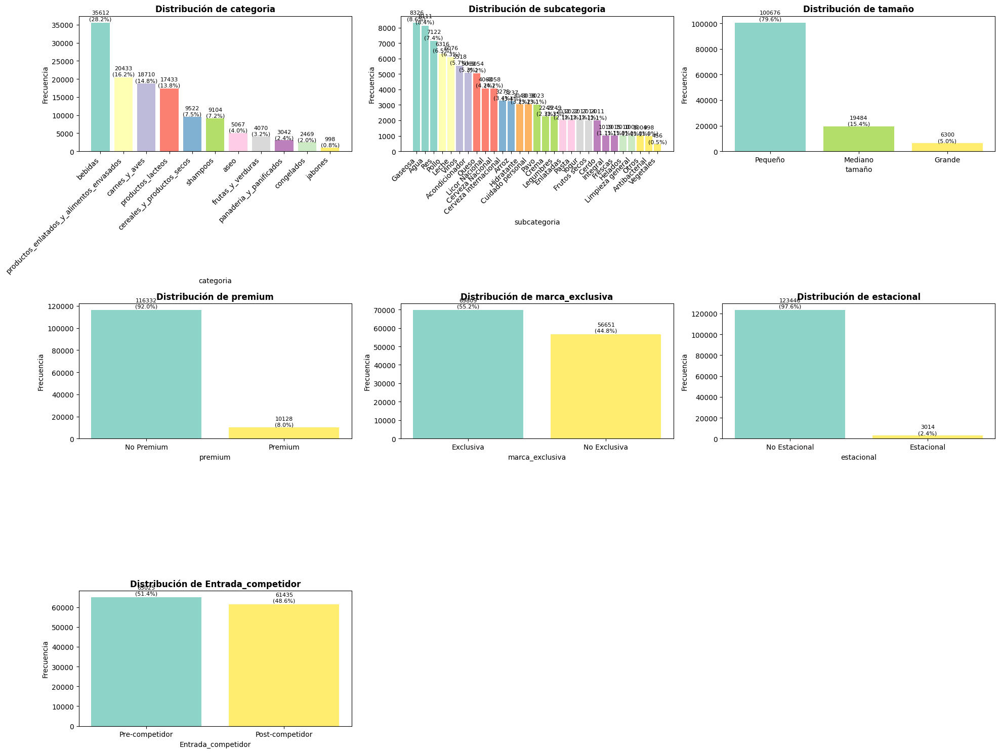


 Resumen estadístico

RESUMEN ESTADÍSTICO - ANÁLISIS UNIVARIADO

CATEGORIA:
--------------------------------------------------
                                           Frecuencia  Proporción  Porcentaje
categoria                                                                    
bebidas                                         35612       0.282      28.161
productos_enlatados_y_alimentos_envasados       20433       0.162      16.158
carnes_y_aves                                   18710       0.148      14.795
productos_lacteos                               17433       0.138      13.785
cereales_y_productos_secos                       9522       0.075       7.530
shampoos                                         9104       0.072       7.199
aseo                                             5067       0.040       4.007
frutas_y_verduras                                4070       0.032       3.218
panaderia_y_panificados                          3042       0.024       2.406
congelados    

In [27]:
# Ejecutar análisis univariado completo con las funciones
print("ANÁLISIS UNIVARIADO DE VARIABLES CATEGÓRICAS")
print("="*80)

# 1. Crear gráficos de barras
print("\n Visualizaciones")
fig, axes = plot_categorical_univariate(
    df_cat=df_cat, 
    categorical_vars=categorical_vars,
    figsize=(20, 15),
    style='default',
    palette='husl'
)
plt.show()

# 2. Generar resumen estadístico
print("\n Resumen estadístico")
summary_results = categorical_univariate_summary(
    df_cat=df_cat, 
    categorical_vars=categorical_vars,
    show_percentages=True
)





#### 4.2.2 Análisis Bivariado - Variables Categóricas

ANÁLISIS BIVARIADO: Variables Categóricas vs Demanda

CATEGORIA - Estadísticas de Demanda por categoría:
------------------------------------------------------------
                                            mean  median    std
categoria                                                      
aseo                                       368.2   311.0  217.9
bebidas                                    337.3   325.0  208.7
carnes_y_aves                              352.6   311.0  208.6
cereales_y_productos_secos                 321.1   261.0  177.9
congelados                                 198.4   184.0   68.4
frutas_y_verduras                          242.4   230.0  162.5
jabones                                    363.8   353.5   95.5
panaderia_y_panificados                    281.7   258.0  133.8
productos_enlatados_y_alimentos_envasados  319.6   299.0  185.7
productos_lacteos                          298.4   257.0  203.2
shampoos                                   260.4   202.0  152.6

S

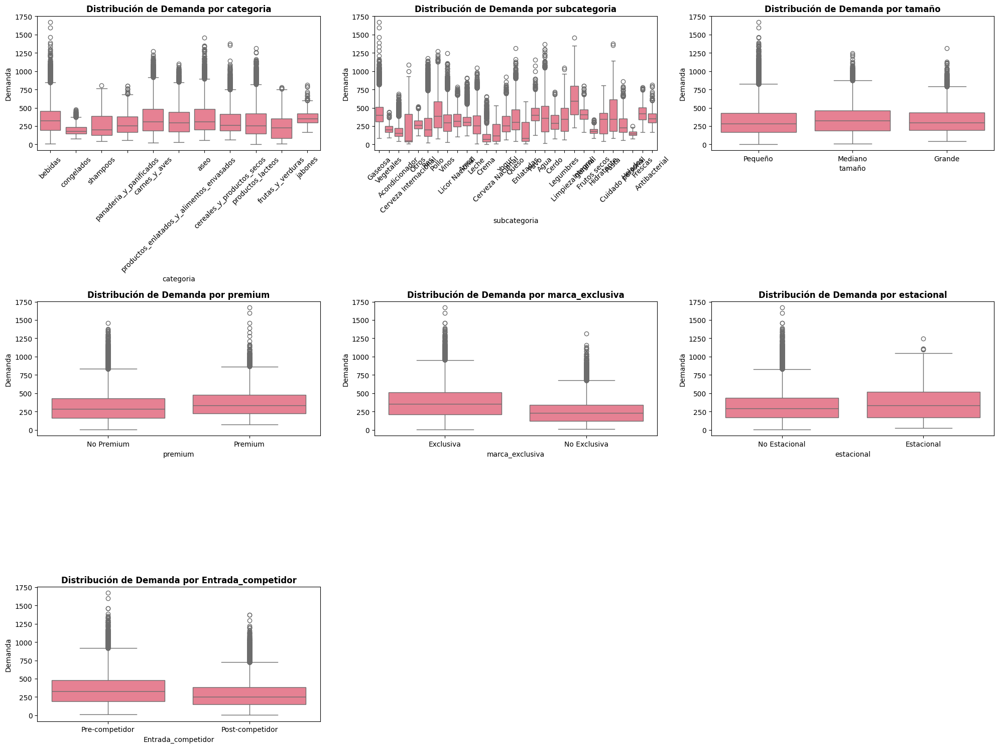

In [28]:
# Análisis bivariado: Variables categóricas vs Demanda
print("ANÁLISIS BIVARIADO: Variables Categóricas vs Demanda")
print("="*80)

# Crear gráficos de boxplots para cada variable categórica vs demanda
fig, axes = plt.subplots(3, 3, figsize=(20, 15))
axes = axes.flatten()

for i, var in enumerate(categorical_vars):
    ax = axes[i]
    
    # Crear boxplot
    box_plot = sns.boxplot(data=df_cat, x=var, y='demanda', ax=ax)
    
    # Configurar el gráfico
    ax.set_title(f'Distribución de Demanda por {var}', fontsize=12, fontweight='bold')
    ax.set_xlabel(var, fontsize=10)
    ax.set_ylabel('Demanda', fontsize=10)
    
    # Rotar etiquetas si son muchas categorías
    if len(df_cat[var].unique()) > 5:
        ax.tick_params(axis='x', rotation=45)
    
    # Agregar estadísticas descriptivas
    stats = df_cat.groupby(var)['demanda'].agg(['mean', 'median', 'std']).round(1)
    print(f"\n{var.upper()} - Estadísticas de Demanda por categoría:")
    print("-" * 60)
    print(stats)

# Eliminar ejes vacíos
for i in range(len(categorical_vars), len(axes)):
    axes[i].remove()

plt.tight_layout()
plt.show()

**Observaciones**

- Se verifica a partir de los gráficos que las diferentes categorías de las variables categóricas parecen mostrar diferencias con la cantidad de ventas. La diferencia en las ventas de productos de distintos tamaños parece ser pequeña, por lo que se sugiere realizar pruebas estadísticas de diferencias de medias para definir si la variable es o no relevante. 


#### 4.2.3 Análisis Multivariado - Variables Categóricas

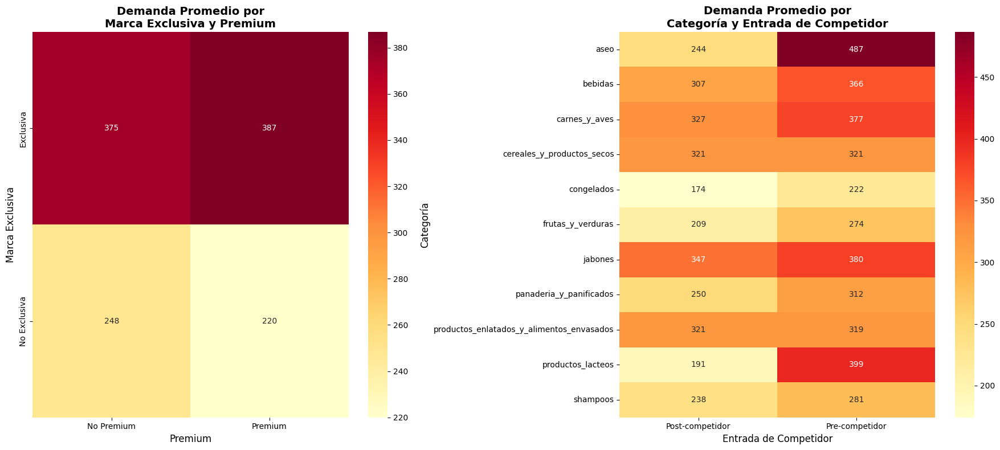

In [29]:
# Visualización multivariada con facets y heatmaps

# Crear subplot con dos heatmaps
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Heatmap 1: Demanda promedio por Marca Exclusiva y Premium
demand_heatmap_1 = df_cat.groupby(['marca_exclusiva', 'premium'])['demanda'].mean().unstack()
sns.heatmap(demand_heatmap_1, annot=True, fmt='.0f', cmap='YlOrRd', ax=axes[0])
axes[0].set_title('Demanda Promedio por\nMarca Exclusiva y Premium', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Premium', fontsize=12)
axes[0].set_ylabel('Marca Exclusiva', fontsize=12)

# Heatmap 2: Demanda promedio por Categoría y Entrada de Competidor
demand_heatmap_2 = df_cat.groupby(['categoria', 'Entrada_competidor'])['demanda'].mean().unstack()
sns.heatmap(demand_heatmap_2, annot=True, fmt='.0f', cmap='YlOrRd', ax=axes[1])
axes[1].set_title('Demanda Promedio por\nCategoría y Entrada de Competidor', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Entrada de Competidor', fontsize=12)
axes[1].set_ylabel('Categoría', fontsize=12)

# Rotar etiquetas del eje Y en el segundo heatmap para mejor legibilidad
axes[1].tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.show()



In [30]:
# Análisis detallado de diferencias promedio por categoría


# Calcular demanda promedio pre y post competidor por categoría
comparison_df = df_cat.groupby(['categoria', 'Entrada_competidor'])['demanda'].mean().unstack()
comparison_df.columns.name = None  # Remover el nombre de las columnas

# Calcular diferencias
comparison_df['Diferencia_Absoluta'] = comparison_df['Post-competidor'] - comparison_df['Pre-competidor']
comparison_df['Diferencia_Porcentual'] = (comparison_df['Diferencia_Absoluta'] / comparison_df['Pre-competidor']) * 100

# Ordenar por diferencia porcentual (de mayor a menor impacto negativo)
comparison_df = comparison_df.sort_values('Diferencia_Porcentual', ascending=True)


print(f"Promedio de diferencia porcentual total: {comparison_df['Diferencia_Porcentual'].mean():.2f}%")
print("ANÁLISIS DE DIFERENCIAS PROMEDIO POR CATEGORÍA")
comparison_df

Promedio de diferencia porcentual total: -20.03%
ANÁLISIS DE DIFERENCIAS PROMEDIO POR CATEGORÍA


,Post-competidor,Pre-competidor,Diferencia_Absoluta,Diferencia_Porcentual
categoria,,,,
productos_lacteos,191.480440,399.163286,-207.682846,-52.029546
aseo,244.364003,486.643105,-242.279102,-49.785787
frutas_y_verduras,208.754937,274.186158,-65.431221,-23.863794
congelados,174.192086,221.817675,-47.625589,-21.470602
panaderia_y_panificados,249.663286,311.980806,-62.317520,-19.974793
bebidas,306.853133,365.979870,-59.126737,-16.155735
shampoos,238.127886,281.318609,-43.190723,-15.352956
carnes_y_aves,326.645751,377.092354,-50.446603,-13.377785
jabones,346.617587,380.400786,-33.783199,-8.880949


**Observaciones**

- En esta parte del análisis se buscaba evidencia sobre interacción entre variables relevantes o correlaciones altas que pudieran generar multicolinealidad.
- Puntualmente, verificar si hay indicios de multicolinealidad entre marca exclusiva y marca premium, ya que los nombres indican una relación. Sin embargo, el gráfico sugiere que no existe una correlación, ya que tanto en productos premium como no premium, las ventas de marca exclusiva fueron significativamente mayores.
- También, es de interés revisar si existe interacción entre las ventas por categoría y la entrada de un competidor. Los datos muestran que para la mayoría de las categorías las ventas cayeron después de la entrada del competidor, con algunas excepciones como productos enlatados y alimentos envasados que mejoraron marginalmente (0.6%), las ventas se redujeron en promedio -20.03%, siendo la categoría productos lacteos la que recibió el mayor impacto de -52,03%. 
- Nota: Para un análisis con mayor profundidad sobre relación entre variables categoricas se recomienda implementar un análisis de correspondencias con el cuál se puede validar estadísticamente estas hipótesis, además de visualizar de forma más sencilla la relación entre estas.


## 5. Análisis de Series de Tiempo

- **Variación porcentual**: Cambios relativos en la demanda
- **Descomposición estacional**: Tendencia, estacionalidad y residuos
- **Estacionalidad por años**: Patrón mensual con líneas por año
- **Autocorrelación (ACF)**: Correlación de la serie consigo misma en diferentes lags
- **Autocorrelación Parcial (PACF)**: Correlación directa entre observaciones separadas por k períodos




In [31]:
# Importaciones adicionales para análisis de series de tiempo
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.dates as mdates
from matplotlib.patches import Rectangle

In [32]:
# Preparar datos para análisis de series de tiempo
print("PREPARACIÓN DE DATOS PARA ANÁLISIS DE SERIES DE TIEMPO")
print("="*60)
df.drop(columns= "Unnamed: 0", inplace=True)
# Convertir fecha a datetime si no está ya
df['date'] = pd.to_datetime(df['date'])

PREPARACIÓN DE DATOS PARA ANÁLISIS DE SERIES DE TIEMPO


### 5.1 Análisis Global
Analizaremos los patrones temporales (estacionalidad, tendencia, autocorrelación) considerando todos los datos como una serie agregada.


In [33]:
# Crear dataset agregado para análisis global 
df_global = df.groupby('date').agg({
    'demanda': 'sum',
    'Entrada_competidor': 'first'
}).reset_index()

print(f"\nPrimeras 5 observaciones del dataset global:")
df_global.to_csv("Data/df_global.csv", index=False)


Primeras 5 observaciones del dataset global:


(<Figure size 1920x1300 with 9 Axes>,
 array([[<Axes: title={'center': 'Serie Temporal Diaria'}, xlabel='Fecha', ylabel='Demanda'>,
         <Axes: title={'center': 'Serie Temporal Mensual'}, xlabel='Año-Mes', ylabel='Demanda Mensual (Millones)'>,
         <Axes: title={'center': 'Serie Temporal Trimestral'}, xlabel='Año-Trimestre', ylabel='Demanda Trimestral (Millones)'>],
        [<Axes: title={'center': 'Patrón Estacional por Años'}, xlabel='Mes', ylabel='Demanda Total (Millones)'>,
         <Axes: title={'center': 'Demanda Total por Año'}, xlabel='Año', ylabel='Demanda Total'>,
         <Axes: title={'center': 'Evolución Mensual Promedio'}, xlabel='Mes', ylabel='Demanda Promedio'>],
        [<Axes: title={'center': 'Variación Porcentual'}, xlabel='Fecha', ylabel='Variación Porcentual (%)'>,
         <Axes: title={'center': 'Distribución de Demanda por Período'}, xlabel='Período', ylabel='Demanda'>,
         <Axes: title={'center': 'Volatilidad de la Demanda'}, xlabel='Fecha', ylabe

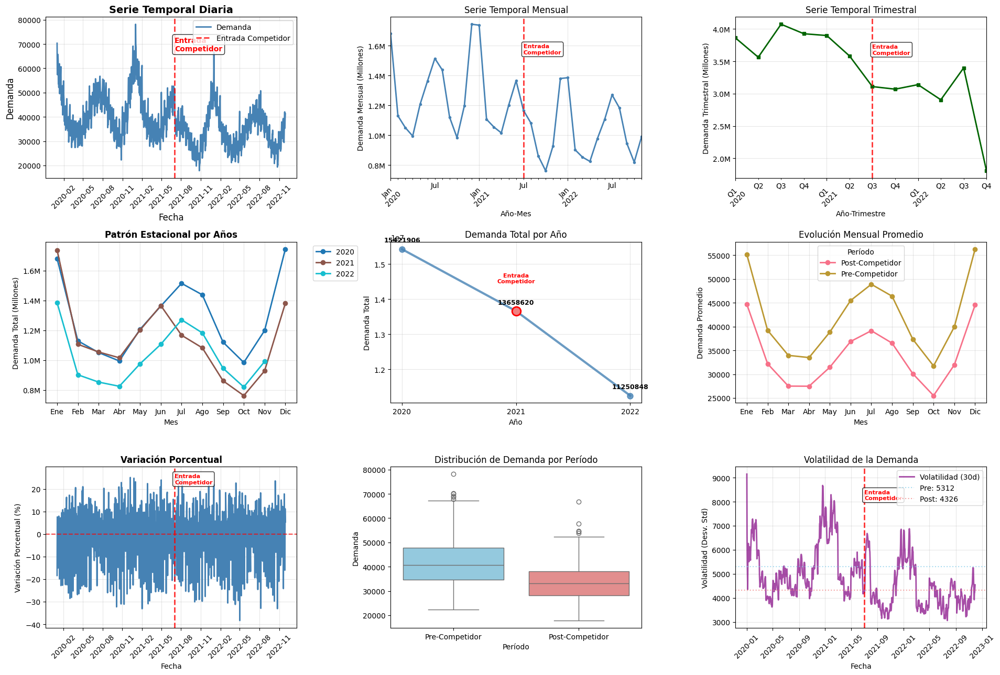

In [34]:
# Análisis completo global
plot_competitor_impact_analysis(df_global, title="Impacto Global")


**Observaciones**

- Los primeros tres gráficos, con periodicidad diaria, mensual y trimestral, muestran una tendencia general decreciente junto con un patrón recurrente de picos y valles en los mismos meses, lo que evidencia una marcada estacionalidad en la demanda. Asimismo, se observa que la entrada de un competidor provocó un cambio en el nivel medio de la serie; sin embargo, los patrones estacionales y de corto plazo se mantuvieron estables. Esto sugiere que el impacto se reflejó principalmente en el volumen total de ventas, sin alterar el comportamiento de compra de los consumidores a lo largo del año.

- En los tres gráficos siguientes, la tendencia descendente de las ventas se aprecia con mayor nitidez: una disminución del 11 % en 2021 y del 17 % en 2022. El patrón estacional es más evidente, y se distingue un impacto del competidor sobre este patrón. En particular, en julio de 2021, cuando se esperaba un incremento estacional, se registró una caída, y a partir de ese momento la media mensual de ventas se mantuvo por debajo de los niveles previos. Cabe destacar que el primer mes tras la entrada del competidor fue el de mayor impacto sobre la demanda, aunque esta caída específica de julio no se repitió en 2022.

- Al comparar las ventas promedio mensuales entre ambos periodos, se confirma que la estacionalidad se mantiene, pero las ventas del periodo posterior a la entrada del competidor son claramente inferiores a las del periodo previo.

- Con la entrada del competidor, la distribución de los datos cambió de manera importante. La mediana disminuyó y el rango entre el cuartil 2 y el cuartil 3 se redujo, indicando que ahora las ventas medias se concentran en un rango menor y más bajo. Además, los bigotes se acortaron, reflejando que tanto los valores extremos como los casos atípicos también son más bajos que antes, lo que muestra una disminución general en los niveles de ventas, incluyendo los picos altos que se observaban previamente.

- Se observa que la tendencia de la volatilidad se ha reducido con la entrada del competidor, lo que indica que el competidor también tuvo un efecto sobre la estabilidad de la demanda, es decir que hay menos chance de encontrar ventas muy altas. También se observa que la variación de la volatilidad no es constante, hay unos periodos con mayor volatilidad que otros, es el caso del periodo entre enero y mayo de octubre a enero donde los picos son más altos y se mantienen por mayor tiempo. 

(<Figure size 1800x2000 with 12 Axes>,
 array([<Axes: title={'center': 'categoria: productos_lacteos'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: aseo'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: frutas_y_verduras'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: congelados'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: panaderia_y_panificados'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: bebidas'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: shampoos'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: carnes_y_aves'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: jabones'}, xlabel='Fecha', ylabel='Demanda'>,
        <Axes: title={'center': 'categoria: cereales_y_productos_secos'}, xlabel='Fecha', ylabel='Demanda'>,

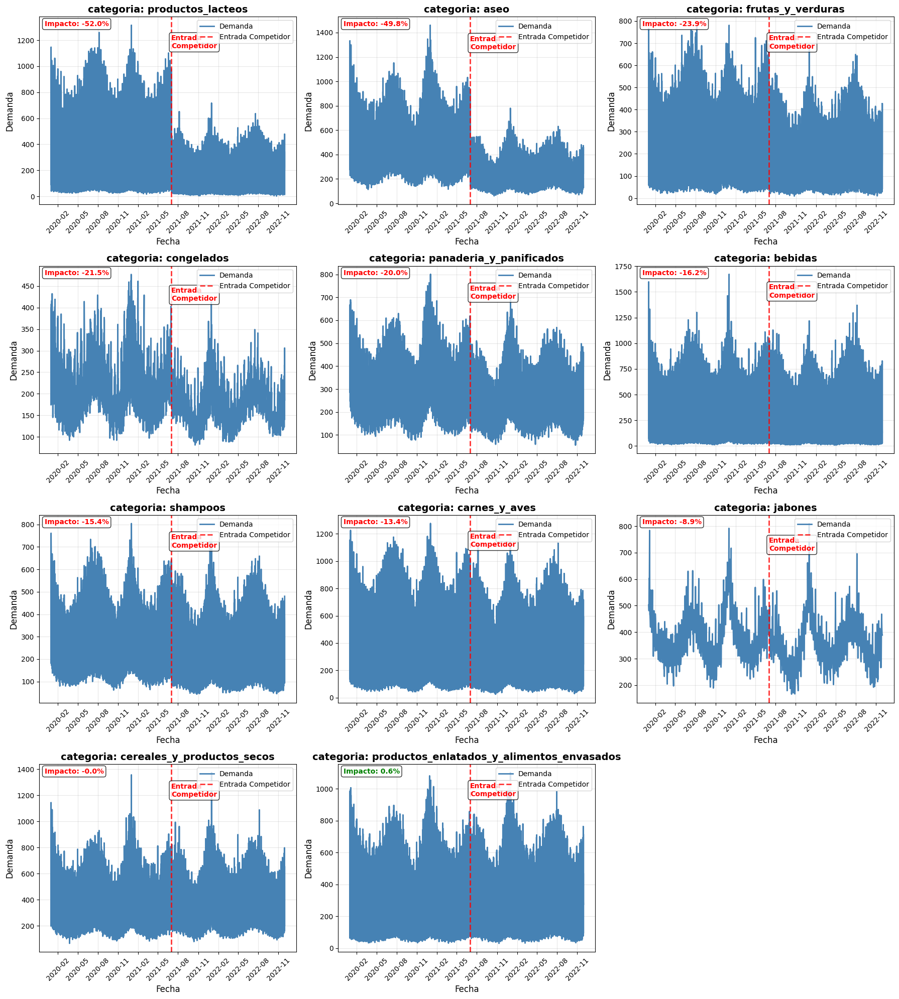

In [35]:
# Análisis completo por categorías
plot_competitor_impact_analysis(df, group_col='categoria', title="Impacto por Categoría")

**Observaciones**

- Se observa que el impacto de la entrada del competidor fue distinto entre las categorías, y que el volumen de ventas entre estas tambien es significativamente distinto. Todas las categorías se vieron afectadas, con la excepción de los productos enlatados. Esto sugiere que, si bien un modelo global podría servir como punto de partida, la estrategia más adecuada será desarrollar modelos específicos. 



Generando análisis de estacionalidad para 11 categorias
Máximo de gráficos por bloque: 12
Ordenamiento: De mayor variación negativa (-52.0%) a menor variación negativa (0.6%)
Bloque 1/1 completado (11 gráficos)


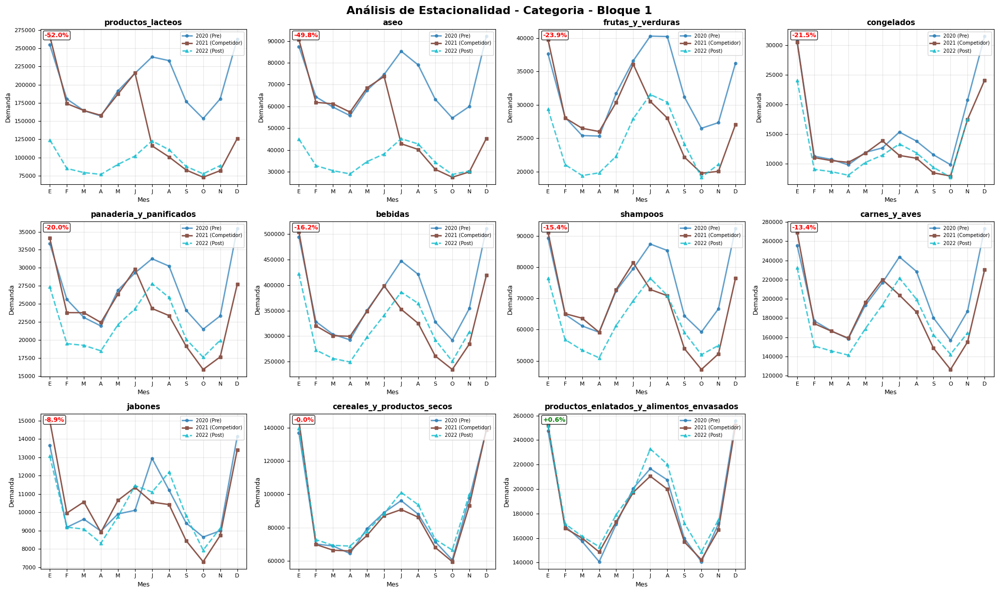

In [36]:
figures_categorias = plot_seasonal_analysis_by_column(
    data=df,
    group_col='categoria',

    max_plots_per_subplot=12,
    figsize_per_plot=(5, 4)
)

**Observaciones**

- Las ventas por categoría replican de forma consistente el patrón observado en la serie global. No obstante, existen diferencias relevantes entre ellas. Algunas categorías presentan una mayor diferencia con la serie global, como en el caso de los jabones, que en ciertos periodos muestran un comportamiento opuesto a la estacionalidad global —por ejemplo, en febrero, cuando sus ventas aumentan en lugar de disminuir. Otras categorías, como los congelados y los cereales, registran incrementos menos pronunciados en junio.

- En cuanto a la resiliencia frente a la entrada del competidor, destacan los productos enlatados, congelados y cereales, cuyas ventas se redujeron poco, durante y después de la llegada de nuevos jugadores al mercado. Por el contrario, categorías como aseo, carnes, frutas y verduras, productos lácteos y panaderías sufrieron un mayor impacto. 

ANÁLISIS DE AUTOCORRELACIÓN - SERIE GLOBAL


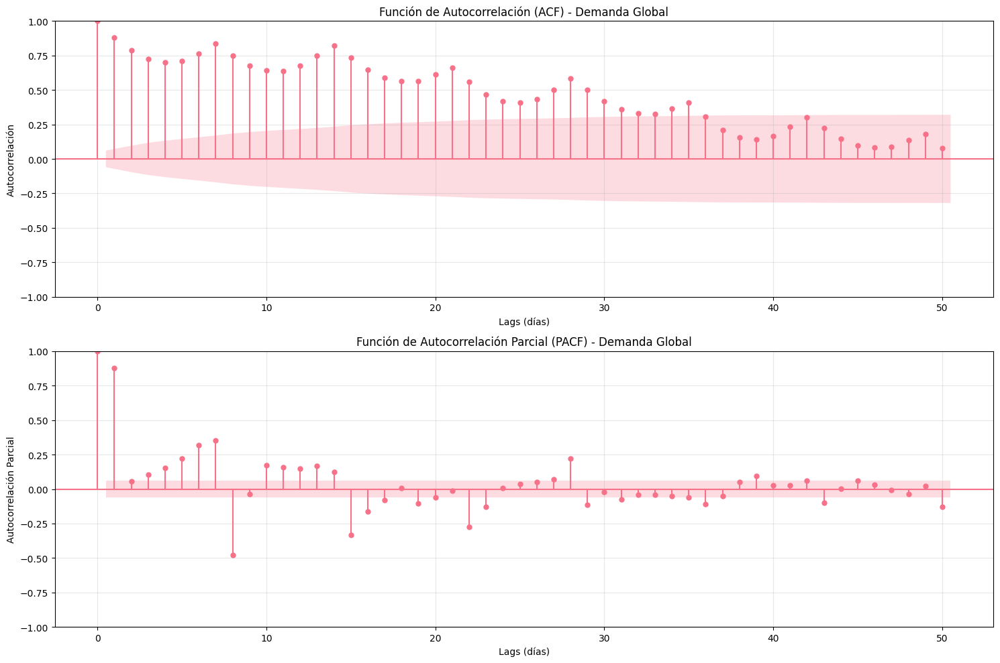


Estadísticas de Autocorrelación:
----------------------------------------
Primeros valores de ACF:
Lag 0: 1.0000
Lag 1: 0.8791
Lag 2: 0.7857
Lag 3: 0.7253
Lag 4: 0.6996
Lag 5: 0.7123
Lag 6: 0.7655
Lag 7: 0.8340
Lag 8: 0.7481
Lag 9: 0.6741
Lag 10: 0.6409
Lag 11: 0.6390
Lag 12: 0.6743
Lag 13: 0.7486
Lag 14: 0.8216
Lag 15: 0.7344
Lag 16: 0.6461
Lag 17: 0.5882
Lag 18: 0.5632
Lag 19: 0.5654
Lag 20: 0.6114

Primeros valores de PACF:
Lag 0: 1.0000
Lag 1: 0.8799
Lag 2: 0.0570
Lag 3: 0.1070
Lag 4: 0.1527
Lag 5: 0.2246
Lag 6: 0.3235
Lag 7: 0.3621
Lag 8: -0.4851
Lag 9: -0.0393
Lag 10: 0.1811
Lag 11: 0.1658
Lag 12: 0.1569
Lag 13: 0.1754
Lag 14: 0.1305
Lag 15: -0.3443
Lag 16: -0.1746
Lag 17: -0.0858
Lag 18: 0.0126
Lag 19: -0.1057
Lag 20: -0.0668


In [37]:
# Análisis de Autocorrelación (ACF) y Autocorrelación Parcial (PACF)
print("ANÁLISIS DE AUTOCORRELACIÓN - SERIE GLOBAL")
print("="*60)

# Crear figura con subplots para ACF y PACF
fig, axes = plt.subplots(2, 1, figsize=(15, 10))

# ACF (Autocorrelation Function)
plot_acf(df_global['demanda'], lags=50, ax=axes[0], title='Función de Autocorrelación (ACF) - Demanda Global')
axes[0].set_xlabel('Lags (días)')
axes[0].set_ylabel('Autocorrelación')
axes[0].grid(True, alpha=0.3)

# PACF (Partial Autocorrelation Function) 
plot_pacf(df_global['demanda'], lags=50, ax=axes[1], title='Función de Autocorrelación Parcial (PACF) - Demanda Global')
axes[1].set_xlabel('Lags (días)')
axes[1].set_ylabel('Autocorrelación Parcial')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Estadísticas adicionales de autocorrelación
print("\nEstadísticas de Autocorrelación:")
print("-" * 40)

# Calcular ACF y PACF numéricamente
acf_values = acf(df_global['demanda'], nlags=50)
pacf_values = pacf(df_global['demanda'], nlags=50)

# Mostrar primeros 10 valores
print("Primeros valores de ACF:")
for i, val in enumerate(acf_values[:21]):
    print(f"Lag {i}: {val:.4f}")

print(f"\nPrimeros valores de PACF:")
for i, val in enumerate(pacf_values[:21]):
    print(f"Lag {i}: {val:.4f}")



**Observaciones**

- La persistencia de los rezagos en la ACF indican una alta autocorrelación de la serie. La ACF cae en los rezagos del 1 al 5, y luego sube entre el 5 y el 7, luego vuelve a caer entre el 8 y el 11, y vuelve a subir, y caer y repite este patrón ondulatorio hasta que los rezagos ya no son significativos. 

- El primer rezago de la PACF indica una alta correlación con el primer periodo inmediato, del 2 al 7, también se observan positivos pero pequeños, y el rezago 8 presenta un quiebra claro negativo. 

- La persistencia y la ondulación parecen indicar una alta autocorrelación y un componente cíclico.



### 5.2 Análisis por producto

Generando análisis de estacionalidad para 135 id_productos
Máximo de gráficos por bloque: 12
Ordenamiento: De mayor variación negativa (-57.4%) a menor variación negativa (12.8%)
Bloque 1/12 completado (12 gráficos)
Bloque 2/12 completado (12 gráficos)
Bloque 3/12 completado (12 gráficos)
Bloque 4/12 completado (12 gráficos)
Bloque 5/12 completado (12 gráficos)
Bloque 6/12 completado (12 gráficos)
Bloque 7/12 completado (12 gráficos)
Bloque 8/12 completado (12 gráficos)
Bloque 9/12 completado (12 gráficos)
Bloque 10/12 completado (12 gráficos)
Bloque 11/12 completado (12 gráficos)
Bloque 12/12 completado (3 gráficos)


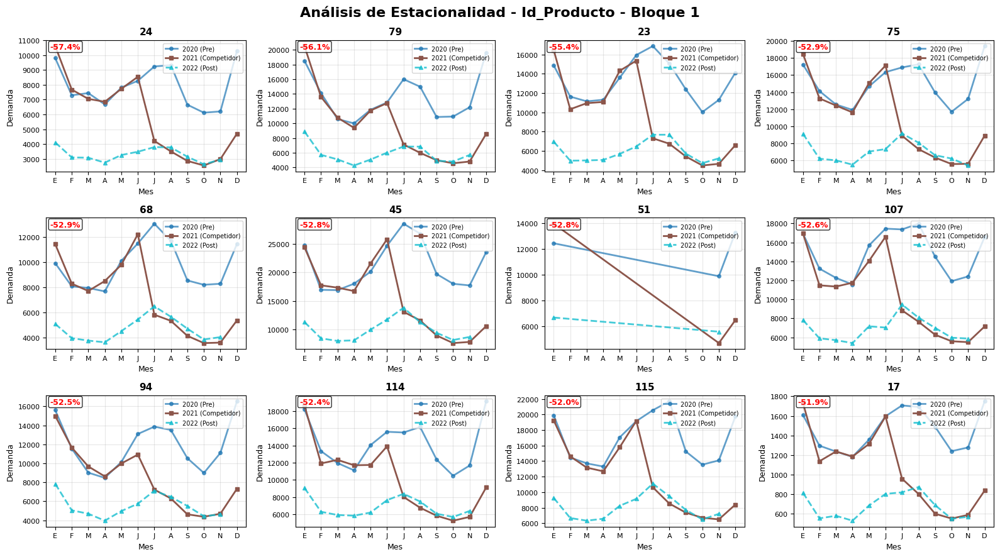

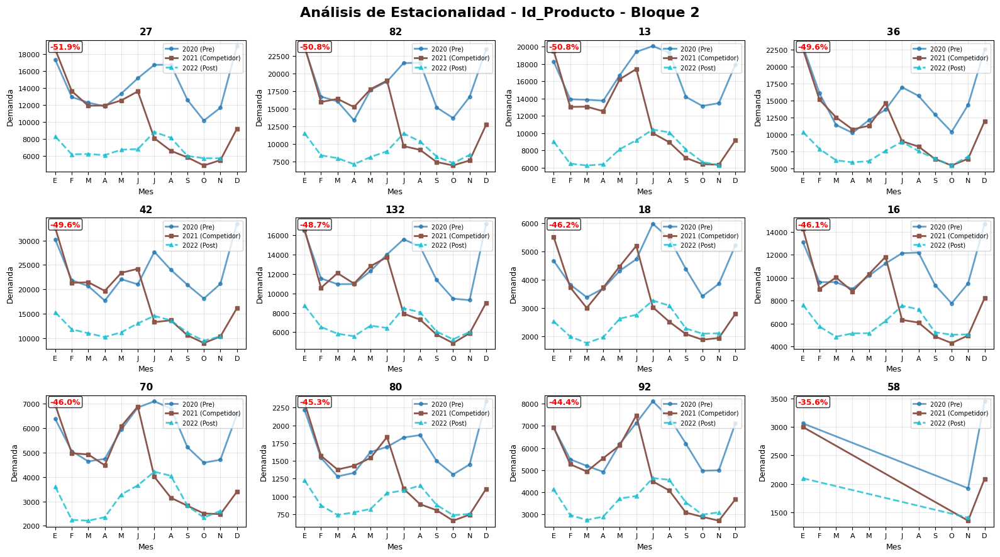

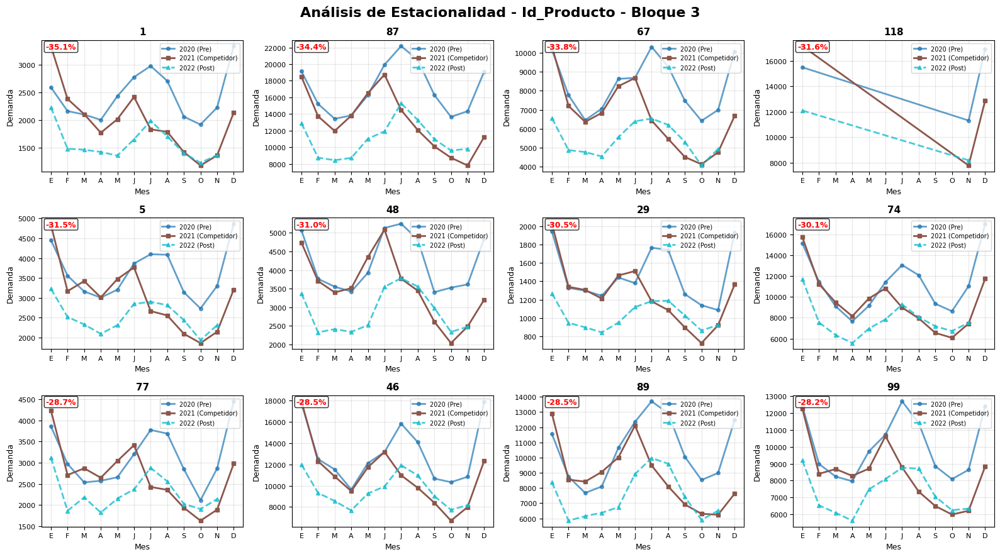

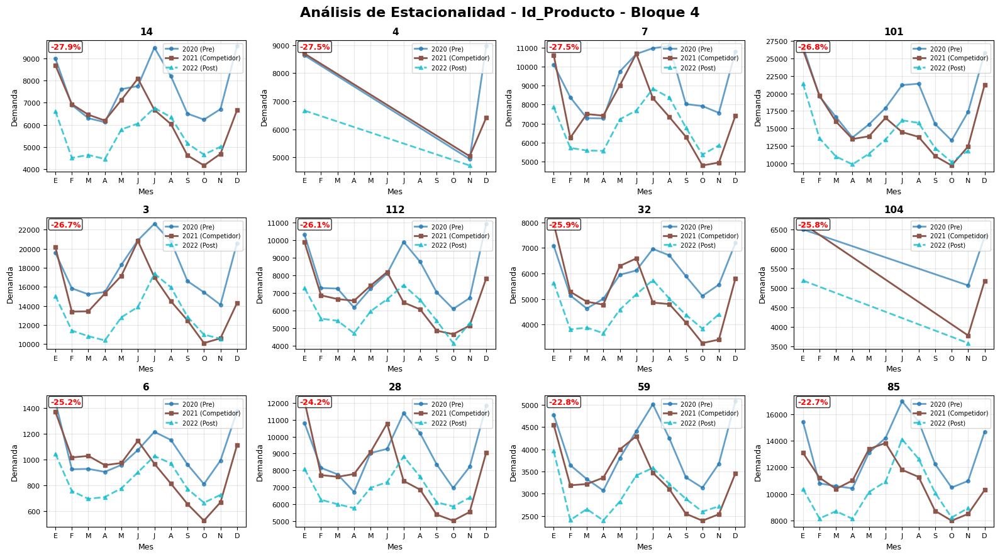

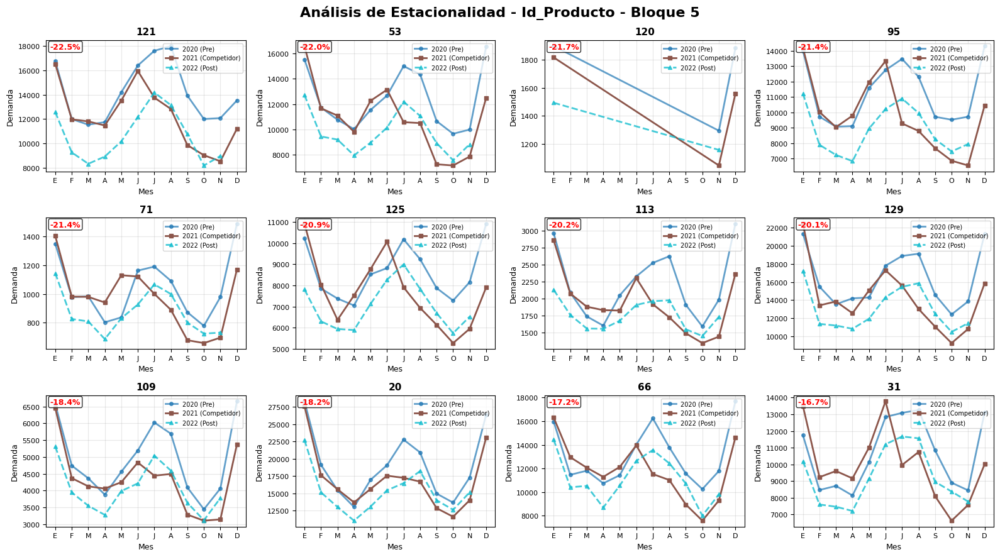

...

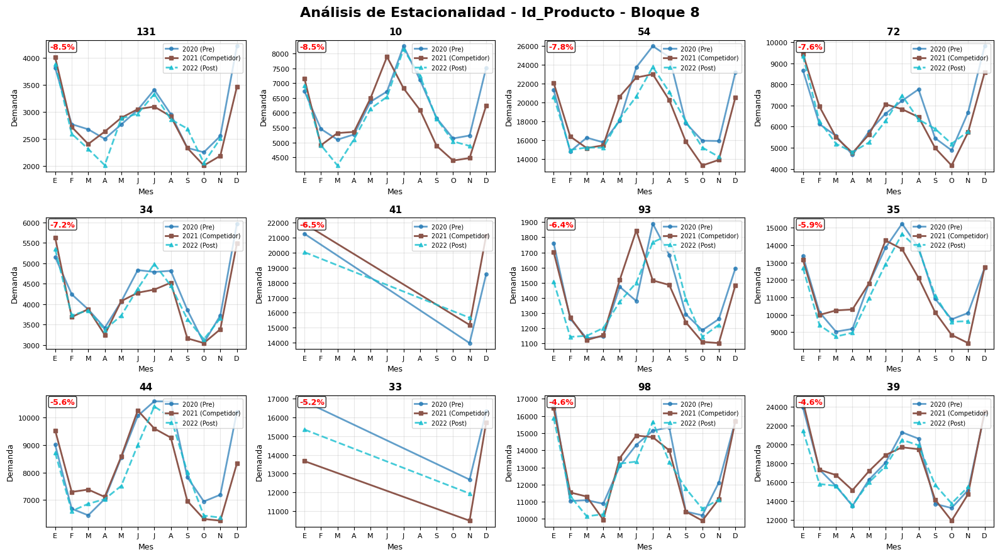

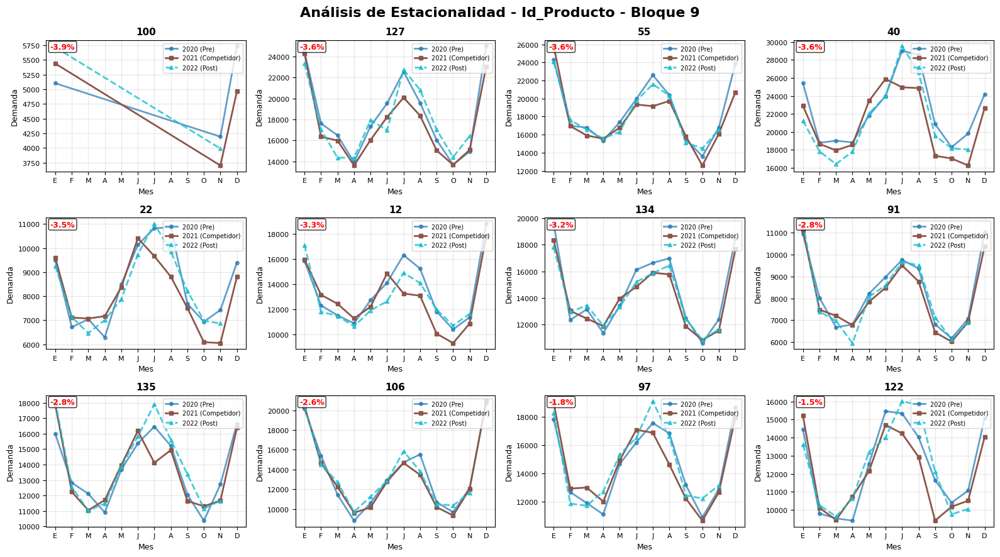

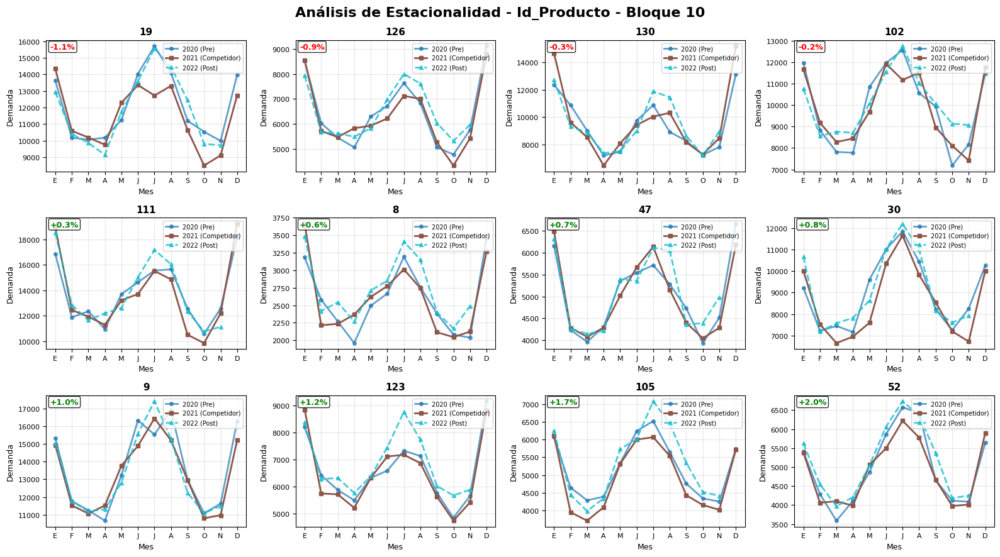

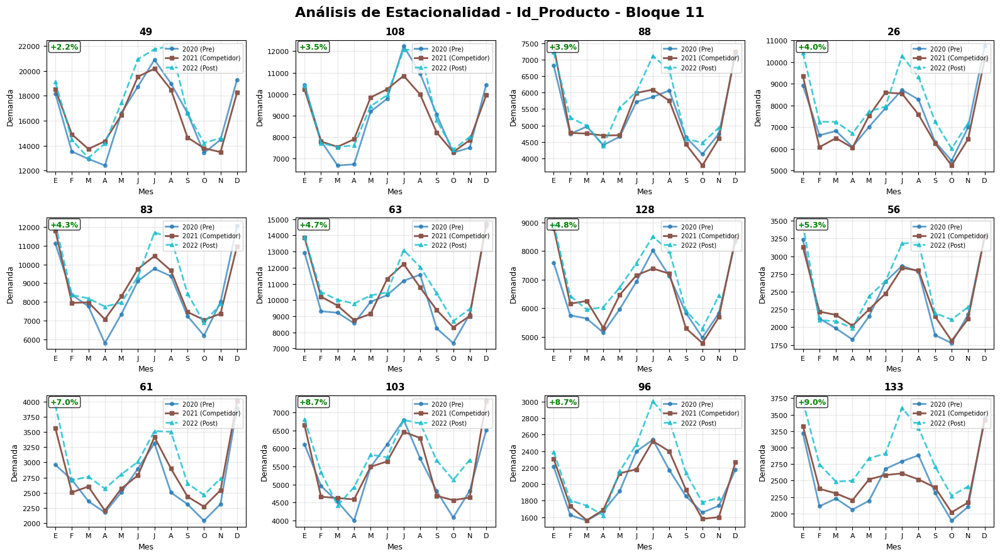

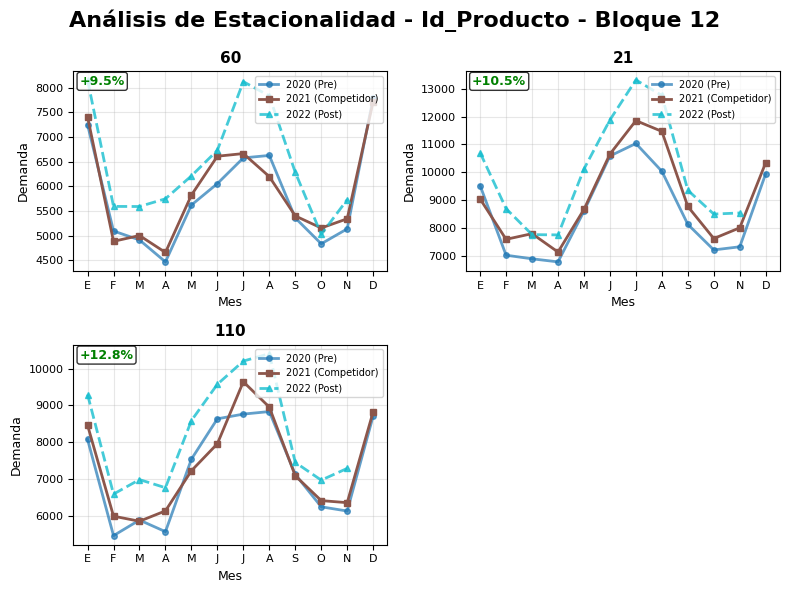

In [38]:
figures_detalle = plot_seasonal_analysis_by_column(
    data=df,
    group_col='id_producto',
    max_plots_per_subplot=12,
    figsize_per_plot=(4, 3)
)

**Observaciones**

- 69 productos tuvieron una reducción importante entre el 15% y 57%. 43 productos fueron más resilientes y tuvieron una reducción entre 0.2% y 14.4%. 23 productos tuvieron un incremento entre 0.3% y 12.8%. Esto indica que el efecto del competidor no es homogeneo para los diferentes productos.
- 13 productos tuvieron ventas discontinuas, es decir, en varios meses del año no registraron ninguna venta, estos fueron los productos: 51, 58, 118, 4, 104, 120, 69, 86, 90, 15, 41, 33,100.
- Aunque el patrón estacional se mantiene en mayor medida en la mayoría de los productos, se evidencian
variaciones importantes a lo largo de los meses de producto a producto, indicando que incluso los productos que tienen ventas continuas tienen comportamientos específicos que pueden no ser capturados por un modelo global. 

## 6. Respuesta a preguntas de negocio

### 6.1 ¿Cuál fué el impacto de la apertura del competidor? Por favor cuantifíquelo

In [39]:
# Auto ARIMA usando pmdarima
from pmdarima import auto_arima
import warnings
warnings.filterwarnings('ignore')

# Preparar la serie
ts = df_global.set_index('date')['demanda']

PRUEBA DE ESTACIONARIEDAD - TEST ADF

SERIE ORIGINAL
--------------
Estadístico ADF: -5.646454
p-valor: 0.000001
Valores críticos:
	1%: -3.437
	5%: -2.864
	10%: -2.568
✓ RESULTADO: Serie ESTACIONARIA (rechazamos H0)


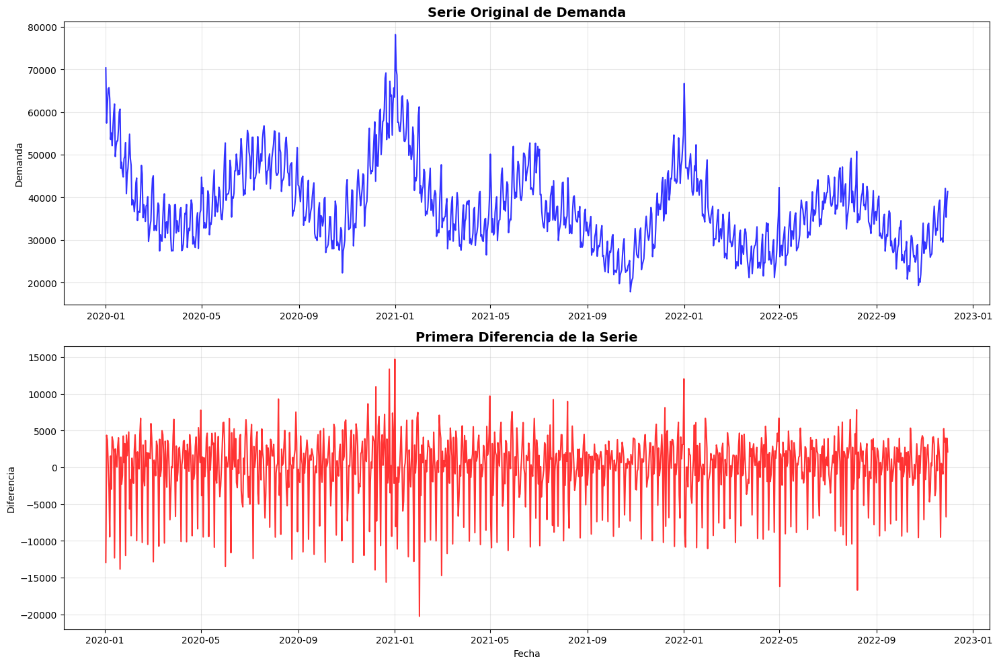


PRIMERA DIFERENCIA
------------------
Estadístico ADF: -3.273952
p-valor: 0.016084
Valores críticos:
	1%: -3.437
	5%: -2.864
	10%: -2.568
✓ RESULTADO: Serie ESTACIONARIA (rechazamos H0)


In [40]:
# Prueba de Estacionariedad - Test de Dickey-Fuller Aumentado (ADF)
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
from src.econometric_tools import adf_test
print("PRUEBA DE ESTACIONARIEDAD - TEST ADF")
print("=" * 50)



# 1. Probar serie original
is_stationary_original = adf_test(ts, "SERIE ORIGINAL")

# 2. Visualizar la serie y su primera diferencia
fig, axes = plt.subplots(2, 1, figsize=(15, 10))

# Serie original
axes[0].plot(ts.index, ts.values, color='blue', alpha=0.8)
axes[0].set_title('Serie Original de Demanda', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Demanda')
axes[0].grid(True, alpha=0.3)

# Primera diferencia
ts_diff = ts.diff().dropna()
axes[1].plot(ts_diff.index, ts_diff.values, color='red', alpha=0.8)
axes[1].set_title('Primera Diferencia de la Serie', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Diferencia')
axes[1].set_xlabel('Fecha')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# 3. Test ADF en la primera diferencia
is_stationary_diff = adf_test(ts_diff, "PRIMERA DIFERENCIA")



**Observaciones**

- El análisis de ACF y PACF indican una persistencia temporal en la serie, y la prueba de Raiz Unitaria indica que hay evidencia estadísticamente significativa de que la serie es estacionaria, por lo tanto, se valida un supuesto escencial para implementar modelos de la familia ARIMA.

- Con a la ACF los valores más altos están en los lags 7, 14, indicando que hay un patrón ondulante que se repite cada 7 períodos. Lag 1 es muy alto: 0.8799. Lag 2 baja drásticamente y los siguientes son pequeños. Por lo que un modelo SARIMA AR(1) con m= 7 podría ser un buen punto de partida.

- El componente ondulante en la PACF en los rezagos 7 y 14 también sugiere que posiblemente hay un MA estacional.

- Aunque la serie ya es estacionaria , aplicar primeras diferencias reduce la varianza de forma importante.

#### 6.1.1 Modelo base ARIMA

In [41]:
# ARIMA con diferenciación interna (d desde el modelo)
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# Serie en niveles con frecuencia fija
ts = (
    df_global
    .set_index('date')['demanda']
    .sort_index()
    .asfreq('D')   # ajusta 'D' si aplica otra frecuencia
)


model = ARIMA(  
    ts,
    order=(1, 1, 0),            
    seasonal_order=(1, 0, 1, 7),
    trend='n'
)

# Ajustar el modelo
model_fitted = model.fit()

print("\nModelo ajustado: ARIMA(1,1,0)(1,0,0)[7] con diferenciación interna")
print(f"AIC: {model_fitted.aic:.2f}")
print(f"BIC: {model_fitted.bic:.2f}")
print(f"Log-Likelihood: {model_fitted.llf:.2f}")
print("\nResumen del modelo:")
print(model_fitted.summary())


fitted = model_fitted.fittedvalues
resid = model_fitted.resid



Modelo ajustado: ARIMA(1,1,0)(1,0,0)[7] con diferenciación interna
AIC: 19846.32
BIC: 19866.20
Log-Likelihood: -9919.16

Resumen del modelo:
                                     SARIMAX Results                                     
Dep. Variable:                           demanda   No. Observations:                 1065
Model:             ARIMA(1, 1, 0)x(1, 0, [1], 7)   Log Likelihood               -9919.162
Date:                           Wed, 20 Aug 2025   AIC                          19846.324
Time:                                   12:27:13   BIC                          19866.203
Sample:                               01-01-2020   HQIC                         19853.856
                                    - 11-30-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------


Chequeo rápido (primeras 8 obs. tras burn-in y alineación):
                y          yhat        resid
date                                        
2020-01-02  57399  56320.994527  1078.005473
2020-01-03  61745  60266.879861  1478.120139
2020-01-04  65450  60801.615298  4648.384702
2020-01-05  65722  64528.933992  1193.066008
2020-01-06  63035  66103.882168 -3068.882168
2020-01-07  53565  61639.613795 -8074.613795
2020-01-08  55087  64603.924307 -9516.924307
2020-01-09  52103  54906.324400 -2803.324400

Observación con residuo mínimo (posible outlier temprano):
                y          yhat         resid
date                                         
2021-07-03  40587  55129.672015 -14542.672015

MÉTRICAS DE ERROR DEL MODELO (tras descartar las primeras d observaciones)
d descartado (no estacional): 1
MAE : 1982.8886
RMSE: 2721.4131
MAPE: 5.21%
sMAPE: 5.18%

ESTADÍSTICAS DE RESIDUOS
Media de residuos            : -91.261987
Desviación estándar residuos : 2721.161535
Mínimo residuo 

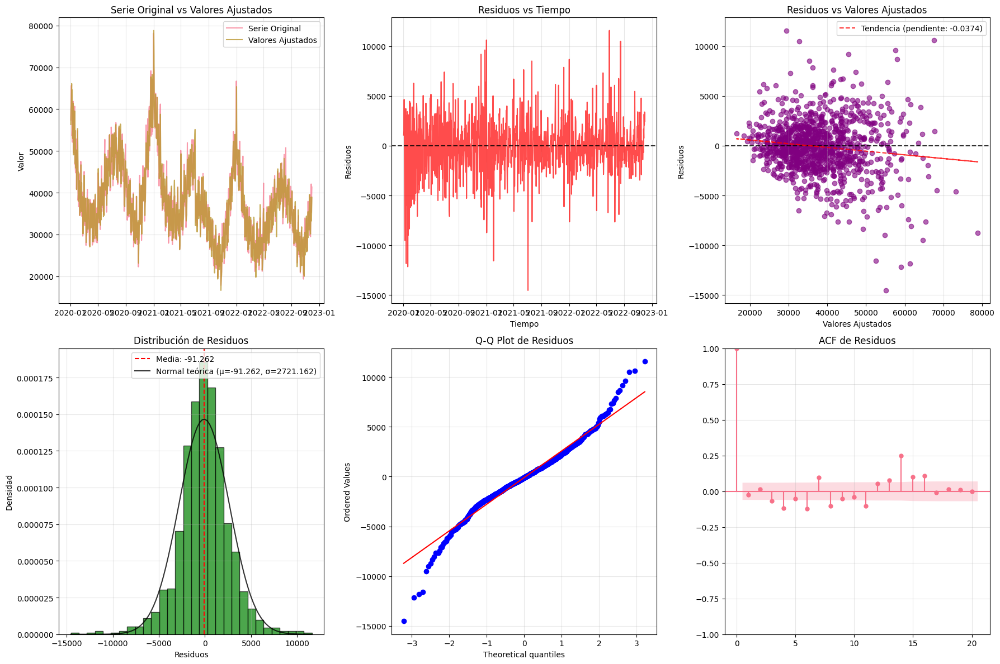


PRUEBAS DE NORMALIDAD DE RESIDUOS
Test Jarque-Bera (Normalidad):
  Estadístico: 337.2582
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

Test Shapiro-Wilk (Normalidad):
  Estadístico: 0.9686
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

PRUEBAS DE AUTOCORRELACIÓN DE RESIDUOS
Test Ljung-Box (Autocorrelación en residuos):
      lb_stat     lb_pvalue
1    0.662676  4.156166e-01
2    0.852739  6.528751e-01
3    5.604351  1.325288e-01
4   20.064700  4.849242e-04
5   22.943500  3.460655e-04
6   38.595217  8.591475e-07
7   48.396502  2.978379e-08
8   59.362908  6.214365e-10
9   62.099475  5.271278e-10
10  63.952734  6.425834e-10

Interpretación: Hay autocorrelación significativa en los residuos
Lags con autocorrelación significativa: 7/10

PRUEBAS DE HETEROCEDASTICIDAD DE RESIDUOS
Test Breusch-Pagan (Heterocedasticidad):
  Estadístico: 92.4621
  p-valor: 0.0000
  Interpretación: Hay heterocedasticidad

Test White (Heterocedasticidad):
  Estadístico: 117.

In [42]:
# Análisis completo de residuos usando las funciones para statsmodels
from src.econometric_tools import analyze_residuals_statsmodels


# Ejecutar el análisis completo usando el modelo de statsmodels
results = analyze_residuals_statsmodels(model_fitted, ts, figsize=(18, 12))



**Observaciones**

- Si bien el modelo parece tener un buen comportamiento para ajustarse a la serie, y los gráficos lucen como los de una distribución normal, las pruebas estadísticas indican que estos no fueron normales, homocedasticos y que tienen autocorrelación. En el q-q plot se observan valores extremos y el gráfico de residuos vs valores ajustados indica que hay una tendencia negativa en los residuos.

- Por las anteriores razones, se propone transformar la serie a logaritmos para reducir el impacto de los valores extremos e incorporar la información de entrada del competidor para reducir la tendencia negativa de los residuos.

#### 6.1.2 Modelo SARIMA con serie en logaritmos

In [43]:
# ARIMA en LOGS con diferenciación interna (d desde el modelo)
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

# ===============================
# Serie en niveles con frecuencia fija
# ===============================
if 'date' in df_global.columns:
    ts = (
        df_global
        .set_index('date')['demanda']
        .sort_index()
        .asfreq('D')   
    )
else:
    ts = (
        df_global['demanda']
        .sort_index()
        .asfreq('D')
    )

# ===============================
# Transformación a log
# ===============================

ts_log = np.log1p(ts)

print("Ajustando modelo ARIMA(1,1,0)(1,0,1)[7] sobre la SERIE EN LOGS...")

model = ARIMA(
    ts_log,
    order=(1, 1, 0),       
    seasonal_order=(1, 0, 1, 7), 
    trend='n'
)

# Ajustar el modelo
model_fitted = model.fit()

print("\nModelo ajustado: ARIMA(1,1,0)(1,0,1)[7] en escala log")
print(f"AIC: {model_fitted.aic:.2f}")
print(f"BIC: {model_fitted.bic:.2f}")
print(f"Log-Likelihood: {model_fitted.llf:.2f}")
print("\nResumen del modelo:")
print(model_fitted.summary())




Ajustando modelo ARIMA(1,1,0)(1,0,1)[7] sobre la SERIE EN LOGS...

Modelo ajustado: ARIMA(1,1,0)(1,0,1)[7] en escala log
AIC: -2766.18
BIC: -2746.30
Log-Likelihood: 1387.09

Resumen del modelo:
                                     SARIMAX Results                                     
Dep. Variable:                           demanda   No. Observations:                 1065
Model:             ARIMA(1, 1, 0)x(1, 0, [1], 7)   Log Likelihood                1387.091
Date:                           Wed, 20 Aug 2025   AIC                          -2766.181
Time:                                   12:27:19   BIC                          -2746.302
Sample:                               01-01-2020   HQIC                         -2758.648
                                    - 11-30-2022                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------


Chequeo rápido (primeras 8 obs. tras burn-in y alineación):
                    y       yhat     resid
date                                      
2020-01-02  10.957800  11.161025 -0.203225
2020-01-03  11.030784  11.003028  0.027757
2020-01-04  11.089057  11.014608  0.074449
2020-01-05  11.093204  11.075758  0.017447
2020-01-06  11.051461  11.093746 -0.042285
2020-01-07  10.888670  11.054164 -0.165494
2020-01-08  10.916687  10.953694 -0.037007
2020-01-09  10.860997  10.777382  0.083615

Observación con residuo mínimo (posible outlier temprano):
                    y       yhat     resid
date                                      
2021-07-03  10.611228  10.945476 -0.334248

MÉTRICAS DE ERROR DEL MODELO (tras descartar las primeras d observaciones)
d descartado (no estacional): 1
MAE : 0.0497
RMSE: 0.0659
MAPE: 0.47%
sMAPE: 0.47%

ESTADÍSTICAS DE RESIDUOS
Media de residuos            : 0.002339
Desviación estándar residuos : 0.065888
Mínimo residuo               : -0.3342
Máximo residuo  

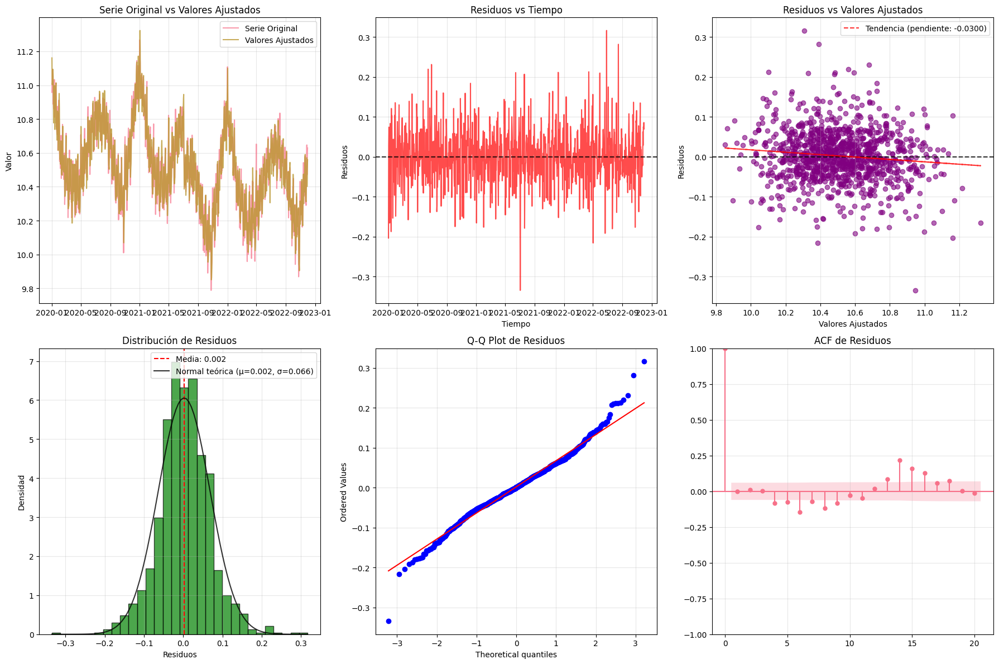


PRUEBAS DE NORMALIDAD DE RESIDUOS
Test Jarque-Bera (Normalidad):
  Estadístico: 148.1032
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

Test Shapiro-Wilk (Normalidad):
  Estadístico: 0.9834
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

PRUEBAS DE AUTOCORRELACIÓN DE RESIDUOS
Test Ljung-Box (Autocorrelación en residuos):
      lb_stat     lb_pvalue
1    0.000282  9.866129e-01
2    0.150627  9.274529e-01
3    0.152024  9.849351e-01
4    7.233920  1.240310e-01
5   13.317633  2.057724e-02
6   36.005230  2.750181e-06
7   41.183127  7.466222e-07
8   56.630515  2.125777e-09
9   63.882267  2.378942e-10
10  64.657941  4.712147e-10

Interpretación: Hay autocorrelación significativa en los residuos
Lags con autocorrelación significativa: 6/10

PRUEBAS DE HETEROCEDASTICIDAD DE RESIDUOS
Test Breusch-Pagan (Heterocedasticidad):
  Estadístico: 0.5976
  p-valor: 0.4395
  Interpretación: Homocedasticidad (varianza constante)

Test White (Heterocedasticidad):
  Est

In [44]:
results = analyze_residuals_statsmodels(model_fitted, ts_log, figsize=(18, 12))


**Observaciones**

- Vemos que con la transformación logaritmica, la media y la varianza de los residuales se acercan más a los valores de ruido blanco, pero aún hay autocorrelación, heterocedasticidad y no normalidad. 

#### 6.1.3 Modelo SARIMA base con serie en logaritmos y dummy de competidores

In [53]:
# ARIMA en LOGS con diferenciación interna (d desde el modelo)
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ===============================
# Serie en niveles con frecuencia fija
# ===============================
if 'date' in df_global.columns:
    ts = (
        df_global
        .set_index('date')['demanda']
        .sort_index()
        .asfreq('D')  
    )
else:
    ts = (
        df_global['demanda']
        .sort_index()
        .asfreq('D')
    )


df_global_indexed = df_global.set_index('date')
exog = df_global_indexed['Entrada_competidor'].reindex(ts.index)


# ===============================
# Transformación a log
# ===============================

ts_log = np.log1p(ts)


model = SARIMAX(
    ts_log,
    order=(1, 1, 1),          
    seasonal_order=(1, 0, 1, 7), 
    trend='n',
    exog=exog
)

# Ajustar el modelo
model_fitted = model.fit()

print(f"AIC: {model_fitted.aic:.2f}")
print(f"BIC: {model_fitted.bic:.2f}")
print(f"Log-Likelihood: {model_fitted.llf:.2f}")
print("\nResumen del modelo:")
print(model_fitted.summary())




AIC: -2739.94
BIC: -2710.12
Log-Likelihood: 1375.97

Resumen del modelo:
                                     SARIMAX Results                                     
Dep. Variable:                           demanda   No. Observations:                 1065
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 7)   Log Likelihood                1375.972
Date:                           Wed, 20 Aug 2025   AIC                          -2739.943
Time:                                   12:31:19   BIC                          -2710.124
Sample:                               01-01-2020   HQIC                         -2728.644
                                    - 11-30-2022                                         
Covariance Type:                             opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Entrada_competidor    -0.1602    


Chequeo rápido (primeras 8 obs. tras burn-in y alineación):
                    y       yhat     resid
date                                      
2020-01-02  10.957800  11.161025 -0.203225
2020-01-03  11.030784  11.006598  0.024186
2020-01-04  11.089057  10.999356  0.089701
2020-01-05  11.093204  11.083231  0.009973
2020-01-06  11.051461  11.101278 -0.049817
2020-01-07  10.888670  11.045848 -0.157178
2020-01-08  10.916687  10.946063 -0.029376
2020-01-09  10.860997  10.784877  0.076120

Observación con residuo mínimo (posible outlier temprano):
                    y       yhat     resid
date                                      
2021-07-03  10.611228  10.914126 -0.302898

MÉTRICAS DE ERROR DEL MODELO (tras descartar las primeras d observaciones)
d descartado (no estacional): 1
MAE : 0.0505
RMSE: 0.0666
MAPE: 0.48%
sMAPE: 0.48%

ESTADÍSTICAS DE RESIDUOS
Media de residuos            : 0.001577
Desviación estándar residuos : 0.066572
Mínimo residuo               : -0.3029
Máximo residuo  

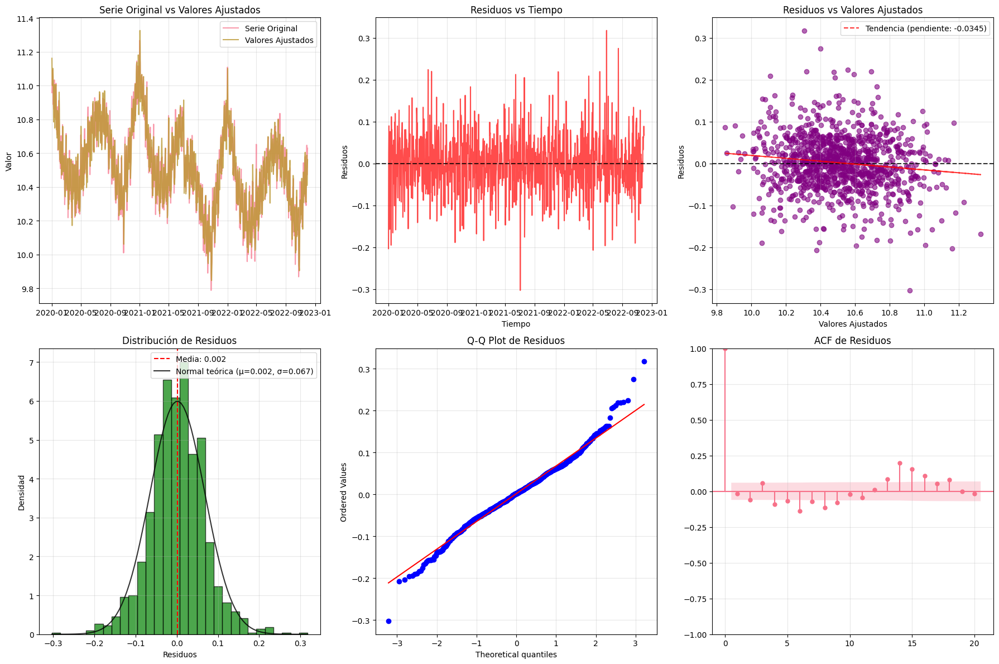


PRUEBAS DE NORMALIDAD DE RESIDUOS
Test Jarque-Bera (Normalidad):
  Estadístico: 104.1554
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

Test Shapiro-Wilk (Normalidad):
  Estadístico: 0.9863
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

PRUEBAS DE AUTOCORRELACIÓN DE RESIDUOS
Test Ljung-Box (Autocorrelación en residuos):
      lb_stat     lb_pvalue
1    0.326473  5.677432e-01
2    4.119720  1.274718e-01
3    7.520876  5.702448e-02
4   16.431276  2.491834e-03
5   21.005394  8.081611e-04
6   40.768772  3.215777e-07
7   46.224615  7.904790e-08
8   59.924906  4.821842e-10
9   66.534391  7.249936e-11
10  66.909602  1.745135e-10

Interpretación: Hay autocorrelación significativa en los residuos
Lags con autocorrelación significativa: 7/10

PRUEBAS DE HETEROCEDASTICIDAD DE RESIDUOS
Test Breusch-Pagan (Heterocedasticidad):
  Estadístico: 0.3306
  p-valor: 0.5653
  Interpretación: Homocedasticidad (varianza constante)

Test White (Heterocedasticidad):
  Est

In [54]:
results = analyze_residuals_statsmodels(model_fitted, ts_log, figsize=(18, 12))


**Observaciones**

- Vemos que el coeficiente del competidor es significativo, sin embargo, los residuales siguen si pasar las pruebas estadísticas.


#### 6.1.4 Modelo SARIMA con serie en logaritmos , dummy competidor y errores estándares robustos 

In [56]:
# ARIMA en LOGS con diferenciación interna (d desde el modelo)
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ===============================
# Serie en niveles con frecuencia fija
# ===============================
if 'date' in df_global.columns:
    ts = (
        df_global
        .set_index('date')['demanda']
        .sort_index()
        .asfreq('D')   
    )
else:
    ts = (
        df_global['demanda']
        .sort_index()
        .asfreq('D')
    )

df_global_indexed = df_global.set_index('date')
exog = df_global_indexed['Entrada_competidor'].reindex(ts.index)


# ===============================
# Transformación a log
# ===============================

ts_log = np.log1p(ts)


model = SARIMAX(
    ts_log,
    order=(1, 1, 1),            
    seasonal_order=(1, 0, 1, 7), 
    trend='n',
    exog=exog
)

# Ajustar el modelo
model_fitted = model.fit(cov_type='robust')

print(f"AIC: {model_fitted.aic:.2f}")
print(f"BIC: {model_fitted.bic:.2f}")
print(f"Log-Likelihood: {model_fitted.llf:.2f}")
print("\nResumen del modelo:")
print(model_fitted.summary())




AIC: -2739.94
BIC: -2710.12
Log-Likelihood: 1375.97

Resumen del modelo:
                                     SARIMAX Results                                     
Dep. Variable:                           demanda   No. Observations:                 1065
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 7)   Log Likelihood                1375.972
Date:                           Wed, 20 Aug 2025   AIC                          -2739.943
Time:                                   12:31:34   BIC                          -2710.124
Sample:                               01-01-2020   HQIC                         -2728.644
                                    - 11-30-2022                                         
Covariance Type:                          robust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
Entrada_competidor    -0.1602    


Chequeo rápido (primeras 8 obs. tras burn-in y alineación):
                    y       yhat     resid
date                                      
2020-01-02  10.957800  11.161025 -0.203225
2020-01-03  11.030784  11.006598  0.024186
2020-01-04  11.089057  10.999356  0.089701
2020-01-05  11.093204  11.083231  0.009973
2020-01-06  11.051461  11.101278 -0.049817
2020-01-07  10.888670  11.045848 -0.157178
2020-01-08  10.916687  10.946063 -0.029376
2020-01-09  10.860997  10.784877  0.076120

Observación con residuo mínimo (posible outlier temprano):
                    y       yhat     resid
date                                      
2021-07-03  10.611228  10.914126 -0.302898

MÉTRICAS DE ERROR DEL MODELO (tras descartar las primeras d observaciones)
d descartado (no estacional): 1
MAE : 0.0505
RMSE: 0.0666
MAPE: 0.48%
sMAPE: 0.48%

ESTADÍSTICAS DE RESIDUOS
Media de residuos            : 0.001577
Desviación estándar residuos : 0.066572
Mínimo residuo               : -0.3029
Máximo residuo  

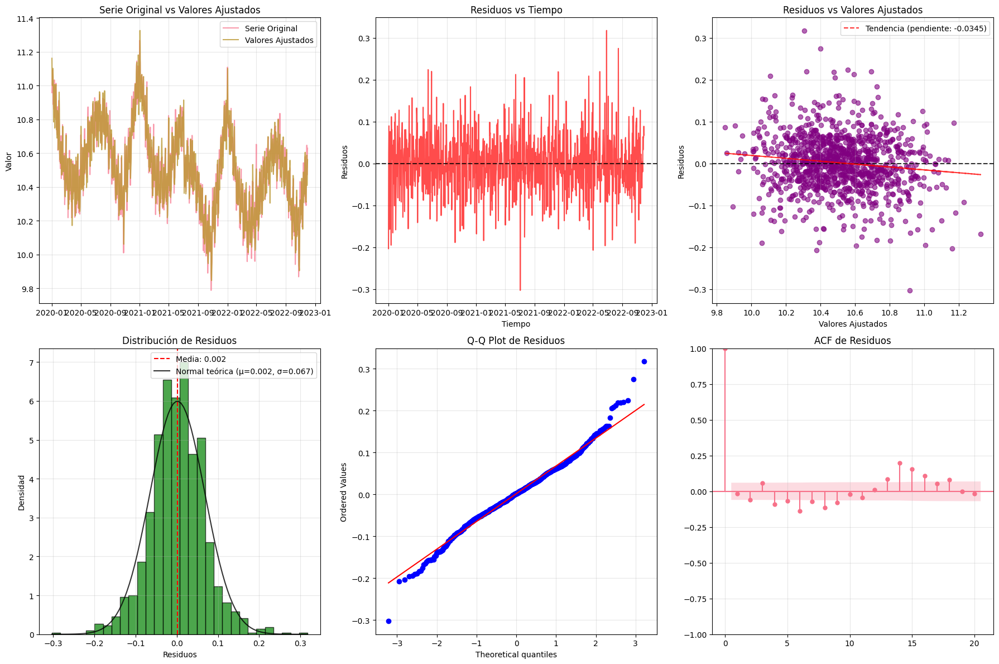


PRUEBAS DE NORMALIDAD DE RESIDUOS
Test Jarque-Bera (Normalidad):
  Estadístico: 104.1554
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

Test Shapiro-Wilk (Normalidad):
  Estadístico: 0.9863
  p-valor: 0.0000
  Interpretación: Los residuos NO son normales

PRUEBAS DE AUTOCORRELACIÓN DE RESIDUOS
Test Ljung-Box (Autocorrelación en residuos):
      lb_stat     lb_pvalue
1    0.326473  5.677432e-01
2    4.119720  1.274718e-01
3    7.520876  5.702448e-02
4   16.431276  2.491834e-03
5   21.005394  8.081611e-04
6   40.768772  3.215777e-07
7   46.224615  7.904790e-08
8   59.924906  4.821842e-10
9   66.534391  7.249936e-11
10  66.909602  1.745135e-10

Interpretación: Hay autocorrelación significativa en los residuos
Lags con autocorrelación significativa: 7/10

PRUEBAS DE HETEROCEDASTICIDAD DE RESIDUOS
Test Breusch-Pagan (Heterocedasticidad):
  Estadístico: 0.3306
  p-valor: 0.5653
  Interpretación: Homocedasticidad (varianza constante)

Test White (Heterocedasticidad):
  Est

In [57]:
results = analyze_residuals_statsmodels(model_fitted, ts_log, figsize=(18, 12))


**Respuesta final**


- Los residuales del modelo parecen tener un comportamiento cercano a una distribución normal pero no están pasando las pruebas estadísticas.
- Los errores estándares robustos permiten tener mayor confianza sobre los resulaados de los coeficientes aunque las pruebas estadísticas no hayan sido favorables. A pesar de ello, el coeficiente de entrada del competidor ahora no es significativo. Esto indica que hay una mayor incertidumbre sobre el efecto real de la entrada del competidor y que la interpretación sobre los coeficientes debe ser tomada con precaución. Sin embargo, el modelo presenta información valiosa para cuantificar su efecto, puntualmente, que su dirección es sin dudas negativo, y aproximadamente del orden de un 16%. Para mayor certeza se puede intentar modelar mejor la estructura de la varianza de los residuales o añadir otras variables importantes que se pueden estar confundiendo con el efecto de la entrada del competidor.  

### 6.2 ¿Las  ventas  tienen  una  tendencia  creciente  o  decreciente?  Excluya  el  impacto  de  la  apertura del competidor del análisis. Se quiere entender si en el futuro se espera que las ventas crezcan, decrezcan o se mantendrán estables.

#### 6.2.1 Modelar serie estacionaria con tendencia media distinta de cero 

In [58]:
# ARIMA en LOGS con diferenciación interna (d desde el modelo)
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ===============================
# Serie en niveles con frecuencia fija

# ===============================
if 'date' in df_global.columns:
    ts = (
        df_global
        .set_index('date')['demanda']
        .sort_index()
        .asfreq('D')
    )
else:
    ts = (
        df_global['demanda']
        .sort_index()
        .asfreq('D')
    )

# ===============================
# Transformación a log
# ===============================

ts_log = np.log1p(ts)



model = SARIMAX(
    ts_log,
    order=(1, 0, 1),         
    seasonal_order=(1, 0, 1, 7), 
    trend='c'
)

# Ajustar el modelo
model_fitted = model.fit(cov_type='robust')
    
print(f"AIC: {model_fitted.aic:.2f}")
print(f"BIC: {model_fitted.bic:.2f}")
print(f"Log-Likelihood: {model_fitted.llf:.2f}")
print("\nResumen del modelo:")
print(model_fitted.summary())




AIC: -2693.23
BIC: -2663.41
Log-Likelihood: 1352.62

Resumen del modelo:
                                     SARIMAX Results                                     
Dep. Variable:                           demanda   No. Observations:                 1065
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 7)   Log Likelihood                1352.616
Date:                           Wed, 20 Aug 2025   AIC                          -2693.232
Time:                                   12:31:43   BIC                          -2663.408
Sample:                               01-01-2020   HQIC                         -2681.931
                                    - 11-30-2022                                         
Covariance Type:                          robust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0003      0.000      1.190      

**Observaciones**

- La tendencia constante muestra un crecimiento de 0.03% pero no es estadísticamente signficativo, por lo que podemos decir que es indistinguible de cero.

#### 6.2.2 Modelo estacional con tendencia determinística lineal

In [60]:
# ARIMA en LOGS con diferenciación interna (d desde el modelo)
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ===============================
# Serie en niveles con frecuencia fija

# ===============================
if 'date' in df_global.columns:
    ts = (
        df_global
        .set_index('date')['demanda']
        .sort_index()
        .asfreq('D')   
    )
else:
    ts = (
        df_global['demanda']
        .sort_index()
        .asfreq('D')
    )

# ===============================
# Transformación a log
# ===============================

ts_log = np.log1p(ts)



model = SARIMAX(
    ts_log,
    order=(1, 0, 1),             
    seasonal_order=(1, 0, 1, 7),
    trend='t'
)

# Ajustar el modelo
model_fitted = model.fit(cov_type='robust')
    

print(model_fitted.summary())




                                     SARIMAX Results                                     
Dep. Variable:                           demanda   No. Observations:                 1065
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 7)   Log Likelihood                1012.400
Date:                           Wed, 20 Aug 2025   AIC                          -2012.800
Time:                                   12:31:55   BIC                          -1982.976
Sample:                               01-01-2020   HQIC                         -2001.499
                                    - 11-30-2022                                         
Covariance Type:                          robust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
drift      -3.922e-06   2.59e-06     -1.517      0.129   -8.99e-06    1.15e-06
ar.L1          0.9996      0.000   2331.320

**Observaciones**

- Al modelar una tendencia deterministica lineal vemos que la dirección del coeficiente cambia, pero su magnitud se hace aun más pequeña (0.03%). De forma similar, el coeficiente no es estadísticamente significativo, pero es más pequeño que la versión anterior (significativo con un nivel de confiaza bajo de 87%). 




**Respuesta final**

- Los resultados de ambos modelos coinciden en que los coeficientes son casi cero y no son significativos, por lo que podemos afirmar que no hay evidencia estadística de que la demanda global crecerá o decrecerá, por lo que podemos inferir que se mantendrán constantes.  


## 7. Pronósticos por producto

### 7.1 Preprocesamiento de datos

In [5]:
# Importar funciones de preprocesamiento optimizadas
from src.models_data_preprocessing import load_and_preprocess_data, separar_productos

# Ejecutar preprocesamiento integral y optimizado
print("Iniciando preprocesamiento integral de datos...")
df_all, df_global, encoding_info_all, encoding_info_global = load_and_preprocess_data(
    df_global_path="Data/df_global.csv", 
    df_all_path="Data/data_clean.csv",
    drop_columns=None,  # Usa defaults: ["Unnamed: 0", "subcategoria"]
    apply_encoding=True,
    verbose=True
)


# Crear dataset de test completo con todas las características
from src.models_data_preprocessing import crear_dataset_test_completo

print("="*60)
print("CREACIÓN DE DATASET DE TEST COMPLETO")
print("="*60)

# Crear el dataset de test completo
df_test_completo = crear_dataset_test_completo(
    df_all=df_all, 
    ruta_demanda_test="Data/demanda_test.csv"
)

# Crear productos_dict optimizado con validación integral
from src.models_data_preprocessing import crear_productos_dict_optimizado

# Crear diccionario de productos con estructura optimizada y validación completa
productos_dict = crear_productos_dict_optimizado(
    df_all=df_all,
    target_col='demanda',
    test_size=0.2,
    save_files=False,  # Cambiar a True si quieres guardar archivos CSV
    verbose=True
)

Iniciando preprocesamiento integral de datos...
CARGA Y PREPROCESAMIENTO INTEGRAL DE DATOS
1. Cargando archivos...
   - df_global cargado: (1065, 3)
   - df_all cargado: (126460, 11)

2. Eliminando columnas innecesarias...
   - Columnas eliminadas de df_all: ['subcategoria', 'Unnamed: 0']
   - Columnas eliminadas de df_global: []

3. Añadiendo variables de descomposición de fecha...
   - Variables de fecha añadidas: month, year, day_of_week, weekend, quarter

4. Convirtiendo tipos de datos...
   - Tipos de datos convertidos correctamente
   - df_all shape después de conversión: (126460, 14)
   - df_global shape después de conversión: (1065, 8)

5. Aplicando One-Hot Encoding...
APLICACIÓN DE ONE-HOT ENCODING
Variables categóricas encontradas para encoding: ['categoria', 'tamaño']

Procesando columna: categoria
  Categorías: ['aseo', 'bebidas', 'carnes_y_aves', 'cereales_y_productos_secos', 'congelados', 'frutas_y_verduras', 'jabones', 'panaderia_y_panificados', 'productos_enlatados_y_al

### 7.2 Ajuste de modelos

#### 7.2.1 Regresión lineal con optimización bayesiana de hiperparámetros

In [2]:
# Importar la función integral de análisis de modelos lineales
from src.linear_model_tools import run_complete_linear_model_analysis

# Ejecutar análisis completo de modelos lineales (global + por productos + comparación)
results_df_productos, global_df = run_complete_linear_model_analysis(
    df_all=df_all,
    productos_dict=productos_dict,
    model_types=['ridge', 'lasso'],
    output_dir='output',
    target_col='demanda',
    test_size=0.2,
    timeout_global=120.0,  # 2 minutos para modelo global
    verbose=True
)

c:\Users\dr10a\Desktop\Developer\Sumz\Prueba\env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


IMPLEMENTACIÓN DE MODELOS LINEALES

1. ENTRENANDO MODELO GLOBAL
--------------------------------------------------
Preparando datos globales...
Datos globales:
  - Total muestras: 126460
  - Features: 21
  - Productos únicos: 135
División temporal global:
  - Train: 101168 muestras
  - Test: 25292 muestras

Optimizando modelo global...

Entrenando modelo GLOBAL RIDGE
Optuna completó 50 trials
Mejores parámetros: {'alpha': 987.7756700811028}
Mejor CV Score (RMSE): 191.7760
Métricas - Train RMSE: 174.7412, Test RMSE: 162.6233

Entrenando modelo GLOBAL LASSO
Optuna completó 50 trials
Mejores parámetros: {'alpha': 987.7756700811028}
Mejor CV Score (RMSE): 191.7760
Métricas - Train RMSE: 174.7412, Test RMSE: 162.6233

Entrenando modelo GLOBAL LASSO
Optuna completó 50 trials
Mejores parámetros: {'alpha': 9.90447572664342}
Mejor CV Score (RMSE): 190.8758
Optuna completó 50 trials
Mejores parámetros: {'alpha': 9.90447572664342}
Mejor CV Score (RMSE): 190.8758
Métricas - Train RMSE: 179.1344, T

#### 7.2.2 Modelo ARIMA 

In [3]:
# ========================================
# PIPELINE COMPLETO DE MODELOS ARIMA
# ========================================

# Importar la función comprensiva de ARIMA
from src.arima_model_tools import run_complete_arima_pipeline

# Verificar que tenemos los datos necesarios
if 'productos_dict' not in globals():
    print("❌ Error: productos_dict no está definido. Ejecuta primero la celda de preprocesamiento.")
else:
    # Ejecutar pipeline completo de ARIMA
    # Incluye: instalación de dependencias, validación, entrenamiento, análisis y reporte
    arima_results_df = run_complete_arima_pipeline(
        productos_dict=productos_dict,
        target_col='demanda',
        seasonal=True,  # Usar SARIMA
        m=7,           # Frecuencia estacional semanal
        output_dir='output'
    )

IMPLEMENTACIÓN DE MODELOS ARIMA

📦 VERIFICANDO DEPENDENCIAS...
✅ pmdarima ya está instalado

🔍 VALIDANDO DATOS DE ENTRADA...
✅ Datos disponibles: 135 productos

🔮 ENTRENANDO MODELOS ARIMA POR PRODUCTOS
------------------------------------------------------------
Iniciando entrenamiento ARIMA...
Configuración:
  - Modelo: SARIMA (auto)
  - Frecuencia estacional: 7
  - Variable objetivo: demanda
  - Directorio salida: output

🚀 INICIANDO ENTRENAMIENTO DE MODELOS AUTO_ARIMA
Total productos a procesar: 135
Modelo: SARIMA (auto)
Frecuencia estacional: 7
Directorio de salida: output

📊 Procesando Producto 1...
Producto 1: Optimizando ARIMA con auto_arima...
Producto 1: Mejor modelo ARIMA(3, 1, 2) - AIC: 6500.64
Producto 1: Modelo ARIMA guardado en Modelos registrados\best_model_producto_1_arima.pkl

📊 Procesando Producto 2...
Producto 2: Optimizando ARIMA con auto_arima...
Producto 2: Mejor modelo ARIMA(2, 1, 3) - AIC: 8657.45
Producto 2: Modelo ARIMA guardado en Modelos registrados\best_mod

#### 7.2.3  Modelos LSTM (Long Short-Term Memory)

In [5]:
# Ejecutar pipeline completo de modelos LSTM (1 línea)
from src.lstm_model_tools import run_complete_lstm_pipeline

resultados_lstm = run_complete_lstm_pipeline(productos_dict, sequence_length=15, output_dir='output')

IMPLEMENTACIÓN DE MODELOS LSTM (PyTorch - RÁPIDO)
📊 Entrenando modelos LSTM para todos los productos...
⏱️  Tiempo estimado: ~202.5 minutos (1.5 min por producto)
🔧 Características optimizadas para velocidad:
   - Secuencias temporales: 15 pasos
   - Optimización rápida: 10 trials por producto
   - Entrenamiento: máximo 15 epochs
   - Early stopping agresivo
   - Implementación PyTorch estable

🚀 INICIANDO ENTRENAMIENTO DE MODELOS LSTM
Total productos a procesar: 135
Longitud de secuencias: 15
Directorio de salida: output
⏱️  Tiempo estimado: ~202.5 minutos (1.5 min por producto)

📊 Procesando Producto 1...
Producto 1: Datos - Train: 808, Test: 202, Features: 21
Producto 1: Optimizando hiperparámetros...
Optuna completó 10 trials
Producto 1: Mejores parámetros - {'hidden_size': 42, 'num_layers': 1, 'dropout_rate': 0.23684660530243137, 'learning_rate': 0.0027551959649510785, 'batch_size': 32}
Producto 1: Mejor CV Score (RMSE): 19.4711
Producto 1: Train RMSE: 18.2030, Test RMSE: 14.0274


#### 7.2.4 Prophet

In [6]:
# Ejecutar pipeline completo de modelos Prophet (1 línea)
from src.prophet_model_tools import run_complete_prophet_pipeline

resultados_prophet_df = run_complete_prophet_pipeline(productos_dict, output_dir='output')

Importing plotly failed. Interactive plots will not work.


🚀 INICIANDO ENTRENAMIENTO MODELO PROPHET - TODOS LOS PRODUCTOS
📊 Total de productos a procesar: 135
⏱️  Tiempo estimado total: ~202 minutos (3.4 horas)
🎯 Objetivo: <1.5 minutos por producto

[1/135] 🔄 Procesando Producto 1
⏱️  Entrenando modelo Prophet para producto 1 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:17 - cmdstanpy - INFO - Chain [1] start processing
11:34:17 - cmdstanpy - INFO - Chain [1] done processing
11:34:18 - cmdstanpy - INFO - Chain [1] start processing
11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:18 - cmdstanpy - INFO - Chain [1] start processing
11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:18 - cmdstanpy - INFO - Chain [1] start processing
11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:18 - cmdstanpy - INFO - Chain [1] start processing
11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:18 - cmdstanpy - INFO - Chain [1] start processing
11:34:18 - cmdstanpy - INFO - Chain [1] done processing
11:34:19 - cmdstanpy - INFO - Chain [1] start processing
11:34:19 - cmdstanpy - INFO - Chain [1] done processing
11:34:19 - cmdstanpy - INFO - Chain [1] start processing
11:34:19 - cmdstanpy - INFO - Chain [1] done processing
11:34:19 - cmdstanpy - INFO - Chain [1] start processing
11:34:19 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:21 - cmdstanpy - INFO - Chain [1] done processing
11:34:21 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.6s - MAE: 12.95
📈 Progreso: 1/135 (0.7%)
⏱️  Tiempo promedio: 4.6s por producto
🕐 ETA restante: 10.3 minutos
✅ Exitosos: 1 | ❌ Errores: 0

[2/135] 🔄 Procesando Producto 2
⏱️  Entrenando modelo Prophet para producto 2 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:21 - cmdstanpy - INFO - Chain [1] done processing
11:34:21 - cmdstanpy - INFO - Chain [1] start processing
11:34:21 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:22 - cmdstanpy - INFO - Chain [1] start processing
11:34:22 - cmdstanpy - INFO - Chain [1] done processing
11:34:23 - cmdstanpy - INFO - Chain [1] start processing
11:34:23 - cmdstanpy - INFO - Chain [1] done processing
11:34:23 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:34:25 - cmdstanpy - INFO - Chain [1] done processing
11:34:25 - cmdstanpy - INFO - Chain [1] start processing
11:34:25 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 70.37
📈 Progreso: 2/135 (1.5%)
⏱️  Tiempo promedio: 4.2s por producto
🕐 ETA restante: 9.3 minutos
✅ Exitosos: 2 | ❌ Errores: 0

[3/135] 🔄 Procesando Producto 3
⏱️  Entrenando modelo Prophet para producto 3 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:25 - cmdstanpy - INFO - Chain [1] start processing
11:34:25 - cmdstanpy - INFO - Chain [1] done processing
11:34:25 - cmdstanpy - INFO - Chain [1] start processing
11:34:25 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:26 - cmdstanpy - INFO - Chain [1] start processing
11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:27 - cmdstanpy - INFO - Chain [1] start processing
11:34:27 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 65.20
📈 Progreso: 3/135 (2.2%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 9.0 minutos
✅ Exitosos: 3 | ❌ Errores: 0

[4/135] 🔄 Procesando Producto 4
⏱️  Entrenando modelo Prophet para producto 4 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:32 - cmdstanpy - INFO - Chain [1] start processing
11:34:32 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 87.37
📈 Progreso: 4/135 (3.0%)
⏱️  Tiempo promedio: 4.0s por producto
🕐 ETA restante: 8.6 minutos
✅ Exitosos: 4 | ❌ Errores: 0

[5/135] 🔄 Procesando Producto 5
⏱️  Entrenando modelo Prophet para producto 5 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:33 - cmdstanpy - INFO - Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:33 - cmdstanpy - INFO - Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:33 - cmdstanpy - INFO - Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:33 - cmdstanpy - INFO - Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:33 - cmdstanpy - INFO - Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:33 - cmdstanpy - INFO - Chain [1] start processing
11:34:33 - cmdstanpy - INFO - Chain [1] done processing
11:34:34 - cmdstanpy - INFO - Chain [1] start processing
11:34:34 - cmdstanpy - INFO - Chain [1] done processing
11:34:34 - cmdstanpy - INFO - Chain [1] start processing
11:34:34 - cmdstanpy - INFO - Chain [1] done processing
11:34:34 - cmdstanpy - INFO - Chain [1] start processing
11:34:34 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:36 - cmdstanpy - INFO - Chain [1] done processing
11:34:37 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.2s - MAE: 14.16
📈 Progreso: 5/135 (3.7%)
⏱️  Tiempo promedio: 4.0s por producto
🕐 ETA restante: 8.7 minutos
✅ Exitosos: 5 | ❌ Errores: 0

[6/135] 🔄 Procesando Producto 6
⏱️  Entrenando modelo Prophet para producto 6 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:37 - cmdstanpy - INFO - Chain [1] done processing
11:34:37 - cmdstanpy - INFO - Chain [1] start processing
11:34:37 - cmdstanpy - INFO - Chain [1] done processing
11:34:37 - cmdstanpy - INFO - Chain [1] start processing
11:34:37 - cmdstanpy - INFO - Chain [1] done processing
11:34:37 - cmdstanpy - INFO - Chain [1] start processing
11:34:37 - cmdstanpy - INFO - Chain [1] done processing
11:34:37 - cmdstanpy - INFO - Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:38 - cmdstanpy - INFO - Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:38 - cmdstanpy - INFO - Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:38 - cmdstanpy - INFO - Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:38 - cmdstanpy - INFO - Chain [1] start processing
11:34:38 - cmdstanpy - INFO - Chain [1] done processing
11:34:39 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:41 - cmdstanpy - INFO - Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 7.12

[7/135] 🔄 Procesando Producto 7
⏱️  Entrenando modelo Prophet para producto 7 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:41 - cmdstanpy - INFO - Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:41 - cmdstanpy - INFO - Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:41 - cmdstanpy - INFO - Chain [1] start processing
11:34:41 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1] done processing
11:34:42 - cmdstanpy - INFO - Chain [1] start processing
11:34:42 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:44 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 64.02

[8/135] 🔄 Procesando Producto 8
⏱️  Entrenando modelo Prophet para producto 8 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:45 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:45 - cmdstanpy - INFO - Chain [1] start processing
11:34:45 - cmdstanpy - INFO - Chain [1] done processing
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
11:34:46 - cmdstanpy - INFO - Chain [1] done processing
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
11:34:46 - cmdstanpy - INFO - Chain [1] done processing
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
11:34:46 - cmdstanpy - INFO - Chain [1] done processing
11:34:46 - cmdstanpy - INFO - Chain [1] start processing
11:34:46 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:48 - cmdstanpy - INFO - Chain [1] done processing
11:34:48 - cmdstanpy - INFO - Chain [1] start processing
11:34:48 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 15.45

[9/135] 🔄 Procesando Producto 9
⏱️  Entrenando modelo Prophet para producto 9 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:48 - cmdstanpy - INFO - Chain [1] start processing
11:34:48 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:49 - cmdstanpy - INFO - Chain [1] start processing
11:34:49 - cmdstanpy - INFO - Chain [1] done processing
11:34:50 - cmdstanpy - INFO - Chain [1] start processing
11:34:50 - cmdstanpy - INFO - Chain [1] done processing
11:34:50 - cmdstanpy - INFO - Chain [1] start processing
11:34:50 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:52 - cmdstanpy - INFO - Chain [1] done processing
11:34:52 - cmdstanpy - INFO - Chain [1] start processing
11:34:52 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 75.19

[10/135] 🔄 Procesando Producto 10
⏱️  Entrenando modelo Prophet para producto 10 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:52 - cmdstanpy - INFO - Chain [1] start processing
11:34:52 - cmdstanpy - INFO - Chain [1] done processing
11:34:52 - cmdstanpy - INFO - Chain [1] start processing
11:34:52 - cmdstanpy - INFO - Chain [1] done processing
11:34:52 - cmdstanpy - INFO - Chain [1] start processing
11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing
11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing
11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing
11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing
11:34:53 - cmdstanpy - INFO - Chain [1] done processing
11:34:53 - cmdstanpy - INFO - Chain [1] start processing
11:34:54 - cmdstanpy - INFO - Chain [1] done processing
11:34:54 - cmdstanpy - INFO - Chain [1] start processing
11:34:54 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:34:56 - cmdstanpy - INFO - Chain [1] done processing
11:34:56 - cmdstanpy - INFO - Chain [1] start processing
11:34:56 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.0s - MAE: 34.18
📈 Progreso: 10/135 (7.4%)
⏱️  Tiempo promedio: 3.9s por producto
🕐 ETA restante: 8.2 minutos
✅ Exitosos: 10 | ❌ Errores: 0

[11/135] 🔄 Procesando Producto 11
⏱️  Entrenando modelo Prophet para producto 11 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:34:56 - cmdstanpy - INFO - Chain [1] start processing
11:34:56 - cmdstanpy - INFO - Chain [1] done processing
11:34:56 - cmdstanpy - INFO - Chain [1] start processing
11:34:56 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:34:57 - cmdstanpy - INFO - Chain [1] done processing
11:34:58 - cmdstanpy - INFO - Chain [1] start processing
11:34:58 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:00 - cmdstanpy - INFO - Chain [1] done processing
11:35:00 - cmdstanpy - INFO - Chain [1] start processing
11:35:00 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 28.24

[12/135] 🔄 Procesando Producto 12
⏱️  Entrenando modelo Prophet para producto 12 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:00 - cmdstanpy - INFO - Chain [1] start processing
11:35:00 - cmdstanpy - INFO - Chain [1] done processing
11:35:00 - cmdstanpy - INFO - Chain [1] start processing
11:35:00 - cmdstanpy - INFO - Chain [1] done processing
11:35:00 - cmdstanpy - INFO - Chain [1] start processing
11:35:00 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1] done processing
11:35:01 - cmdstanpy - INFO - Chain [1] start processing
11:35:01 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:03 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:04 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 54.44

[13/135] 🔄 Procesando Producto 13
⏱️  Entrenando modelo Prophet para producto 13 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:04 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:04 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:04 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:04 - cmdstanpy - INFO - Chain [1] done processing
11:35:04 - cmdstanpy - INFO - Chain [1] start processing
11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing
11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing
11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing
11:35:05 - cmdstanpy - INFO - Chain [1] done processing
11:35:05 - cmdstanpy - INFO - Chain [1] start processing
11:35:05 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:07 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 84.61

[14/135] 🔄 Procesando Producto 14
⏱️  Entrenando modelo Prophet para producto 14 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:11 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 3.9s - MAE: 26.13

[15/135] 🔄 Procesando Producto 15
⏱️  Entrenando modelo Prophet para producto 15 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:12 - cmdstanpy - INFO - Chain [1] start processing
11:35:12 - cmdstanpy - INFO - Chain [1] done processing
11:35:13 - cmdstanpy - INFO - Chain [1] start processing
11:35:13 - cmdstanpy - INFO - Chain [1] done processing
11:35:13 - cmdstanpy - INFO - Chain [1] start processing
11:35:13 - cmdstanpy - INFO - Chain [1] done processing
11:35:13 - cmdstanpy - INFO - Chain [1] start processing
11:35:13 - cmdstanpy - INFO - Chain [1] done processing
11:35:13 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 3.6s - MAE: 108.37

[16/135] 🔄 Procesando Producto 16
⏱️  Entrenando modelo Prophet para producto 16 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:15 - cmdstanpy - INFO - Chain [1] start processing
11:35:15 - cmdstanpy - INFO - Chain [1] done processing
11:35:15 - cmdstanpy - INFO - Chain [1] start processing
11:35:15 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing
11:35:17 - cmdstanpy - INFO - Chain [1] start processing
11:35:17 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:19 - cmdstanpy - INFO - Chain [1] done processing
11:35:19 - cmdstanpy - INFO - Chain [1] start processing
11:35:19 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 61.50

[17/135] 🔄 Procesando Producto 17
⏱️  Entrenando modelo Prophet para producto 17 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:19 - cmdstanpy - INFO - Chain [1] start processing
11:35:19 - cmdstanpy - INFO - Chain [1] done processing
11:35:19 - cmdstanpy - INFO - Chain [1] start processing
11:35:19 - cmdstanpy - INFO - Chain [1] done processing
11:35:19 - cmdstanpy - INFO - Chain [1] start processing
11:35:19 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
11:35:20 - cmdstanpy - INFO - Chain [1] done processing
11:35:20 - cmdstanpy - INFO - Chain [1] start processing
11:35:20 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:22 - cmdstanpy - INFO - Chain [1] done processing
11:35:23 - cmdstanpy - INFO - Chain [1] start processing
11:35:23 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 6.59

[18/135] 🔄 Procesando Producto 18
⏱️  Entrenando modelo Prophet para producto 18 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:23 - cmdstanpy - INFO - Chain [1] start processing
11:35:23 - cmdstanpy - INFO - Chain [1] done processing
11:35:23 - cmdstanpy - INFO - Chain [1] start processing
11:35:23 - cmdstanpy - INFO - Chain [1] done processing
11:35:23 - cmdstanpy - INFO - Chain [1] start processing
11:35:23 - cmdstanpy - INFO - Chain [1] done processing
11:35:23 - cmdstanpy - INFO - Chain [1] start processing
11:35:23 - cmdstanpy - INFO - Chain [1] done processing
11:35:23 - cmdstanpy - INFO - Chain [1] start processing
11:35:23 - cmdstanpy - INFO - Chain [1] done processing
11:35:24 - cmdstanpy - INFO - Chain [1] start processing
11:35:24 - cmdstanpy - INFO - Chain [1] done processing
11:35:24 - cmdstanpy - INFO - Chain [1] start processing
11:35:24 - cmdstanpy - INFO - Chain [1] done processing
11:35:24 - cmdstanpy - INFO - Chain [1] start processing
11:35:24 - cmdstanpy - INFO - Chain [1] done processing
11:35:24 - cmdstanpy - INFO - Chain [1] start processing
11:35:24 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:26 - cmdstanpy - INFO - Chain [1] done processing
11:35:26 - cmdstanpy - INFO - Chain [1] start processing
11:35:26 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.5s - MAE: 16.79

[19/135] 🔄 Procesando Producto 19
⏱️  Entrenando modelo Prophet para producto 19 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:26 - cmdstanpy - INFO - Chain [1] start processing
11:35:26 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing
11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing
11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing
11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing
11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing
11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:27 - cmdstanpy - INFO - Chain [1] start processing
11:35:27 - cmdstanpy - INFO - Chain [1] done processing
11:35:28 - cmdstanpy - INFO - Chain [1] start processing
11:35:28 - cmdstanpy - INFO - Chain [1] done processing
11:35:28 - cmdstanpy - INFO - Chain [1] start processing
11:35:28 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:29 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing
11:35:30 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.5s - MAE: 61.01

[20/135] 🔄 Procesando Producto 20
⏱️  Entrenando modelo Prophet para producto 20 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:30 - cmdstanpy - INFO - Chain [1] start processing
11:35:30 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing
11:35:30 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing
11:35:30 - cmdstanpy - INFO - Chain [1] done processing
11:35:30 - cmdstanpy - INFO - Chain [1] start processing
11:35:30 - cmdstanpy - INFO - Chain [1] done processing
11:35:31 - cmdstanpy - INFO - Chain [1] start processing
11:35:31 - cmdstanpy - INFO - Chain [1] done processing
11:35:31 - cmdstanpy - INFO - Chain [1] start processing
11:35:31 - cmdstanpy - INFO - Chain [1] done processing
11:35:31 - cmdstanpy - INFO - Chain [1] start processing
11:35:31 - cmdstanpy - INFO - Chain [1] done processing
11:35:31 - cmdstanpy - INFO - Chain [1] start processing
11:35:31 - cmdstanpy - INFO - Chain [1] done processing
11:35:31 - cmdstanpy - INFO - Chain [1] start processing
11:35:31 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:34 - cmdstanpy - INFO - Chain [1] done processing
11:35:34 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.5s - MAE: 75.02
📈 Progreso: 20/135 (14.8%)
⏱️  Tiempo promedio: 3.9s por producto
🕐 ETA restante: 7.4 minutos
✅ Exitosos: 20 | ❌ Errores: 0

[21/135] 🔄 Procesando Producto 21
⏱️  Entrenando modelo Prophet para producto 21 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:34 - cmdstanpy - INFO - Chain [1] done processing
11:35:34 - cmdstanpy - INFO - Chain [1] start processing
11:35:35 - cmdstanpy - INFO - Chain [1] done processing
11:35:35 - cmdstanpy - INFO - Chain [1] start processing
11:35:35 - cmdstanpy - INFO - Chain [1] done processing
11:35:35 - cmdstanpy - INFO - Chain [1] start processing
11:35:35 - cmdstanpy - INFO - Chain [1] done processing
11:35:35 - cmdstanpy - INFO - Chain [1] start processing
11:35:35 - cmdstanpy - INFO - Chain [1] done processing
11:35:36 - cmdstanpy - INFO - Chain [1] start processing
11:35:36 - cmdstanpy - INFO - Chain [1] done processing
11:35:36 - cmdstanpy - INFO - Chain [1] start processing
11:35:36 - cmdstanpy - INFO - Chain [1] done processing
11:35:36 - cmdstanpy - INFO - Chain [1] start processing
11:35:36 - cmdstanpy - INFO - Chain [1] done processing
11:35:36 - cmdstanpy - INFO - Chain [1] start processing
11:35:36 - cmdstanpy - INFO - Chain [1] done processing
11:35:36 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:35:39 - cmdstanpy - INFO - Chain [1] done processing
11:35:39 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 5.0s - MAE: 43.92

[22/135] 🔄 Procesando Producto 22
⏱️  Entrenando modelo Prophet para producto 22 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:39 - cmdstanpy - INFO - Chain [1] done processing
11:35:40 - cmdstanpy - INFO - Chain [1] start processing
11:35:40 - cmdstanpy - INFO - Chain [1] done processing
11:35:40 - cmdstanpy - INFO - Chain [1] start processing
11:35:40 - cmdstanpy - INFO - Chain [1] done processing
11:35:40 - cmdstanpy - INFO - Chain [1] start processing
11:35:40 - cmdstanpy - INFO - Chain [1] done processing
11:35:40 - cmdstanpy - INFO - Chain [1] start processing
11:35:40 - cmdstanpy - INFO - Chain [1] done processing
11:35:40 - cmdstanpy - INFO - Chain [1] start processing
11:35:41 - cmdstanpy - INFO - Chain [1] done processing
11:35:41 - cmdstanpy - INFO - Chain [1] start processing
11:35:41 - cmdstanpy - INFO - Chain [1] done processing
11:35:41 - cmdstanpy - INFO - Chain [1] start processing
11:35:41 - cmdstanpy - INFO - Chain [1] done processing
11:35:41 - cmdstanpy - INFO - Chain [1] start processing
11:35:41 - cmdstanpy - INFO - Chain [1] done processing
11:35:41 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:35:43 - cmdstanpy - INFO - Chain [1] done processing
11:35:43 - cmdstanpy - INFO - Chain [1] start processing
11:35:44 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 35.61

[23/135] 🔄 Procesando Producto 23
⏱️  Entrenando modelo Prophet para producto 23 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:44 - cmdstanpy - INFO - Chain [1] start processing
11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing
11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing
11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing
11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing
11:35:44 - cmdstanpy - INFO - Chain [1] done processing
11:35:44 - cmdstanpy - INFO - Chain [1] start processing
11:35:45 - cmdstanpy - INFO - Chain [1] done processing
11:35:45 - cmdstanpy - INFO - Chain [1] start processing
11:35:45 - cmdstanpy - INFO - Chain [1] done processing
11:35:45 - cmdstanpy - INFO - Chain [1] start processing
11:35:45 - cmdstanpy - INFO - Chain [1] done processing
11:35:45 - cmdstanpy - INFO - Chain [1] start processing
11:35:45 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:47 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing
11:35:48 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 60.57

[24/135] 🔄 Procesando Producto 24
⏱️  Entrenando modelo Prophet para producto 24 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:48 - cmdstanpy - INFO - Chain [1] start processing
11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing
11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing
11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:49 - cmdstanpy - INFO - Chain [1] start processing
11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:49 - cmdstanpy - INFO - Chain [1] start processing
11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:49 - cmdstanpy - INFO - Chain [1] start processing
11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing
11:35:50 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing
11:35:50 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing
11:35:50 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:52 - cmdstanpy - INFO - Chain [1] done processing
11:35:52 - cmdstanpy - INFO - Chain [1] start processing
11:35:52 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.6s - MAE: 21.38

[25/135] 🔄 Procesando Producto 25
⏱️  Entrenando modelo Prophet para producto 25 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:53 - cmdstanpy - INFO - Chain [1] start processing
11:35:53 - cmdstanpy - INFO - Chain [1] done processing
11:35:54 - cmdstanpy - INFO - Chain [1] start processing
11:35:54 - cmdstanpy - INFO - Chain [1] done processing
11:35:54 - cmdstanpy - INFO - Chain [1] start processing
11:35:54 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:35:56 - cmdstanpy - INFO - Chain [1] done processing
11:35:56 - cmdstanpy - INFO - Chain [1] start processing
11:35:56 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.5s - MAE: 15.63

[26/135] 🔄 Procesando Producto 26
⏱️  Entrenando modelo Prophet para producto 26 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:35:56 - cmdstanpy - INFO - Chain [1] start processing
11:35:56 - cmdstanpy - INFO - Chain [1] done processing
11:35:56 - cmdstanpy - INFO - Chain [1] start processing
11:35:56 - cmdstanpy - INFO - Chain [1] done processing
11:35:56 - cmdstanpy - INFO - Chain [1] start processing
11:35:56 - cmdstanpy - INFO - Chain [1] done processing
11:35:57 - cmdstanpy - INFO - Chain [1] start processing
11:35:57 - cmdstanpy - INFO - Chain [1] done processing
11:35:58 - cmdstanpy - INFO - Chain [1] start processing
11:35:58 - cmdstanpy - INFO - Chain [1] done processing
11:35:58 - cmdstanpy - INFO - Chain [1] start processing
11:35:58 - cmdstanpy - INFO - Chain [1] done processing
11:35:59 - cmdstanpy - INFO - Chain [1] start processing
11:35:59 - cmdstanpy - INFO - Chain [1] done processing
11:35:59 - cmdstanpy - INFO - Chain [1] start processing
11:35:59 - cmdstanpy - INFO - Chain [1] done processing
11:35:59 - cmdstanpy - INFO - Chain [1] start processing
11:35:59 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:01 - cmdstanpy - INFO - Chain [1] done processing
11:36:01 - cmdstanpy - INFO - Chain [1] start processing
11:36:01 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 5.4s - MAE: 40.36

[27/135] 🔄 Procesando Producto 27
⏱️  Entrenando modelo Prophet para producto 27 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:01 - cmdstanpy - INFO - Chain [1] start processing
11:36:01 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing
11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing
11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing
11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing
11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing
11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:02 - cmdstanpy - INFO - Chain [1] start processing
11:36:02 - cmdstanpy - INFO - Chain [1] done processing
11:36:03 - cmdstanpy - INFO - Chain [1] start processing
11:36:03 - cmdstanpy - INFO - Chain [1] done processing
11:36:03 - cmdstanpy - INFO - Chain [1] start processing
11:36:03 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:05 - cmdstanpy - INFO - Chain [1] done processing
11:36:05 - cmdstanpy - INFO - Chain [1] start processing
11:36:05 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 46.15

[28/135] 🔄 Procesando Producto 28
⏱️  Entrenando modelo Prophet para producto 28 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:05 - cmdstanpy - INFO - Chain [1] start processing
11:36:05 - cmdstanpy - INFO - Chain [1] done processing
11:36:05 - cmdstanpy - INFO - Chain [1] start processing
11:36:05 - cmdstanpy - INFO - Chain [1] done processing
11:36:05 - cmdstanpy - INFO - Chain [1] start processing
11:36:06 - cmdstanpy - INFO - Chain [1] done processing
11:36:06 - cmdstanpy - INFO - Chain [1] start processing
11:36:06 - cmdstanpy - INFO - Chain [1] done processing
11:36:06 - cmdstanpy - INFO - Chain [1] start processing
11:36:06 - cmdstanpy - INFO - Chain [1] done processing
11:36:06 - cmdstanpy - INFO - Chain [1] start processing
11:36:06 - cmdstanpy - INFO - Chain [1] done processing
11:36:06 - cmdstanpy - INFO - Chain [1] start processing
11:36:07 - cmdstanpy - INFO - Chain [1] done processing
11:36:07 - cmdstanpy - INFO - Chain [1] start processing
11:36:07 - cmdstanpy - INFO - Chain [1] done processing
11:36:07 - cmdstanpy - INFO - Chain [1] start processing
11:36:07 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:10 - cmdstanpy - INFO - Chain [1] done processing
11:36:10 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 5.0s - MAE: 38.09

[29/135] 🔄 Procesando Producto 29
⏱️  Entrenando modelo Prophet para producto 29 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:10 - cmdstanpy - INFO - Chain [1] done processing
11:36:10 - cmdstanpy - INFO - Chain [1] start processing
11:36:10 - cmdstanpy - INFO - Chain [1] done processing
11:36:10 - cmdstanpy - INFO - Chain [1] start processing
11:36:10 - cmdstanpy - INFO - Chain [1] done processing
11:36:11 - cmdstanpy - INFO - Chain [1] start processing
11:36:11 - cmdstanpy - INFO - Chain [1] done processing
11:36:11 - cmdstanpy - INFO - Chain [1] start processing
11:36:11 - cmdstanpy - INFO - Chain [1] done processing
11:36:11 - cmdstanpy - INFO - Chain [1] start processing
11:36:11 - cmdstanpy - INFO - Chain [1] done processing
11:36:11 - cmdstanpy - INFO - Chain [1] start processing
11:36:11 - cmdstanpy - INFO - Chain [1] done processing
11:36:12 - cmdstanpy - INFO - Chain [1] start processing
11:36:12 - cmdstanpy - INFO - Chain [1] done processing
11:36:12 - cmdstanpy - INFO - Chain [1] start processing
11:36:12 - cmdstanpy - INFO - Chain [1] done processing
11:36:12 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:36:15 - cmdstanpy - INFO - Chain [1] done processing
11:36:15 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.9s - MAE: 9.43

[30/135] 🔄 Procesando Producto 30
⏱️  Entrenando modelo Prophet para producto 30 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:15 - cmdstanpy - INFO - Chain [1] done processing
11:36:15 - cmdstanpy - INFO - Chain [1] start processing
11:36:15 - cmdstanpy - INFO - Chain [1] done processing
11:36:15 - cmdstanpy - INFO - Chain [1] start processing
11:36:15 - cmdstanpy - INFO - Chain [1] done processing
11:36:15 - cmdstanpy - INFO - Chain [1] start processing
11:36:15 - cmdstanpy - INFO - Chain [1] done processing
11:36:16 - cmdstanpy - INFO - Chain [1] start processing
11:36:16 - cmdstanpy - INFO - Chain [1] done processing
11:36:16 - cmdstanpy - INFO - Chain [1] start processing
11:36:16 - cmdstanpy - INFO - Chain [1] done processing
11:36:16 - cmdstanpy - INFO - Chain [1] start processing
11:36:16 - cmdstanpy - INFO - Chain [1] done processing
11:36:16 - cmdstanpy - INFO - Chain [1] start processing
11:36:16 - cmdstanpy - INFO - Chain [1] done processing
11:36:16 - cmdstanpy - INFO - Chain [1] start processing
11:36:16 - cmdstanpy - INFO - Chain [1] done processing
11:36:16 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:36:18 - cmdstanpy - INFO - Chain [1] done processing
11:36:19 - cmdstanpy - INFO - Chain [1] start processing
11:36:19 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 47.27
📈 Progreso: 30/135 (22.2%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 7.1 minutos
✅ Exitosos: 30 | ❌ Errores: 0

[31/135] 🔄 Procesando Producto 31
⏱️  Entrenando modelo Prophet para producto 31 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:19 - cmdstanpy - INFO - Chain [1] start processing
11:36:19 - cmdstanpy - INFO - Chain [1] done processing
11:36:19 - cmdstanpy - INFO - Chain [1] start processing
11:36:19 - cmdstanpy - INFO - Chain [1] done processing
11:36:19 - cmdstanpy - INFO - Chain [1] start processing
11:36:19 - cmdstanpy - INFO - Chain [1] done processing
11:36:19 - cmdstanpy - INFO - Chain [1] start processing
11:36:19 - cmdstanpy - INFO - Chain [1] done processing
11:36:20 - cmdstanpy - INFO - Chain [1] start processing
11:36:20 - cmdstanpy - INFO - Chain [1] done processing
11:36:20 - cmdstanpy - INFO - Chain [1] start processing
11:36:20 - cmdstanpy - INFO - Chain [1] done processing
11:36:20 - cmdstanpy - INFO - Chain [1] start processing
11:36:20 - cmdstanpy - INFO - Chain [1] done processing
11:36:20 - cmdstanpy - INFO - Chain [1] start processing
11:36:20 - cmdstanpy - INFO - Chain [1] done processing
11:36:20 - cmdstanpy - INFO - Chain [1] start processing
11:36:20 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:22 - cmdstanpy - INFO - Chain [1] done processing
11:36:22 - cmdstanpy - INFO - Chain [1] start processing
11:36:22 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 64.86

[32/135] 🔄 Procesando Producto 32
⏱️  Entrenando modelo Prophet para producto 32 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:23 - cmdstanpy - INFO - Chain [1] done processing
11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:23 - cmdstanpy - INFO - Chain [1] done processing
11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:23 - cmdstanpy - INFO - Chain [1] done processing
11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:23 - cmdstanpy - INFO - Chain [1] done processing
11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:23 - cmdstanpy - INFO - Chain [1] done processing
11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:23 - cmdstanpy - INFO - Chain [1] done processing
11:36:23 - cmdstanpy - INFO - Chain [1] start processing
11:36:24 - cmdstanpy - INFO - Chain [1] done processing
11:36:24 - cmdstanpy - INFO - Chain [1] start processing
11:36:24 - cmdstanpy - INFO - Chain [1] done processing
11:36:24 - cmdstanpy - INFO - Chain [1] start processing
11:36:24 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:26 - cmdstanpy - INFO - Chain [1] done processing
11:36:26 - cmdstanpy - INFO - Chain [1] start processing
11:36:26 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 45.87

[33/135] 🔄 Procesando Producto 33
⏱️  Entrenando modelo Prophet para producto 33 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:26 - cmdstanpy - INFO - Chain [1] start processing
11:36:26 - cmdstanpy - INFO - Chain [1] done processing
11:36:26 - cmdstanpy - INFO - Chain [1] start processing
11:36:26 - cmdstanpy - INFO - Chain [1] done processing
11:36:26 - cmdstanpy - INFO - Chain [1] start processing
11:36:26 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:27 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:27 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:27 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:27 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:27 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:27 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 3.5s - MAE: 171.14

[34/135] 🔄 Procesando Producto 34
⏱️  Entrenando modelo Prophet para producto 34 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:29 - cmdstanpy - INFO - Chain [1] start processing
11:36:29 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:31 - cmdstanpy - INFO - Chain [1] start processing
11:36:31 - cmdstanpy - INFO - Chain [1] done processing
11:36:31 - cmdstanpy - INFO - Chain [1] start processing
11:36:31 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:33 - cmdstanpy - INFO - Chain [1] done processing
11:36:33 - cmdstanpy - INFO - Chain [1] start processing
11:36:33 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 21.91

[35/135] 🔄 Procesando Producto 35
⏱️  Entrenando modelo Prophet para producto 35 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:33 - cmdstanpy - INFO - Chain [1] start processing
11:36:33 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:34 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing
11:36:35 - cmdstanpy - INFO - Chain [1] start processing
11:36:35 - cmdstanpy - INFO - Chain [1] done processing
11:36:35 - cmdstanpy - INFO - Chain [1] start processing
11:36:35 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:37 - cmdstanpy - INFO - Chain [1] done processing
11:36:37 - cmdstanpy - INFO - Chain [1] start processing
11:36:37 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 45.22

[36/135] 🔄 Procesando Producto 36
⏱️  Entrenando modelo Prophet para producto 36 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:37 - cmdstanpy - INFO - Chain [1] start processing
11:36:37 - cmdstanpy - INFO - Chain [1] done processing
11:36:37 - cmdstanpy - INFO - Chain [1] start processing
11:36:37 - cmdstanpy - INFO - Chain [1] done processing
11:36:37 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1] done processing
11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1] done processing
11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1] done processing
11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1] done processing
11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1] done processing
11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1] done processing
11:36:38 - cmdstanpy - INFO - Chain [1] start processing
11:36:38 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:40 - cmdstanpy - INFO - Chain [1] start processing
11:36:41 - cmdstanpy - INFO - Chain [1] done processing
11:36:41 - cmdstanpy - INFO - Chain [1] start processing
11:36:41 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.0s - MAE: 218.70

[37/135] 🔄 Procesando Producto 37
⏱️  Entrenando modelo Prophet para producto 37 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:41 - cmdstanpy - INFO - Chain [1] start processing
11:36:41 - cmdstanpy - INFO - Chain [1] done processing
11:36:41 - cmdstanpy - INFO - Chain [1] start processing
11:36:41 - cmdstanpy - INFO - Chain [1] done processing
11:36:42 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing
11:36:42 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing
11:36:42 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing
11:36:42 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing
11:36:42 - cmdstanpy - INFO - Chain [1] start processing
11:36:42 - cmdstanpy - INFO - Chain [1] done processing
11:36:43 - cmdstanpy - INFO - Chain [1] start processing
11:36:43 - cmdstanpy - INFO - Chain [1] done processing
11:36:43 - cmdstanpy - INFO - Chain [1] start processing
11:36:43 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:45 - cmdstanpy - INFO - Chain [1] done processing
11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.5s - MAE: 33.57

[38/135] 🔄 Procesando Producto 38
⏱️  Entrenando modelo Prophet para producto 38 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing
11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing
11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing
11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing
11:36:46 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing
11:36:47 - cmdstanpy - INFO - Chain [1] start processing
11:36:47 - cmdstanpy - INFO - Chain [1] done processing
11:36:47 - cmdstanpy - INFO - Chain [1] start processing
11:36:47 - cmdstanpy - INFO - Chain [1] done processing
11:36:47 - cmdstanpy - INFO - Chain [1] start processing
11:36:47 - cmdstanpy - INFO - Chain [1] done processing
11:36:47 - cmdstanpy - INFO - Chain [1] start processing
11:36:47 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:49 - cmdstanpy - INFO - Chain [1] done processing
11:36:49 - cmdstanpy - INFO - Chain [1] start processing
11:36:49 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 68.40

[39/135] 🔄 Procesando Producto 39
⏱️  Entrenando modelo Prophet para producto 39 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:49 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:50 - cmdstanpy - INFO - Chain [1] done processing
11:36:51 - cmdstanpy - INFO - Chain [1] start processing
11:36:51 - cmdstanpy - INFO - Chain [1] done processing
11:36:51 - cmdstanpy - INFO - Chain [1] start processing
11:36:51 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:53 - cmdstanpy - INFO - Chain [1] done processing
11:36:53 - cmdstanpy - INFO - Chain [1] start processing
11:36:53 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 75.71

[40/135] 🔄 Procesando Producto 40
⏱️  Entrenando modelo Prophet para producto 40 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:53 - cmdstanpy - INFO - Chain [1] start processing
11:36:53 - cmdstanpy - INFO - Chain [1] done processing
11:36:53 - cmdstanpy - INFO - Chain [1] start processing
11:36:53 - cmdstanpy - INFO - Chain [1] done processing
11:36:53 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1] done processing
11:36:54 - cmdstanpy - INFO - Chain [1] start processing
11:36:54 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:36:56 - cmdstanpy - INFO - Chain [1] done processing
11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.5s - MAE: 80.82
📈 Progreso: 40/135 (29.6%)
⏱️  Tiempo promedio: 4.0s por producto
🕐 ETA restante: 6.3 minutos
✅ Exitosos: 40 | ❌ Errores: 0

[41/135] 🔄 Procesando Producto 41
⏱️  Entrenando modelo Prophet para producto 41 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing
11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing
11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing
11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing
11:36:57 - cmdstanpy - INFO - Chain [1] start processing
11:36:57 - cmdstanpy - INFO - Chain [1] done processing
11:36:58 - cmdstanpy - INFO - Chain [1] start processing
11:36:58 - cmdstanpy - INFO - Chain [1] done processing
11:36:58 - cmdstanpy - INFO - Chain [1] start processing
11:36:58 - cmdstanpy - INFO - Chain [1] done processing
11:36:58 - cmdstanpy - INFO - Chain [1] start processing
11:36:58 - cmdstanpy - INFO - Chain [1] done processing
11:36:58 - cmdstanpy - INFO - Chain [1] start processing
11:36:58 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 3.5s - MAE: 258.36

[42/135] 🔄 Procesando Producto 42
⏱️  Entrenando modelo Prophet para producto 42 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:00 - cmdstanpy - INFO - Chain [1] start processing
11:37:00 - cmdstanpy - INFO - Chain [1] done processing
11:37:00 - cmdstanpy - INFO - Chain [1] start processing
11:37:00 - cmdstanpy - INFO - Chain [1] done processing
11:37:00 - cmdstanpy - INFO - Chain [1] start processing
11:37:00 - cmdstanpy - INFO - Chain [1] done processing
11:37:01 - cmdstanpy - INFO - Chain [1] start processing
11:37:01 - cmdstanpy - INFO - Chain [1] done processing
11:37:01 - cmdstanpy - INFO - Chain [1] start processing
11:37:01 - cmdstanpy - INFO - Chain [1] done processing
11:37:01 - cmdstanpy - INFO - Chain [1] start processing
11:37:01 - cmdstanpy - INFO - Chain [1] done processing
11:37:01 - cmdstanpy - INFO - Chain [1] start processing
11:37:01 - cmdstanpy - INFO - Chain [1] done processing
11:37:01 - cmdstanpy - INFO - Chain [1] start processing
11:37:01 - cmdstanpy - INFO - Chain [1] done processing
11:37:02 - cmdstanpy - INFO - Chain [1] start processing
11:37:02 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:04 - cmdstanpy - INFO - Chain [1] done processing
11:37:04 - cmdstanpy - INFO - Chain [1] start processing
11:37:04 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 116.05

[43/135] 🔄 Procesando Producto 43
⏱️  Entrenando modelo Prophet para producto 43 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:04 - cmdstanpy - INFO - Chain [1] start processing
11:37:04 - cmdstanpy - INFO - Chain [1] done processing
11:37:04 - cmdstanpy - INFO - Chain [1] start processing
11:37:04 - cmdstanpy - INFO - Chain [1] done processing
11:37:04 - cmdstanpy - INFO - Chain [1] start processing
11:37:04 - cmdstanpy - INFO - Chain [1] done processing
11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:05 - cmdstanpy - INFO - Chain [1] done processing
11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:05 - cmdstanpy - INFO - Chain [1] done processing
11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:05 - cmdstanpy - INFO - Chain [1] done processing
11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:05 - cmdstanpy - INFO - Chain [1] done processing
11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:05 - cmdstanpy - INFO - Chain [1] done processing
11:37:05 - cmdstanpy - INFO - Chain [1] start processing
11:37:05 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:07 - cmdstanpy - INFO - Chain [1] done processing
11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 69.61

[44/135] 🔄 Procesando Producto 44
⏱️  Entrenando modelo Prophet para producto 44 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:11 - cmdstanpy - INFO - Chain [1] done processing
11:37:11 - cmdstanpy - INFO - Chain [1] start processing
11:37:11 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 31.41

[45/135] 🔄 Procesando Producto 45
⏱️  Entrenando modelo Prophet para producto 45 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:11 - cmdstanpy - INFO - Chain [1] start processing
11:37:11 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] start processing
11:37:12 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] start processing
11:37:12 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] start processing
11:37:12 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] start processing
11:37:12 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] start processing
11:37:12 - cmdstanpy - INFO - Chain [1] done processing
11:37:13 - cmdstanpy - INFO - Chain [1] start processing
11:37:13 - cmdstanpy - INFO - Chain [1] done processing
11:37:13 - cmdstanpy - INFO - Chain [1] start processing
11:37:13 - cmdstanpy - INFO - Chain [1] done processing
11:37:13 - cmdstanpy - INFO - Chain [1] start processing
11:37:13 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:15 - cmdstanpy - INFO - Chain [1] done processing
11:37:15 - cmdstanpy - INFO - Chain [1] start processing
11:37:15 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 119.87

[46/135] 🔄 Procesando Producto 46
⏱️  Entrenando modelo Prophet para producto 46 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:15 - cmdstanpy - INFO - Chain [1] start processing
11:37:15 - cmdstanpy - INFO - Chain [1] done processing
11:37:16 - cmdstanpy - INFO - Chain [1] start processing
11:37:16 - cmdstanpy - INFO - Chain [1] done processing
11:37:16 - cmdstanpy - INFO - Chain [1] start processing
11:37:16 - cmdstanpy - INFO - Chain [1] done processing
11:37:16 - cmdstanpy - INFO - Chain [1] start processing
11:37:16 - cmdstanpy - INFO - Chain [1] done processing
11:37:16 - cmdstanpy - INFO - Chain [1] start processing
11:37:16 - cmdstanpy - INFO - Chain [1] done processing
11:37:16 - cmdstanpy - INFO - Chain [1] start processing
11:37:16 - cmdstanpy - INFO - Chain [1] done processing
11:37:16 - cmdstanpy - INFO - Chain [1] start processing
11:37:16 - cmdstanpy - INFO - Chain [1] done processing
11:37:17 - cmdstanpy - INFO - Chain [1] start processing
11:37:17 - cmdstanpy - INFO - Chain [1] done processing
11:37:17 - cmdstanpy - INFO - Chain [1] start processing
11:37:17 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:19 - cmdstanpy - INFO - Chain [1] done processing
11:37:19 - cmdstanpy - INFO - Chain [1] start processing
11:37:19 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 51.76

[47/135] 🔄 Procesando Producto 47
⏱️  Entrenando modelo Prophet para producto 47 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:19 - cmdstanpy - INFO - Chain [1] start processing
11:37:19 - cmdstanpy - INFO - Chain [1] done processing
11:37:19 - cmdstanpy - INFO - Chain [1] start processing
11:37:19 - cmdstanpy - INFO - Chain [1] done processing
11:37:20 - cmdstanpy - INFO - Chain [1] start processing
11:37:20 - cmdstanpy - INFO - Chain [1] done processing
11:37:20 - cmdstanpy - INFO - Chain [1] start processing
11:37:20 - cmdstanpy - INFO - Chain [1] done processing
11:37:20 - cmdstanpy - INFO - Chain [1] start processing
11:37:20 - cmdstanpy - INFO - Chain [1] done processing
11:37:20 - cmdstanpy - INFO - Chain [1] start processing
11:37:20 - cmdstanpy - INFO - Chain [1] done processing
11:37:20 - cmdstanpy - INFO - Chain [1] start processing
11:37:20 - cmdstanpy - INFO - Chain [1] done processing
11:37:20 - cmdstanpy - INFO - Chain [1] start processing
11:37:20 - cmdstanpy - INFO - Chain [1] done processing
11:37:21 - cmdstanpy - INFO - Chain [1] start processing
11:37:21 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:22 - cmdstanpy - INFO - Chain [1] done processing
11:37:23 - cmdstanpy - INFO - Chain [1] start processing
11:37:23 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 25.60

[48/135] 🔄 Procesando Producto 48
⏱️  Entrenando modelo Prophet para producto 48 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:23 - cmdstanpy - INFO - Chain [1] start processing
11:37:23 - cmdstanpy - INFO - Chain [1] done processing
11:37:23 - cmdstanpy - INFO - Chain [1] start processing
11:37:23 - cmdstanpy - INFO - Chain [1] done processing
11:37:23 - cmdstanpy - INFO - Chain [1] start processing
11:37:23 - cmdstanpy - INFO - Chain [1] done processing
11:37:23 - cmdstanpy - INFO - Chain [1] start processing
11:37:23 - cmdstanpy - INFO - Chain [1] done processing
11:37:23 - cmdstanpy - INFO - Chain [1] start processing
11:37:24 - cmdstanpy - INFO - Chain [1] done processing
11:37:24 - cmdstanpy - INFO - Chain [1] start processing
11:37:24 - cmdstanpy - INFO - Chain [1] done processing
11:37:24 - cmdstanpy - INFO - Chain [1] start processing
11:37:24 - cmdstanpy - INFO - Chain [1] done processing
11:37:24 - cmdstanpy - INFO - Chain [1] start processing
11:37:24 - cmdstanpy - INFO - Chain [1] done processing
11:37:24 - cmdstanpy - INFO - Chain [1] start processing
11:37:24 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:26 - cmdstanpy - INFO - Chain [1] done processing
11:37:26 - cmdstanpy - INFO - Chain [1] start processing
11:37:26 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 18.55

[49/135] 🔄 Procesando Producto 49
⏱️  Entrenando modelo Prophet para producto 49 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:26 - cmdstanpy - INFO - Chain [1] start processing
11:37:26 - cmdstanpy - INFO - Chain [1] done processing
11:37:27 - cmdstanpy - INFO - Chain [1] start processing
11:37:27 - cmdstanpy - INFO - Chain [1] done processing
11:37:27 - cmdstanpy - INFO - Chain [1] start processing
11:37:27 - cmdstanpy - INFO - Chain [1] done processing
11:37:27 - cmdstanpy - INFO - Chain [1] start processing
11:37:27 - cmdstanpy - INFO - Chain [1] done processing
11:37:27 - cmdstanpy - INFO - Chain [1] start processing
11:37:27 - cmdstanpy - INFO - Chain [1] done processing
11:37:27 - cmdstanpy - INFO - Chain [1] start processing
11:37:27 - cmdstanpy - INFO - Chain [1] done processing
11:37:27 - cmdstanpy - INFO - Chain [1] start processing
11:37:28 - cmdstanpy - INFO - Chain [1] done processing
11:37:28 - cmdstanpy - INFO - Chain [1] start processing
11:37:28 - cmdstanpy - INFO - Chain [1] done processing
11:37:28 - cmdstanpy - INFO - Chain [1] start processing
11:37:28 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:30 - cmdstanpy - INFO - Chain [1] done processing
11:37:30 - cmdstanpy - INFO - Chain [1] start processing
11:37:30 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 91.24

[50/135] 🔄 Procesando Producto 50
⏱️  Entrenando modelo Prophet para producto 50 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:30 - cmdstanpy - INFO - Chain [1] start processing
11:37:30 - cmdstanpy - INFO - Chain [1] done processing
11:37:30 - cmdstanpy - INFO - Chain [1] start processing
11:37:30 - cmdstanpy - INFO - Chain [1] done processing
11:37:30 - cmdstanpy - INFO - Chain [1] start processing
11:37:30 - cmdstanpy - INFO - Chain [1] done processing
11:37:31 - cmdstanpy - INFO - Chain [1] start processing
11:37:31 - cmdstanpy - INFO - Chain [1] done processing
11:37:31 - cmdstanpy - INFO - Chain [1] start processing
11:37:31 - cmdstanpy - INFO - Chain [1] done processing
11:37:31 - cmdstanpy - INFO - Chain [1] start processing
11:37:31 - cmdstanpy - INFO - Chain [1] done processing
11:37:31 - cmdstanpy - INFO - Chain [1] start processing
11:37:31 - cmdstanpy - INFO - Chain [1] done processing
11:37:31 - cmdstanpy - INFO - Chain [1] start processing
11:37:31 - cmdstanpy - INFO - Chain [1] done processing
11:37:31 - cmdstanpy - INFO - Chain [1] start processing
11:37:31 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:33 - cmdstanpy - INFO - Chain [1] done processing
11:37:34 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 3.7s - MAE: 38.87
📈 Progreso: 50/135 (37.0%)
⏱️  Tiempo promedio: 3.9s por producto
🕐 ETA restante: 5.6 minutos
✅ Exitosos: 50 | ❌ Errores: 0

[51/135] 🔄 Procesando Producto 51
⏱️  Entrenando modelo Prophet para producto 51 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:34 - cmdstanpy - INFO - Chain [1] done processing
11:37:34 - cmdstanpy - INFO - Chain [1] start processing
11:37:34 - cmdstanpy - INFO - Chain [1] done processing
11:37:34 - cmdstanpy - INFO - Chain [1] start processing
11:37:34 - cmdstanpy - INFO - Chain [1] done processing
11:37:34 - cmdstanpy - INFO - Chain [1] start processing
11:37:34 - cmdstanpy - INFO - Chain [1] done processing
11:37:34 - cmdstanpy - INFO - Chain [1] start processing
11:37:34 - cmdstanpy - INFO - Chain [1] done processing
11:37:35 - cmdstanpy - INFO - Chain [1] start processing
11:37:35 - cmdstanpy - INFO - Chain [1] done processing
11:37:35 - cmdstanpy - INFO - Chain [1] start processing
11:37:35 - cmdstanpy - INFO - Chain [1] done processing
11:37:35 - cmdstanpy - INFO - Chain [1] start processing
11:37:35 - cmdstanpy - INFO - Chain [1] done processing
11:37:35 - cmdstanpy - INFO - Chain [1] start processing
11:37:35 - cmdstanpy - INFO - Chain [1] done processing
11:37:35 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:37:38 - cmdstanpy - INFO - Chain [1] start processing
11:37:38 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 91.20

[52/135] 🔄 Procesando Producto 52
⏱️  Entrenando modelo Prophet para producto 52 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:38 - cmdstanpy - INFO - Chain [1] start processing
11:37:38 - cmdstanpy - INFO - Chain [1] done processing
11:37:38 - cmdstanpy - INFO - Chain [1] start processing
11:37:38 - cmdstanpy - INFO - Chain [1] done processing
11:37:38 - cmdstanpy - INFO - Chain [1] start processing
11:37:38 - cmdstanpy - INFO - Chain [1] done processing
11:37:38 - cmdstanpy - INFO - Chain [1] start processing
11:37:38 - cmdstanpy - INFO - Chain [1] done processing
11:37:39 - cmdstanpy - INFO - Chain [1] start processing
11:37:39 - cmdstanpy - INFO - Chain [1] done processing
11:37:39 - cmdstanpy - INFO - Chain [1] start processing
11:37:39 - cmdstanpy - INFO - Chain [1] done processing
11:37:39 - cmdstanpy - INFO - Chain [1] start processing
11:37:39 - cmdstanpy - INFO - Chain [1] done processing
11:37:39 - cmdstanpy - INFO - Chain [1] start processing
11:37:39 - cmdstanpy - INFO - Chain [1] done processing
11:37:39 - cmdstanpy - INFO - Chain [1] start processing
11:37:39 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:41 - cmdstanpy - INFO - Chain [1] done processing
11:37:42 - cmdstanpy - INFO - Chain [1] start processing
11:37:42 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 23.35

[53/135] 🔄 Procesando Producto 53
⏱️  Entrenando modelo Prophet para producto 53 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:42 - cmdstanpy - INFO - Chain [1] start processing
11:37:42 - cmdstanpy - INFO - Chain [1] done processing
11:37:42 - cmdstanpy - INFO - Chain [1] start processing
11:37:42 - cmdstanpy - INFO - Chain [1] done processing
11:37:42 - cmdstanpy - INFO - Chain [1] start processing
11:37:42 - cmdstanpy - INFO - Chain [1] done processing
11:37:42 - cmdstanpy - INFO - Chain [1] start processing
11:37:42 - cmdstanpy - INFO - Chain [1] done processing
11:37:43 - cmdstanpy - INFO - Chain [1] start processing
11:37:43 - cmdstanpy - INFO - Chain [1] done processing
11:37:43 - cmdstanpy - INFO - Chain [1] start processing
11:37:43 - cmdstanpy - INFO - Chain [1] done processing
11:37:43 - cmdstanpy - INFO - Chain [1] start processing
11:37:43 - cmdstanpy - INFO - Chain [1] done processing
11:37:43 - cmdstanpy - INFO - Chain [1] start processing
11:37:43 - cmdstanpy - INFO - Chain [1] done processing
11:37:43 - cmdstanpy - INFO - Chain [1] start processing
11:37:43 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:46 - cmdstanpy - INFO - Chain [1] done processing
11:37:46 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.7s - MAE: 69.00

[54/135] 🔄 Procesando Producto 54
⏱️  Entrenando modelo Prophet para producto 54 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:46 - cmdstanpy - INFO - Chain [1] done processing
11:37:46 - cmdstanpy - INFO - Chain [1] start processing
11:37:47 - cmdstanpy - INFO - Chain [1] done processing
11:37:47 - cmdstanpy - INFO - Chain [1] start processing
11:37:47 - cmdstanpy - INFO - Chain [1] done processing
11:37:47 - cmdstanpy - INFO - Chain [1] start processing
11:37:47 - cmdstanpy - INFO - Chain [1] done processing
11:37:47 - cmdstanpy - INFO - Chain [1] start processing
11:37:47 - cmdstanpy - INFO - Chain [1] done processing
11:37:47 - cmdstanpy - INFO - Chain [1] start processing
11:37:47 - cmdstanpy - INFO - Chain [1] done processing
11:37:48 - cmdstanpy - INFO - Chain [1] start processing
11:37:48 - cmdstanpy - INFO - Chain [1] done processing
11:37:48 - cmdstanpy - INFO - Chain [1] start processing
11:37:48 - cmdstanpy - INFO - Chain [1] done processing
11:37:48 - cmdstanpy - INFO - Chain [1] start processing
11:37:48 - cmdstanpy - INFO - Chain [1] done processing
11:37:48 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:37:51 - cmdstanpy - INFO - Chain [1] done processing
11:37:51 - cmdstanpy - INFO - Chain [1] start processing
11:37:51 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.8s - MAE: 100.37

[55/135] 🔄 Procesando Producto 55
⏱️  Entrenando modelo Prophet para producto 55 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:51 - cmdstanpy - INFO - Chain [1] start processing
11:37:51 - cmdstanpy - INFO - Chain [1] done processing
11:37:51 - cmdstanpy - INFO - Chain [1] start processing
11:37:51 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:53 - cmdstanpy - INFO - Chain [1] start processing
11:37:53 - cmdstanpy - INFO - Chain [1] done processing
11:37:53 - cmdstanpy - INFO - Chain [1] start processing
11:37:53 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:55 - cmdstanpy - INFO - Chain [1] done processing
11:37:55 - cmdstanpy - INFO - Chain [1] start processing
11:37:55 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.0s - MAE: 91.97

[56/135] 🔄 Procesando Producto 56
⏱️  Entrenando modelo Prophet para producto 56 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:55 - cmdstanpy - INFO - Chain [1] start processing
11:37:55 - cmdstanpy - INFO - Chain [1] done processing
11:37:55 - cmdstanpy - INFO - Chain [1] start processing
11:37:55 - cmdstanpy - INFO - Chain [1] done processing
11:37:56 - cmdstanpy - INFO - Chain [1] start processing
11:37:56 - cmdstanpy - INFO - Chain [1] done processing
11:37:56 - cmdstanpy - INFO - Chain [1] start processing
11:37:56 - cmdstanpy - INFO - Chain [1] done processing
11:37:56 - cmdstanpy - INFO - Chain [1] start processing
11:37:56 - cmdstanpy - INFO - Chain [1] done processing
11:37:56 - cmdstanpy - INFO - Chain [1] start processing
11:37:56 - cmdstanpy - INFO - Chain [1] done processing
11:37:56 - cmdstanpy - INFO - Chain [1] start processing
11:37:56 - cmdstanpy - INFO - Chain [1] done processing
11:37:56 - cmdstanpy - INFO - Chain [1] start processing
11:37:56 - cmdstanpy - INFO - Chain [1] done processing
11:37:57 - cmdstanpy - INFO - Chain [1] start processing
11:37:57 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:37:58 - cmdstanpy - INFO - Chain [1] done processing
11:37:59 - cmdstanpy - INFO - Chain [1] start processing
11:37:59 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 15.94

[57/135] 🔄 Procesando Producto 57
⏱️  Entrenando modelo Prophet para producto 57 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:37:59 - cmdstanpy - INFO - Chain [1] start processing
11:37:59 - cmdstanpy - INFO - Chain [1] done processing
11:37:59 - cmdstanpy - INFO - Chain [1] start processing
11:37:59 - cmdstanpy - INFO - Chain [1] done processing
11:37:59 - cmdstanpy - INFO - Chain [1] start processing
11:37:59 - cmdstanpy - INFO - Chain [1] done processing
11:37:59 - cmdstanpy - INFO - Chain [1] start processing
11:38:00 - cmdstanpy - INFO - Chain [1] done processing
11:38:00 - cmdstanpy - INFO - Chain [1] start processing
11:38:00 - cmdstanpy - INFO - Chain [1] done processing
11:38:00 - cmdstanpy - INFO - Chain [1] start processing
11:38:00 - cmdstanpy - INFO - Chain [1] done processing
11:38:00 - cmdstanpy - INFO - Chain [1] start processing
11:38:00 - cmdstanpy - INFO - Chain [1] done processing
11:38:00 - cmdstanpy - INFO - Chain [1] start processing
11:38:00 - cmdstanpy - INFO - Chain [1] done processing
11:38:00 - cmdstanpy - INFO - Chain [1] start processing
11:38:01 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:03 - cmdstanpy - INFO - Chain [1] done processing
11:38:03 - cmdstanpy - INFO - Chain [1] start processing
11:38:03 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.1s - MAE: 39.83

[58/135] 🔄 Procesando Producto 58
⏱️  Entrenando modelo Prophet para producto 58 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:03 - cmdstanpy - INFO - Chain [1] start processing
11:38:03 - cmdstanpy - INFO - Chain [1] done processing
11:38:03 - cmdstanpy - INFO - Chain [1] start processing
11:38:03 - cmdstanpy - INFO - Chain [1] done processing
11:38:03 - cmdstanpy - INFO - Chain [1] start processing
11:38:03 - cmdstanpy - INFO - Chain [1] done processing
11:38:04 - cmdstanpy - INFO - Chain [1] start processing
11:38:04 - cmdstanpy - INFO - Chain [1] done processing
11:38:04 - cmdstanpy - INFO - Chain [1] start processing
11:38:04 - cmdstanpy - INFO - Chain [1] done processing
11:38:04 - cmdstanpy - INFO - Chain [1] start processing
11:38:04 - cmdstanpy - INFO - Chain [1] done processing
11:38:04 - cmdstanpy - INFO - Chain [1] start processing
11:38:04 - cmdstanpy - INFO - Chain [1] done processing
11:38:04 - cmdstanpy - INFO - Chain [1] start processing
11:38:04 - cmdstanpy - INFO - Chain [1] done processing
11:38:04 - cmdstanpy - INFO - Chain [1] start processing
11:38:05 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 3.6s - MAE: 22.17

[59/135] 🔄 Procesando Producto 59
⏱️  Entrenando modelo Prophet para producto 59 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:06 - cmdstanpy - INFO - Chain [1] start processing
11:38:07 - cmdstanpy - INFO - Chain [1] done processing
11:38:07 - cmdstanpy - INFO - Chain [1] start processing
11:38:07 - cmdstanpy - INFO - Chain [1] done processing
11:38:07 - cmdstanpy - INFO - Chain [1] start processing
11:38:07 - cmdstanpy - INFO - Chain [1] done processing
11:38:07 - cmdstanpy - INFO - Chain [1] start processing
11:38:07 - cmdstanpy - INFO - Chain [1] done processing
11:38:07 - cmdstanpy - INFO - Chain [1] start processing
11:38:07 - cmdstanpy - INFO - Chain [1] done processing
11:38:07 - cmdstanpy - INFO - Chain [1] start processing
11:38:07 - cmdstanpy - INFO - Chain [1] done processing
11:38:07 - cmdstanpy - INFO - Chain [1] start processing
11:38:08 - cmdstanpy - INFO - Chain [1] done processing
11:38:08 - cmdstanpy - INFO - Chain [1] start processing
11:38:08 - cmdstanpy - INFO - Chain [1] done processing
11:38:08 - cmdstanpy - INFO - Chain [1] start processing
11:38:08 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:10 - cmdstanpy - INFO - Chain [1] done processing
11:38:10 - cmdstanpy - INFO - Chain [1] start processing
11:38:10 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 13.48

[60/135] 🔄 Procesando Producto 60
⏱️  Entrenando modelo Prophet para producto 60 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:11 - cmdstanpy - INFO - Chain [1] start processing
11:38:11 - cmdstanpy - INFO - Chain [1] done processing
11:38:11 - cmdstanpy - INFO - Chain [1] start processing
11:38:11 - cmdstanpy - INFO - Chain [1] done processing
11:38:11 - cmdstanpy - INFO - Chain [1] start processing
11:38:11 - cmdstanpy - INFO - Chain [1] done processing
11:38:11 - cmdstanpy - INFO - Chain [1] start processing
11:38:11 - cmdstanpy - INFO - Chain [1] done processing
11:38:11 - cmdstanpy - INFO - Chain [1] start processing
11:38:11 - cmdstanpy - INFO - Chain [1] done processing
11:38:11 - cmdstanpy - INFO - Chain [1] start processing
11:38:11 - cmdstanpy - INFO - Chain [1] done processing
11:38:12 - cmdstanpy - INFO - Chain [1] start processing
11:38:12 - cmdstanpy - INFO - Chain [1] done processing
11:38:12 - cmdstanpy - INFO - Chain [1] start processing
11:38:12 - cmdstanpy - INFO - Chain [1] done processing
11:38:12 - cmdstanpy - INFO - Chain [1] start processing
11:38:12 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:14 - cmdstanpy - INFO - Chain [1] done processing
11:38:14 - cmdstanpy - INFO - Chain [1] start processing
11:38:14 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 30.83
📈 Progreso: 60/135 (44.4%)
⏱️  Tiempo promedio: 4.0s por producto
🕐 ETA restante: 4.9 minutos
✅ Exitosos: 60 | ❌ Errores: 0

[61/135] 🔄 Procesando Producto 61
⏱️  Entrenando modelo Prophet para producto 61 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:14 - cmdstanpy - INFO - Chain [1] start processing
11:38:14 - cmdstanpy - INFO - Chain [1] done processing
11:38:14 - cmdstanpy - INFO - Chain [1] start processing
11:38:15 - cmdstanpy - INFO - Chain [1] done processing
11:38:15 - cmdstanpy - INFO - Chain [1] start processing
11:38:15 - cmdstanpy - INFO - Chain [1] done processing
11:38:15 - cmdstanpy - INFO - Chain [1] start processing
11:38:15 - cmdstanpy - INFO - Chain [1] done processing
11:38:15 - cmdstanpy - INFO - Chain [1] start processing
11:38:15 - cmdstanpy - INFO - Chain [1] done processing
11:38:15 - cmdstanpy - INFO - Chain [1] start processing
11:38:15 - cmdstanpy - INFO - Chain [1] done processing
11:38:15 - cmdstanpy - INFO - Chain [1] start processing
11:38:15 - cmdstanpy - INFO - Chain [1] done processing
11:38:16 - cmdstanpy - INFO - Chain [1] start processing
11:38:16 - cmdstanpy - INFO - Chain [1] done processing
11:38:16 - cmdstanpy - INFO - Chain [1] start processing
11:38:16 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:18 - cmdstanpy - INFO - Chain [1] done processing
11:38:18 - cmdstanpy - INFO - Chain [1] start processing
11:38:18 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 15.20

[62/135] 🔄 Procesando Producto 62
⏱️  Entrenando modelo Prophet para producto 62 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:18 - cmdstanpy - INFO - Chain [1] start processing
11:38:18 - cmdstanpy - INFO - Chain [1] done processing
11:38:18 - cmdstanpy - INFO - Chain [1] start processing
11:38:18 - cmdstanpy - INFO - Chain [1] done processing
11:38:18 - cmdstanpy - INFO - Chain [1] start processing
11:38:18 - cmdstanpy - INFO - Chain [1] done processing
11:38:19 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1] done processing
11:38:19 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1] done processing
11:38:19 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1] done processing
11:38:19 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1] done processing
11:38:19 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1] done processing
11:38:19 - cmdstanpy - INFO - Chain [1] start processing
11:38:19 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:21 - cmdstanpy - INFO - Chain [1] done processing
11:38:22 - cmdstanpy - INFO - Chain [1] start processing
11:38:22 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 32.56

[63/135] 🔄 Procesando Producto 63
⏱️  Entrenando modelo Prophet para producto 63 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:22 - cmdstanpy - INFO - Chain [1] start processing
11:38:22 - cmdstanpy - INFO - Chain [1] done processing
11:38:22 - cmdstanpy - INFO - Chain [1] start processing
11:38:22 - cmdstanpy - INFO - Chain [1] done processing
11:38:22 - cmdstanpy - INFO - Chain [1] start processing
11:38:22 - cmdstanpy - INFO - Chain [1] done processing
11:38:22 - cmdstanpy - INFO - Chain [1] start processing
11:38:22 - cmdstanpy - INFO - Chain [1] done processing
11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:23 - cmdstanpy - INFO - Chain [1] done processing
11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:23 - cmdstanpy - INFO - Chain [1] done processing
11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:23 - cmdstanpy - INFO - Chain [1] done processing
11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:23 - cmdstanpy - INFO - Chain [1] done processing
11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:23 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:25 - cmdstanpy - INFO - Chain [1] done processing
11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:26 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 46.91

[64/135] 🔄 Procesando Producto 64
⏱️  Entrenando modelo Prophet para producto 64 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:26 - cmdstanpy - INFO - Chain [1] done processing
11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:26 - cmdstanpy - INFO - Chain [1] done processing
11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:26 - cmdstanpy - INFO - Chain [1] done processing
11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:26 - cmdstanpy - INFO - Chain [1] done processing
11:38:26 - cmdstanpy - INFO - Chain [1] start processing
11:38:27 - cmdstanpy - INFO - Chain [1] done processing
11:38:27 - cmdstanpy - INFO - Chain [1] start processing
11:38:27 - cmdstanpy - INFO - Chain [1] done processing
11:38:27 - cmdstanpy - INFO - Chain [1] start processing
11:38:27 - cmdstanpy - INFO - Chain [1] done processing
11:38:27 - cmdstanpy - INFO - Chain [1] start processing
11:38:27 - cmdstanpy - INFO - Chain [1] done processing
11:38:27 - cmdstanpy - INFO - Chain [1] start processing
11:38:27 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:29 - cmdstanpy - INFO - Chain [1] done processing
11:38:29 - cmdstanpy - INFO - Chain [1] start processing
11:38:29 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 66.74

[65/135] 🔄 Procesando Producto 65
⏱️  Entrenando modelo Prophet para producto 65 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:29 - cmdstanpy - INFO - Chain [1] start processing
11:38:30 - cmdstanpy - INFO - Chain [1] done processing
11:38:30 - cmdstanpy - INFO - Chain [1] start processing
11:38:30 - cmdstanpy - INFO - Chain [1] done processing
11:38:30 - cmdstanpy - INFO - Chain [1] start processing
11:38:30 - cmdstanpy - INFO - Chain [1] done processing
11:38:30 - cmdstanpy - INFO - Chain [1] start processing
11:38:30 - cmdstanpy - INFO - Chain [1] done processing
11:38:30 - cmdstanpy - INFO - Chain [1] start processing
11:38:30 - cmdstanpy - INFO - Chain [1] done processing
11:38:30 - cmdstanpy - INFO - Chain [1] start processing
11:38:30 - cmdstanpy - INFO - Chain [1] done processing
11:38:31 - cmdstanpy - INFO - Chain [1] start processing
11:38:31 - cmdstanpy - INFO - Chain [1] done processing
11:38:31 - cmdstanpy - INFO - Chain [1] start processing
11:38:31 - cmdstanpy - INFO - Chain [1] done processing
11:38:31 - cmdstanpy - INFO - Chain [1] start processing
11:38:31 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:33 - cmdstanpy - INFO - Chain [1] done processing
11:38:33 - cmdstanpy - INFO - Chain [1] start processing
11:38:33 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 37.18

[66/135] 🔄 Procesando Producto 66
⏱️  Entrenando modelo Prophet para producto 66 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:33 - cmdstanpy - INFO - Chain [1] start processing
11:38:33 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:35 - cmdstanpy - INFO - Chain [1] start processing
11:38:35 - cmdstanpy - INFO - Chain [1] done processing
11:38:35 - cmdstanpy - INFO - Chain [1] start processing
11:38:35 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:37 - cmdstanpy - INFO - Chain [1] done processing
11:38:37 - cmdstanpy - INFO - Chain [1] start processing
11:38:37 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 45.52

[67/135] 🔄 Procesando Producto 67
⏱️  Entrenando modelo Prophet para producto 67 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:37 - cmdstanpy - INFO - Chain [1] start processing
11:38:37 - cmdstanpy - INFO - Chain [1] done processing
11:38:37 - cmdstanpy - INFO - Chain [1] start processing
11:38:37 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:38 - cmdstanpy - INFO - Chain [1] done processing
11:38:38 - cmdstanpy - INFO - Chain [1] start processing
11:38:39 - cmdstanpy - INFO - Chain [1] done processing
11:38:39 - cmdstanpy - INFO - Chain [1] start processing
11:38:39 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:41 - cmdstanpy - INFO - Chain [1] done processing
11:38:41 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 3.9s - MAE: 20.54

[68/135] 🔄 Procesando Producto 68
⏱️  Entrenando modelo Prophet para producto 68 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:41 - cmdstanpy - INFO - Chain [1] done processing
11:38:41 - cmdstanpy - INFO - Chain [1] start processing
11:38:41 - cmdstanpy - INFO - Chain [1] done processing
11:38:41 - cmdstanpy - INFO - Chain [1] start processing
11:38:41 - cmdstanpy - INFO - Chain [1] done processing
11:38:41 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] start processing
11:38:42 - cmdstanpy - INFO - Chain [1] done processing
11:38:42 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:38:45 - cmdstanpy - INFO - Chain [1] done processing
11:38:45 - cmdstanpy - INFO - Chain [1] start processing
11:38:45 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 39.72

[69/135] 🔄 Procesando Producto 69
⏱️  Entrenando modelo Prophet para producto 69 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:45 - cmdstanpy - INFO - Chain [1] start processing
11:38:45 - cmdstanpy - INFO - Chain [1] done processing
11:38:45 - cmdstanpy - INFO - Chain [1] start processing
11:38:45 - cmdstanpy - INFO - Chain [1] done processing
11:38:45 - cmdstanpy - INFO - Chain [1] start processing
11:38:45 - cmdstanpy - INFO - Chain [1] done processing
11:38:45 - cmdstanpy - INFO - Chain [1] start processing
11:38:46 - cmdstanpy - INFO - Chain [1] done processing
11:38:46 - cmdstanpy - INFO - Chain [1] start processing
11:38:46 - cmdstanpy - INFO - Chain [1] done processing
11:38:46 - cmdstanpy - INFO - Chain [1] start processing
11:38:46 - cmdstanpy - INFO - Chain [1] done processing
11:38:46 - cmdstanpy - INFO - Chain [1] start processing
11:38:46 - cmdstanpy - INFO - Chain [1] done processing
11:38:46 - cmdstanpy - INFO - Chain [1] start processing
11:38:46 - cmdstanpy - INFO - Chain [1] done processing
11:38:46 - cmdstanpy - INFO - Chain [1] start processing
11:38:46 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 3.6s - MAE: 50.34

[70/135] 🔄 Procesando Producto 70
⏱️  Entrenando modelo Prophet para producto 70 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:48 - cmdstanpy - INFO - Chain [1] start processing
11:38:48 - cmdstanpy - INFO - Chain [1] done processing
11:38:49 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing
11:38:49 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing
11:38:49 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing
11:38:49 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing
11:38:49 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing
11:38:49 - cmdstanpy - INFO - Chain [1] start processing
11:38:49 - cmdstanpy - INFO - Chain [1] done processing
11:38:50 - cmdstanpy - INFO - Chain [1] start processing
11:38:50 - cmdstanpy - INFO - Chain [1] done processing
11:38:50 - cmdstanpy - INFO - Chain [1] start processing
11:38:50 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:52 - cmdstanpy - INFO - Chain [1] done processing
11:38:52 - cmdstanpy - INFO - Chain [1] start processing
11:38:52 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 37.31
📈 Progreso: 70/135 (51.9%)
⏱️  Tiempo promedio: 3.9s por producto
🕐 ETA restante: 4.3 minutos
✅ Exitosos: 70 | ❌ Errores: 0

[71/135] 🔄 Procesando Producto 71
⏱️  Entrenando modelo Prophet para producto 71 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:52 - cmdstanpy - INFO - Chain [1] start processing
11:38:52 - cmdstanpy - INFO - Chain [1] done processing
11:38:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:53 - cmdstanpy - INFO - Chain [1] done processing
11:38:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:53 - cmdstanpy - INFO - Chain [1] done processing
11:38:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:53 - cmdstanpy - INFO - Chain [1] done processing
11:38:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:53 - cmdstanpy - INFO - Chain [1] done processing
11:38:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:53 - cmdstanpy - INFO - Chain [1] done processing
11:38:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:53 - cmdstanpy - INFO - Chain [1] done processing
11:38:54 - cmdstanpy - INFO - Chain [1] start processing
11:38:54 - cmdstanpy - INFO - Chain [1] done processing
11:38:54 - cmdstanpy - INFO - Chain [1] start processing
11:38:54 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:56 - cmdstanpy - INFO - Chain [1] done processing
11:38:56 - cmdstanpy - INFO - Chain [1] start processing
11:38:56 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 6.07

[72/135] 🔄 Procesando Producto 72
⏱️  Entrenando modelo Prophet para producto 72 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:38:56 - cmdstanpy - INFO - Chain [1] start processing
11:38:56 - cmdstanpy - INFO - Chain [1] done processing
11:38:56 - cmdstanpy - INFO - Chain [1] start processing
11:38:56 - cmdstanpy - INFO - Chain [1] done processing
11:38:56 - cmdstanpy - INFO - Chain [1] start processing
11:38:56 - cmdstanpy - INFO - Chain [1] done processing
11:38:57 - cmdstanpy - INFO - Chain [1] start processing
11:38:57 - cmdstanpy - INFO - Chain [1] done processing
11:38:57 - cmdstanpy - INFO - Chain [1] start processing
11:38:57 - cmdstanpy - INFO - Chain [1] done processing
11:38:57 - cmdstanpy - INFO - Chain [1] start processing
11:38:57 - cmdstanpy - INFO - Chain [1] done processing
11:38:57 - cmdstanpy - INFO - Chain [1] start processing
11:38:57 - cmdstanpy - INFO - Chain [1] done processing
11:38:57 - cmdstanpy - INFO - Chain [1] start processing
11:38:57 - cmdstanpy - INFO - Chain [1] done processing
11:38:57 - cmdstanpy - INFO - Chain [1] start processing
11:38:57 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:38:59 - cmdstanpy - INFO - Chain [1] done processing
11:39:00 - cmdstanpy - INFO - Chain [1] start processing
11:39:00 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 40.48

[73/135] 🔄 Procesando Producto 73
⏱️  Entrenando modelo Prophet para producto 73 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:00 - cmdstanpy - INFO - Chain [1] start processing
11:39:00 - cmdstanpy - INFO - Chain [1] done processing
11:39:00 - cmdstanpy - INFO - Chain [1] start processing
11:39:00 - cmdstanpy - INFO - Chain [1] done processing
11:39:00 - cmdstanpy - INFO - Chain [1] start processing
11:39:00 - cmdstanpy - INFO - Chain [1] done processing
11:39:00 - cmdstanpy - INFO - Chain [1] start processing
11:39:00 - cmdstanpy - INFO - Chain [1] done processing
11:39:01 - cmdstanpy - INFO - Chain [1] start processing
11:39:01 - cmdstanpy - INFO - Chain [1] done processing
11:39:01 - cmdstanpy - INFO - Chain [1] start processing
11:39:01 - cmdstanpy - INFO - Chain [1] done processing
11:39:01 - cmdstanpy - INFO - Chain [1] start processing
11:39:01 - cmdstanpy - INFO - Chain [1] done processing
11:39:01 - cmdstanpy - INFO - Chain [1] start processing
11:39:01 - cmdstanpy - INFO - Chain [1] done processing
11:39:01 - cmdstanpy - INFO - Chain [1] start processing
11:39:01 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:04 - cmdstanpy - INFO - Chain [1] done processing
11:39:05 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.8s - MAE: 95.26

[74/135] 🔄 Procesando Producto 74
⏱️  Entrenando modelo Prophet para producto 74 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:05 - cmdstanpy - INFO - Chain [1] done processing
11:39:05 - cmdstanpy - INFO - Chain [1] start processing
11:39:05 - cmdstanpy - INFO - Chain [1] done processing
11:39:05 - cmdstanpy - INFO - Chain [1] start processing
11:39:05 - cmdstanpy - INFO - Chain [1] done processing
11:39:05 - cmdstanpy - INFO - Chain [1] start processing
11:39:05 - cmdstanpy - INFO - Chain [1] done processing
11:39:05 - cmdstanpy - INFO - Chain [1] start processing
11:39:05 - cmdstanpy - INFO - Chain [1] done processing
11:39:06 - cmdstanpy - INFO - Chain [1] start processing
11:39:06 - cmdstanpy - INFO - Chain [1] done processing
11:39:06 - cmdstanpy - INFO - Chain [1] start processing
11:39:06 - cmdstanpy - INFO - Chain [1] done processing
11:39:06 - cmdstanpy - INFO - Chain [1] start processing
11:39:06 - cmdstanpy - INFO - Chain [1] done processing
11:39:06 - cmdstanpy - INFO - Chain [1] start processing
11:39:06 - cmdstanpy - INFO - Chain [1] done processing
11:39:06 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:39:08 - cmdstanpy - INFO - Chain [1] done processing
11:39:09 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.1s - MAE: 56.91

[75/135] 🔄 Procesando Producto 75
⏱️  Entrenando modelo Prophet para producto 75 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:09 - cmdstanpy - INFO - Chain [1] done processing
11:39:09 - cmdstanpy - INFO - Chain [1] start processing
11:39:09 - cmdstanpy - INFO - Chain [1] done processing
11:39:09 - cmdstanpy - INFO - Chain [1] start processing
11:39:09 - cmdstanpy - INFO - Chain [1] done processing
11:39:10 - cmdstanpy - INFO - Chain [1] start processing
11:39:10 - cmdstanpy - INFO - Chain [1] done processing
11:39:10 - cmdstanpy - INFO - Chain [1] start processing
11:39:10 - cmdstanpy - INFO - Chain [1] done processing
11:39:10 - cmdstanpy - INFO - Chain [1] start processing
11:39:10 - cmdstanpy - INFO - Chain [1] done processing
11:39:11 - cmdstanpy - INFO - Chain [1] start processing
11:39:11 - cmdstanpy - INFO - Chain [1] done processing
11:39:11 - cmdstanpy - INFO - Chain [1] start processing
11:39:11 - cmdstanpy - INFO - Chain [1] done processing
11:39:11 - cmdstanpy - INFO - Chain [1] start processing
11:39:11 - cmdstanpy - INFO - Chain [1] done processing
11:39:11 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:39:14 - cmdstanpy - INFO - Chain [1] done processing
11:39:14 - cmdstanpy - INFO - Chain [1] start processing
11:39:14 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 5.2s - MAE: 150.58

[76/135] 🔄 Procesando Producto 76
⏱️  Entrenando modelo Prophet para producto 76 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:14 - cmdstanpy - INFO - Chain [1] start processing
11:39:14 - cmdstanpy - INFO - Chain [1] done processing
11:39:14 - cmdstanpy - INFO - Chain [1] start processing
11:39:14 - cmdstanpy - INFO - Chain [1] done processing
11:39:14 - cmdstanpy - INFO - Chain [1] start processing
11:39:14 - cmdstanpy - INFO - Chain [1] done processing
11:39:15 - cmdstanpy - INFO - Chain [1] start processing
11:39:15 - cmdstanpy - INFO - Chain [1] done processing
11:39:15 - cmdstanpy - INFO - Chain [1] start processing
11:39:15 - cmdstanpy - INFO - Chain [1] done processing
11:39:15 - cmdstanpy - INFO - Chain [1] start processing
11:39:15 - cmdstanpy - INFO - Chain [1] done processing
11:39:15 - cmdstanpy - INFO - Chain [1] start processing
11:39:15 - cmdstanpy - INFO - Chain [1] done processing
11:39:15 - cmdstanpy - INFO - Chain [1] start processing
11:39:15 - cmdstanpy - INFO - Chain [1] done processing
11:39:15 - cmdstanpy - INFO - Chain [1] start processing
11:39:16 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:17 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 97.47

[77/135] 🔄 Procesando Producto 77
⏱️  Entrenando modelo Prophet para producto 77 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing
11:39:19 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1] done processing
11:39:19 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1] done processing
11:39:19 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1] done processing
11:39:19 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1] done processing
11:39:19 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:21 - cmdstanpy - INFO - Chain [1] done processing
11:39:21 - cmdstanpy - INFO - Chain [1] start processing
11:39:21 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.7s - MAE: 19.79

[78/135] 🔄 Procesando Producto 78
⏱️  Entrenando modelo Prophet para producto 78 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:22 - cmdstanpy - INFO - Chain [1] start processing
11:39:22 - cmdstanpy - INFO - Chain [1] done processing
11:39:22 - cmdstanpy - INFO - Chain [1] start processing
11:39:22 - cmdstanpy - INFO - Chain [1] done processing
11:39:22 - cmdstanpy - INFO - Chain [1] start processing
11:39:22 - cmdstanpy - INFO - Chain [1] done processing
11:39:22 - cmdstanpy - INFO - Chain [1] start processing
11:39:22 - cmdstanpy - INFO - Chain [1] done processing
11:39:22 - cmdstanpy - INFO - Chain [1] start processing
11:39:22 - cmdstanpy - INFO - Chain [1] done processing
11:39:22 - cmdstanpy - INFO - Chain [1] start processing
11:39:23 - cmdstanpy - INFO - Chain [1] done processing
11:39:23 - cmdstanpy - INFO - Chain [1] start processing
11:39:23 - cmdstanpy - INFO - Chain [1] done processing
11:39:23 - cmdstanpy - INFO - Chain [1] start processing
11:39:23 - cmdstanpy - INFO - Chain [1] done processing
11:39:23 - cmdstanpy - INFO - Chain [1] start processing
11:39:23 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:25 - cmdstanpy - INFO - Chain [1] done processing
11:39:25 - cmdstanpy - INFO - Chain [1] start processing
11:39:25 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 38.76

[79/135] 🔄 Procesando Producto 79
⏱️  Entrenando modelo Prophet para producto 79 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:25 - cmdstanpy - INFO - Chain [1] start processing
11:39:25 - cmdstanpy - INFO - Chain [1] done processing
11:39:26 - cmdstanpy - INFO - Chain [1] start processing
11:39:26 - cmdstanpy - INFO - Chain [1] done processing
11:39:26 - cmdstanpy - INFO - Chain [1] start processing
11:39:26 - cmdstanpy - INFO - Chain [1] done processing
11:39:26 - cmdstanpy - INFO - Chain [1] start processing
11:39:26 - cmdstanpy - INFO - Chain [1] done processing
11:39:26 - cmdstanpy - INFO - Chain [1] start processing
11:39:26 - cmdstanpy - INFO - Chain [1] done processing
11:39:26 - cmdstanpy - INFO - Chain [1] start processing
11:39:26 - cmdstanpy - INFO - Chain [1] done processing
11:39:26 - cmdstanpy - INFO - Chain [1] start processing
11:39:26 - cmdstanpy - INFO - Chain [1] done processing
11:39:27 - cmdstanpy - INFO - Chain [1] start processing
11:39:27 - cmdstanpy - INFO - Chain [1] done processing
11:39:27 - cmdstanpy - INFO - Chain [1] start processing
11:39:27 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:29 - cmdstanpy - INFO - Chain [1] done processing
11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:30 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 39.86

[80/135] 🔄 Procesando Producto 80
⏱️  Entrenando modelo Prophet para producto 80 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:30 - cmdstanpy - INFO - Chain [1] done processing
11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:30 - cmdstanpy - INFO - Chain [1] done processing
11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:30 - cmdstanpy - INFO - Chain [1] done processing
11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:30 - cmdstanpy - INFO - Chain [1] done processing
11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:30 - cmdstanpy - INFO - Chain [1] done processing
11:39:31 - cmdstanpy - INFO - Chain [1] start processing
11:39:31 - cmdstanpy - INFO - Chain [1] done processing
11:39:31 - cmdstanpy - INFO - Chain [1] start processing
11:39:31 - cmdstanpy - INFO - Chain [1] done processing
11:39:31 - cmdstanpy - INFO - Chain [1] start processing
11:39:31 - cmdstanpy - INFO - Chain [1] done processing
11:39:31 - cmdstanpy - INFO - Chain [1] start processing
11:39:31 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:33 - cmdstanpy - INFO - Chain [1] done processing
11:39:33 - cmdstanpy - INFO - Chain [1] start processing
11:39:33 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.8s - MAE: 7.99
📈 Progreso: 80/135 (59.3%)
⏱️  Tiempo promedio: 4.0s por producto
🕐 ETA restante: 3.6 minutos
✅ Exitosos: 80 | ❌ Errores: 0

[81/135] 🔄 Procesando Producto 81
⏱️  Entrenando modelo Prophet para producto 81 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:34 - cmdstanpy - INFO - Chain [1] start processing
11:39:34 - cmdstanpy - INFO - Chain [1] done processing
11:39:34 - cmdstanpy - INFO - Chain [1] start processing
11:39:34 - cmdstanpy - INFO - Chain [1] done processing
11:39:34 - cmdstanpy - INFO - Chain [1] start processing
11:39:34 - cmdstanpy - INFO - Chain [1] done processing
11:39:34 - cmdstanpy - INFO - Chain [1] start processing
11:39:34 - cmdstanpy - INFO - Chain [1] done processing
11:39:34 - cmdstanpy - INFO - Chain [1] start processing
11:39:34 - cmdstanpy - INFO - Chain [1] done processing
11:39:34 - cmdstanpy - INFO - Chain [1] start processing
11:39:35 - cmdstanpy - INFO - Chain [1] done processing
11:39:35 - cmdstanpy - INFO - Chain [1] start processing
11:39:35 - cmdstanpy - INFO - Chain [1] done processing
11:39:35 - cmdstanpy - INFO - Chain [1] start processing
11:39:35 - cmdstanpy - INFO - Chain [1] done processing
11:39:35 - cmdstanpy - INFO - Chain [1] start processing
11:39:35 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:37 - cmdstanpy - INFO - Chain [1] done processing
11:39:38 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.4s - MAE: 21.75

[82/135] 🔄 Procesando Producto 82
⏱️  Entrenando modelo Prophet para producto 82 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:38 - cmdstanpy - INFO - Chain [1] done processing
11:39:38 - cmdstanpy - INFO - Chain [1] start processing
11:39:38 - cmdstanpy - INFO - Chain [1] done processing
11:39:38 - cmdstanpy - INFO - Chain [1] start processing
11:39:38 - cmdstanpy - INFO - Chain [1] done processing
11:39:39 - cmdstanpy - INFO - Chain [1] start processing
11:39:39 - cmdstanpy - INFO - Chain [1] done processing
11:39:39 - cmdstanpy - INFO - Chain [1] start processing
11:39:39 - cmdstanpy - INFO - Chain [1] done processing
11:39:39 - cmdstanpy - INFO - Chain [1] start processing
11:39:39 - cmdstanpy - INFO - Chain [1] done processing
11:39:39 - cmdstanpy - INFO - Chain [1] start processing
11:39:39 - cmdstanpy - INFO - Chain [1] done processing
11:39:39 - cmdstanpy - INFO - Chain [1] start processing
11:39:39 - cmdstanpy - INFO - Chain [1] done processing
11:39:40 - cmdstanpy - INFO - Chain [1] start processing
11:39:40 - cmdstanpy - INFO - Chain [1] done processing
11:39:40 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:39:43 - cmdstanpy - INFO - Chain [1] start processing
11:39:43 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 6.2s - MAE: 103.79

[83/135] 🔄 Procesando Producto 83
⏱️  Entrenando modelo Prophet para producto 83 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:44 - cmdstanpy - INFO - Chain [1] start processing
11:39:44 - cmdstanpy - INFO - Chain [1] done processing
11:39:44 - cmdstanpy - INFO - Chain [1] start processing
11:39:44 - cmdstanpy - INFO - Chain [1] done processing
11:39:45 - cmdstanpy - INFO - Chain [1] start processing
11:39:45 - cmdstanpy - INFO - Chain [1] done processing
11:39:45 - cmdstanpy - INFO - Chain [1] start processing
11:39:45 - cmdstanpy - INFO - Chain [1] done processing
11:39:45 - cmdstanpy - INFO - Chain [1] start processing
11:39:45 - cmdstanpy - INFO - Chain [1] done processing
11:39:46 - cmdstanpy - INFO - Chain [1] start processing
11:39:46 - cmdstanpy - INFO - Chain [1] done processing
11:39:46 - cmdstanpy - INFO - Chain [1] start processing
11:39:46 - cmdstanpy - INFO - Chain [1] done processing
11:39:46 - cmdstanpy - INFO - Chain [1] start processing
11:39:46 - cmdstanpy - INFO - Chain [1] done processing
11:39:46 - cmdstanpy - INFO - Chain [1] start processing
11:39:47 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:39:50 - cmdstanpy - INFO - Chain [1] done processing
11:39:51 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 6.4s - MAE: 56.64

[84/135] 🔄 Procesando Producto 84
⏱️  Entrenando modelo Prophet para producto 84 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:51 - cmdstanpy - INFO - Chain [1] done processing
11:39:51 - cmdstanpy - INFO - Chain [1] start processing
11:39:51 - cmdstanpy - INFO - Chain [1] done processing
11:39:51 - cmdstanpy - INFO - Chain [1] start processing
11:39:51 - cmdstanpy - INFO - Chain [1] done processing
11:39:51 - cmdstanpy - INFO - Chain [1] start processing
11:39:51 - cmdstanpy - INFO - Chain [1] done processing
11:39:52 - cmdstanpy - INFO - Chain [1] start processing
11:39:52 - cmdstanpy - INFO - Chain [1] done processing
11:39:52 - cmdstanpy - INFO - Chain [1] start processing
11:39:52 - cmdstanpy - INFO - Chain [1] done processing
11:39:52 - cmdstanpy - INFO - Chain [1] start processing
11:39:52 - cmdstanpy - INFO - Chain [1] done processing
11:39:52 - cmdstanpy - INFO - Chain [1] start processing
11:39:52 - cmdstanpy - INFO - Chain [1] done processing
11:39:52 - cmdstanpy - INFO - Chain [1] start processing
11:39:52 - cmdstanpy - INFO - Chain [1] done processing
11:39:52 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:39:55 - cmdstanpy - INFO - Chain [1] done processing
11:39:55 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.7s - MAE: 41.67

[85/135] 🔄 Procesando Producto 85
⏱️  Entrenando modelo Prophet para producto 85 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:39:55 - cmdstanpy - INFO - Chain [1] done processing
11:39:55 - cmdstanpy - INFO - Chain [1] start processing
11:39:56 - cmdstanpy - INFO - Chain [1] done processing
11:39:56 - cmdstanpy - INFO - Chain [1] start processing
11:39:56 - cmdstanpy - INFO - Chain [1] done processing
11:39:56 - cmdstanpy - INFO - Chain [1] start processing
11:39:56 - cmdstanpy - INFO - Chain [1] done processing
11:39:56 - cmdstanpy - INFO - Chain [1] start processing
11:39:56 - cmdstanpy - INFO - Chain [1] done processing
11:39:56 - cmdstanpy - INFO - Chain [1] start processing
11:39:57 - cmdstanpy - INFO - Chain [1] done processing
11:39:57 - cmdstanpy - INFO - Chain [1] start processing
11:39:57 - cmdstanpy - INFO - Chain [1] done processing
11:39:57 - cmdstanpy - INFO - Chain [1] start processing
11:39:57 - cmdstanpy - INFO - Chain [1] done processing
11:39:57 - cmdstanpy - INFO - Chain [1] start processing
11:39:57 - cmdstanpy - INFO - Chain [1] done processing
11:39:57 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:40:00 - cmdstanpy - INFO - Chain [1] done processing
11:40:00 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 5.2s - MAE: 69.72

[86/135] 🔄 Procesando Producto 86
⏱️  Entrenando modelo Prophet para producto 86 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:01 - cmdstanpy - INFO - Chain [1] done processing
11:40:01 - cmdstanpy - INFO - Chain [1] start processing
11:40:01 - cmdstanpy - INFO - Chain [1] done processing
11:40:01 - cmdstanpy - INFO - Chain [1] start processing
11:40:01 - cmdstanpy - INFO - Chain [1] done processing
11:40:01 - cmdstanpy - INFO - Chain [1] start processing
11:40:01 - cmdstanpy - INFO - Chain [1] done processing
11:40:01 - cmdstanpy - INFO - Chain [1] start processing
11:40:01 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:40:05 - cmdstanpy - INFO - Chain [1] done processing
11:40:05 - cmdstanpy - INFO - Chain [1] start processing
11:40:05 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.7s - MAE: 495.06

[87/135] 🔄 Procesando Producto 87
⏱️  Entrenando modelo Prophet para producto 87 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:05 - cmdstanpy - INFO - Chain [1] start processing
11:40:05 - cmdstanpy - INFO - Chain [1] done processing
11:40:06 - cmdstanpy - INFO - Chain [1] start processing
11:40:06 - cmdstanpy - INFO - Chain [1] done processing
11:40:06 - cmdstanpy - INFO - Chain [1] start processing
11:40:06 - cmdstanpy - INFO - Chain [1] done processing
11:40:06 - cmdstanpy - INFO - Chain [1] start processing
11:40:06 - cmdstanpy - INFO - Chain [1] done processing
11:40:06 - cmdstanpy - INFO - Chain [1] start processing
11:40:06 - cmdstanpy - INFO - Chain [1] done processing
11:40:06 - cmdstanpy - INFO - Chain [1] start processing
11:40:06 - cmdstanpy - INFO - Chain [1] done processing
11:40:07 - cmdstanpy - INFO - Chain [1] start processing
11:40:07 - cmdstanpy - INFO - Chain [1] done processing
11:40:07 - cmdstanpy - INFO - Chain [1] start processing
11:40:07 - cmdstanpy - INFO - Chain [1] done processing
11:40:07 - cmdstanpy - INFO - Chain [1] start processing
11:40:07 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:09 - cmdstanpy - INFO - Chain [1] done processing
11:40:10 - cmdstanpy - INFO - Chain [1] start processing
11:40:10 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.7s - MAE: 41.74

[88/135] 🔄 Procesando Producto 88
⏱️  Entrenando modelo Prophet para producto 88 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:10 - cmdstanpy - INFO - Chain [1] start processing
11:40:10 - cmdstanpy - INFO - Chain [1] done processing
11:40:10 - cmdstanpy - INFO - Chain [1] start processing
11:40:10 - cmdstanpy - INFO - Chain [1] done processing
11:40:10 - cmdstanpy - INFO - Chain [1] start processing
11:40:10 - cmdstanpy - INFO - Chain [1] done processing
11:40:11 - cmdstanpy - INFO - Chain [1] start processing
11:40:11 - cmdstanpy - INFO - Chain [1] done processing
11:40:11 - cmdstanpy - INFO - Chain [1] start processing
11:40:11 - cmdstanpy - INFO - Chain [1] done processing
11:40:11 - cmdstanpy - INFO - Chain [1] start processing
11:40:11 - cmdstanpy - INFO - Chain [1] done processing
11:40:11 - cmdstanpy - INFO - Chain [1] start processing
11:40:11 - cmdstanpy - INFO - Chain [1] done processing
11:40:11 - cmdstanpy - INFO - Chain [1] start processing
11:40:12 - cmdstanpy - INFO - Chain [1] done processing
11:40:12 - cmdstanpy - INFO - Chain [1] start processing
11:40:12 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:14 - cmdstanpy - INFO - Chain [1] done processing
11:40:15 - cmdstanpy - INFO - Chain [1] start processing
11:40:15 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.7s - MAE: 32.29

[89/135] 🔄 Procesando Producto 89
⏱️  Entrenando modelo Prophet para producto 89 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:15 - cmdstanpy - INFO - Chain [1] start processing
11:40:15 - cmdstanpy - INFO - Chain [1] done processing
11:40:15 - cmdstanpy - INFO - Chain [1] start processing
11:40:15 - cmdstanpy - INFO - Chain [1] done processing
11:40:15 - cmdstanpy - INFO - Chain [1] start processing
11:40:15 - cmdstanpy - INFO - Chain [1] done processing
11:40:15 - cmdstanpy - INFO - Chain [1] start processing
11:40:16 - cmdstanpy - INFO - Chain [1] done processing
11:40:16 - cmdstanpy - INFO - Chain [1] start processing
11:40:16 - cmdstanpy - INFO - Chain [1] done processing
11:40:16 - cmdstanpy - INFO - Chain [1] start processing
11:40:16 - cmdstanpy - INFO - Chain [1] done processing
11:40:16 - cmdstanpy - INFO - Chain [1] start processing
11:40:16 - cmdstanpy - INFO - Chain [1] done processing
11:40:16 - cmdstanpy - INFO - Chain [1] start processing
11:40:16 - cmdstanpy - INFO - Chain [1] done processing
11:40:17 - cmdstanpy - INFO - Chain [1] start processing
11:40:17 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:19 - cmdstanpy - INFO - Chain [1] done processing
11:40:19 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.8s - MAE: 47.81

[90/135] 🔄 Procesando Producto 90
⏱️  Entrenando modelo Prophet para producto 90 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:19 - cmdstanpy - INFO - Chain [1] done processing
11:40:20 - cmdstanpy - INFO - Chain [1] start processing
11:40:20 - cmdstanpy - INFO - Chain [1] done processing
11:40:20 - cmdstanpy - INFO - Chain [1] start processing
11:40:20 - cmdstanpy - INFO - Chain [1] done processing
11:40:20 - cmdstanpy - INFO - Chain [1] start processing
11:40:20 - cmdstanpy - INFO - Chain [1] done processing
11:40:20 - cmdstanpy - INFO - Chain [1] start processing
11:40:20 - cmdstanpy - INFO - Chain [1] done processing
11:40:21 - cmdstanpy - INFO - Chain [1] start processing
11:40:21 - cmdstanpy - INFO - Chain [1] done processing
11:40:21 - cmdstanpy - INFO - Chain [1] start processing
11:40:21 - cmdstanpy - INFO - Chain [1] done processing
11:40:21 - cmdstanpy - INFO - Chain [1] start processing
11:40:21 - cmdstanpy - INFO - Chain [1] done processing
11:40:21 - cmdstanpy - INFO - Chain [1] start processing
11:40:21 - cmdstanpy - INFO - Chain [1] done processing
11:40:21 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:40:24 - cmdstanpy - INFO - Chain [1] start processing
11:40:24 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.4s - MAE: 61.91
📈 Progreso: 90/135 (66.7%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 3.1 minutos
✅ Exitosos: 90 | ❌ Errores: 0

[91/135] 🔄 Procesando Producto 91
⏱️  Entrenando modelo Prophet para producto 91 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:24 - cmdstanpy - INFO - Chain [1] start processing
11:40:24 - cmdstanpy - INFO - Chain [1] done processing
11:40:24 - cmdstanpy - INFO - Chain [1] start processing
11:40:24 - cmdstanpy - INFO - Chain [1] done processing
11:40:24 - cmdstanpy - INFO - Chain [1] start processing
11:40:24 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:25 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:25 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:25 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:25 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:25 - cmdstanpy - INFO - Chain [1] done processing
11:40:25 - cmdstanpy - INFO - Chain [1] start processing
11:40:25 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:27 - cmdstanpy - INFO - Chain [1] done processing
11:40:28 - cmdstanpy - INFO - Chain [1] start processing
11:40:28 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 47.57

[92/135] 🔄 Procesando Producto 92
⏱️  Entrenando modelo Prophet para producto 92 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:28 - cmdstanpy - INFO - Chain [1] start processing
11:40:28 - cmdstanpy - INFO - Chain [1] done processing
11:40:28 - cmdstanpy - INFO - Chain [1] start processing
11:40:28 - cmdstanpy - INFO - Chain [1] done processing
11:40:28 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:29 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:29 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:29 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:29 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:29 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing
11:40:30 - cmdstanpy - INFO - Chain [1] start processing
11:40:30 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:32 - cmdstanpy - INFO - Chain [1] done processing
11:40:32 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.0s - MAE: 30.83

[93/135] 🔄 Procesando Producto 93
⏱️  Entrenando modelo Prophet para producto 93 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:32 - cmdstanpy - INFO - Chain [1] done processing
11:40:32 - cmdstanpy - INFO - Chain [1] start processing
11:40:32 - cmdstanpy - INFO - Chain [1] done processing
11:40:32 - cmdstanpy - INFO - Chain [1] start processing
11:40:32 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:33 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:33 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:33 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:33 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:33 - cmdstanpy - INFO - Chain [1] done processing
11:40:33 - cmdstanpy - INFO - Chain [1] start processing
11:40:34 - cmdstanpy - INFO - Chain [1] done processing
11:40:34 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:40:36 - cmdstanpy - INFO - Chain [1] done processing
11:40:36 - cmdstanpy - INFO - Chain [1] start processing
11:40:36 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 7.47

[94/135] 🔄 Procesando Producto 94
⏱️  Entrenando modelo Prophet para producto 94 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:36 - cmdstanpy - INFO - Chain [1] start processing
11:40:37 - cmdstanpy - INFO - Chain [1] done processing
11:40:37 - cmdstanpy - INFO - Chain [1] start processing
11:40:37 - cmdstanpy - INFO - Chain [1] done processing
11:40:37 - cmdstanpy - INFO - Chain [1] start processing
11:40:37 - cmdstanpy - INFO - Chain [1] done processing
11:40:37 - cmdstanpy - INFO - Chain [1] start processing
11:40:37 - cmdstanpy - INFO - Chain [1] done processing
11:40:37 - cmdstanpy - INFO - Chain [1] start processing
11:40:37 - cmdstanpy - INFO - Chain [1] done processing
11:40:38 - cmdstanpy - INFO - Chain [1] start processing
11:40:38 - cmdstanpy - INFO - Chain [1] done processing
11:40:38 - cmdstanpy - INFO - Chain [1] start processing
11:40:38 - cmdstanpy - INFO - Chain [1] done processing
11:40:38 - cmdstanpy - INFO - Chain [1] start processing
11:40:38 - cmdstanpy - INFO - Chain [1] done processing
11:40:38 - cmdstanpy - INFO - Chain [1] start processing
11:40:38 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:41 - cmdstanpy - INFO - Chain [1] done processing
11:40:41 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 5.1s - MAE: 112.82

[95/135] 🔄 Procesando Producto 95
⏱️  Entrenando modelo Prophet para producto 95 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:41 - cmdstanpy - INFO - Chain [1] done processing
11:40:42 - cmdstanpy - INFO - Chain [1] start processing
11:40:42 - cmdstanpy - INFO - Chain [1] done processing
11:40:42 - cmdstanpy - INFO - Chain [1] start processing
11:40:42 - cmdstanpy - INFO - Chain [1] done processing
11:40:42 - cmdstanpy - INFO - Chain [1] start processing
11:40:42 - cmdstanpy - INFO - Chain [1] done processing
11:40:42 - cmdstanpy - INFO - Chain [1] start processing
11:40:43 - cmdstanpy - INFO - Chain [1] done processing
11:40:43 - cmdstanpy - INFO - Chain [1] start processing
11:40:43 - cmdstanpy - INFO - Chain [1] done processing
11:40:43 - cmdstanpy - INFO - Chain [1] start processing
11:40:43 - cmdstanpy - INFO - Chain [1] done processing
11:40:43 - cmdstanpy - INFO - Chain [1] start processing
11:40:43 - cmdstanpy - INFO - Chain [1] done processing
11:40:43 - cmdstanpy - INFO - Chain [1] start processing
11:40:43 - cmdstanpy - INFO - Chain [1] done processing
11:40:43 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:40:46 - cmdstanpy - INFO - Chain [1] done processing
11:40:46 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 5.0s - MAE: 54.08

[96/135] 🔄 Procesando Producto 96
⏱️  Entrenando modelo Prophet para producto 96 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:46 - cmdstanpy - INFO - Chain [1] done processing
11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing
11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing
11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing
11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] start processing
11:40:48 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] start processing
11:40:48 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] start processing
11:40:48 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] start processing
11:40:48 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:40:50 - cmdstanpy - INFO - Chain [1] done processing
11:40:51 - cmdstanpy - INFO - Chain [1] start processing
11:40:51 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 12.16

[97/135] 🔄 Procesando Producto 97
⏱️  Entrenando modelo Prophet para producto 97 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:51 - cmdstanpy - INFO - Chain [1] start processing
11:40:51 - cmdstanpy - INFO - Chain [1] done processing
11:40:51 - cmdstanpy - INFO - Chain [1] start processing
11:40:51 - cmdstanpy - INFO - Chain [1] done processing
11:40:51 - cmdstanpy - INFO - Chain [1] start processing
11:40:51 - cmdstanpy - INFO - Chain [1] done processing
11:40:51 - cmdstanpy - INFO - Chain [1] start processing
11:40:52 - cmdstanpy - INFO - Chain [1] done processing
11:40:52 - cmdstanpy - INFO - Chain [1] start processing
11:40:52 - cmdstanpy - INFO - Chain [1] done processing
11:40:52 - cmdstanpy - INFO - Chain [1] start processing
11:40:52 - cmdstanpy - INFO - Chain [1] done processing
11:40:52 - cmdstanpy - INFO - Chain [1] start processing
11:40:52 - cmdstanpy - INFO - Chain [1] done processing
11:40:52 - cmdstanpy - INFO - Chain [1] start processing
11:40:52 - cmdstanpy - INFO - Chain [1] done processing
11:40:52 - cmdstanpy - INFO - Chain [1] start processing
11:40:53 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:55 - cmdstanpy - INFO - Chain [1] done processing
11:40:55 - cmdstanpy - INFO - Chain [1] start processing
11:40:55 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 66.36

[98/135] 🔄 Procesando Producto 98
⏱️  Entrenando modelo Prophet para producto 98 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:55 - cmdstanpy - INFO - Chain [1] start processing
11:40:55 - cmdstanpy - INFO - Chain [1] done processing
11:40:55 - cmdstanpy - INFO - Chain [1] start processing
11:40:55 - cmdstanpy - INFO - Chain [1] done processing
11:40:56 - cmdstanpy - INFO - Chain [1] start processing
11:40:56 - cmdstanpy - INFO - Chain [1] done processing
11:40:56 - cmdstanpy - INFO - Chain [1] start processing
11:40:56 - cmdstanpy - INFO - Chain [1] done processing
11:40:56 - cmdstanpy - INFO - Chain [1] start processing
11:40:56 - cmdstanpy - INFO - Chain [1] done processing
11:40:56 - cmdstanpy - INFO - Chain [1] start processing
11:40:56 - cmdstanpy - INFO - Chain [1] done processing
11:40:56 - cmdstanpy - INFO - Chain [1] start processing
11:40:56 - cmdstanpy - INFO - Chain [1] done processing
11:40:57 - cmdstanpy - INFO - Chain [1] start processing
11:40:57 - cmdstanpy - INFO - Chain [1] done processing
11:40:57 - cmdstanpy - INFO - Chain [1] start processing
11:40:57 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:40:59 - cmdstanpy - INFO - Chain [1] done processing
11:40:59 - cmdstanpy - INFO - Chain [1] start processing
11:40:59 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.1s - MAE: 39.85

[99/135] 🔄 Procesando Producto 99
⏱️  Entrenando modelo Prophet para producto 99 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:40:59 - cmdstanpy - INFO - Chain [1] start processing
11:40:59 - cmdstanpy - INFO - Chain [1] done processing
11:40:59 - cmdstanpy - INFO - Chain [1] start processing
11:41:00 - cmdstanpy - INFO - Chain [1] done processing
11:41:00 - cmdstanpy - INFO - Chain [1] start processing
11:41:00 - cmdstanpy - INFO - Chain [1] done processing
11:41:00 - cmdstanpy - INFO - Chain [1] start processing
11:41:00 - cmdstanpy - INFO - Chain [1] done processing
11:41:00 - cmdstanpy - INFO - Chain [1] start processing
11:41:00 - cmdstanpy - INFO - Chain [1] done processing
11:41:00 - cmdstanpy - INFO - Chain [1] start processing
11:41:00 - cmdstanpy - INFO - Chain [1] done processing
11:41:00 - cmdstanpy - INFO - Chain [1] start processing
11:41:01 - cmdstanpy - INFO - Chain [1] done processing
11:41:01 - cmdstanpy - INFO - Chain [1] start processing
11:41:01 - cmdstanpy - INFO - Chain [1] done processing
11:41:01 - cmdstanpy - INFO - Chain [1] start processing
11:41:01 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:03 - cmdstanpy - INFO - Chain [1] done processing
11:41:03 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.1s - MAE: 47.26

[100/135] 🔄 Procesando Producto 100
⏱️  Entrenando modelo Prophet para producto 100 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:03 - cmdstanpy - INFO - Chain [1] done processing
11:41:03 - cmdstanpy - INFO - Chain [1] start processing
11:41:03 - cmdstanpy - INFO - Chain [1] done processing
11:41:04 - cmdstanpy - INFO - Chain [1] start processing
11:41:04 - cmdstanpy - INFO - Chain [1] done processing
11:41:04 - cmdstanpy - INFO - Chain [1] start processing
11:41:04 - cmdstanpy - INFO - Chain [1] done processing
11:41:04 - cmdstanpy - INFO - Chain [1] start processing
11:41:04 - cmdstanpy - INFO - Chain [1] done processing
11:41:04 - cmdstanpy - INFO - Chain [1] start processing
11:41:04 - cmdstanpy - INFO - Chain [1] done processing
11:41:05 - cmdstanpy - INFO - Chain [1] start processing
11:41:05 - cmdstanpy - INFO - Chain [1] done processing
11:41:05 - cmdstanpy - INFO - Chain [1] start processing
11:41:05 - cmdstanpy - INFO - Chain [1] done processing
11:41:05 - cmdstanpy - INFO - Chain [1] start processing
11:41:05 - cmdstanpy - INFO - Chain [1] done processing
11:41:05 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 4.1s - MAE: 217.11
📈 Progreso: 100/135 (74.1%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 2.4 minutos
✅ Exitosos: 100 | ❌ Errores: 0

[101/135] 🔄 Procesando Producto 101
⏱️  Entrenando modelo Prophet para producto 101 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:07 - cmdstanpy - INFO - Chain [1] start processing
11:41:07 - cmdstanpy - INFO - Chain [1] done processing
11:41:08 - cmdstanpy - INFO - Chain [1] start processing
11:41:08 - cmdstanpy - INFO - Chain [1] done processing
11:41:08 - cmdstanpy - INFO - Chain [1] start processing
11:41:08 - cmdstanpy - INFO - Chain [1] done processing
11:41:08 - cmdstanpy - INFO - Chain [1] start processing
11:41:08 - cmdstanpy - INFO - Chain [1] done processing
11:41:08 - cmdstanpy - INFO - Chain [1] start processing
11:41:08 - cmdstanpy - INFO - Chain [1] done processing
11:41:08 - cmdstanpy - INFO - Chain [1] start processing
11:41:08 - cmdstanpy - INFO - Chain [1] done processing
11:41:09 - cmdstanpy - INFO - Chain [1] start processing
11:41:09 - cmdstanpy - INFO - Chain [1] done processing
11:41:09 - cmdstanpy - INFO - Chain [1] start processing
11:41:09 - cmdstanpy - INFO - Chain [1] done processing
11:41:09 - cmdstanpy - INFO - Chain [1] start processing
11:41:09 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:11 - cmdstanpy - INFO - Chain [1] done processing
11:41:12 - cmdstanpy - INFO - Chain [1] start processing
11:41:12 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 101.65

[102/135] 🔄 Procesando Producto 102
⏱️  Entrenando modelo Prophet para producto 102 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:12 - cmdstanpy - INFO - Chain [1] start processing
11:41:12 - cmdstanpy - INFO - Chain [1] done processing
11:41:12 - cmdstanpy - INFO - Chain [1] start processing
11:41:12 - cmdstanpy - INFO - Chain [1] done processing
11:41:12 - cmdstanpy - INFO - Chain [1] start processing
11:41:12 - cmdstanpy - INFO - Chain [1] done processing
11:41:12 - cmdstanpy - INFO - Chain [1] start processing
11:41:12 - cmdstanpy - INFO - Chain [1] done processing
11:41:13 - cmdstanpy - INFO - Chain [1] start processing
11:41:13 - cmdstanpy - INFO - Chain [1] done processing
11:41:13 - cmdstanpy - INFO - Chain [1] start processing
11:41:13 - cmdstanpy - INFO - Chain [1] done processing
11:41:13 - cmdstanpy - INFO - Chain [1] start processing
11:41:13 - cmdstanpy - INFO - Chain [1] done processing
11:41:13 - cmdstanpy - INFO - Chain [1] start processing
11:41:13 - cmdstanpy - INFO - Chain [1] done processing
11:41:13 - cmdstanpy - INFO - Chain [1] start processing
11:41:13 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:15 - cmdstanpy - INFO - Chain [1] done processing
11:41:16 - cmdstanpy - INFO - Chain [1] start processing
11:41:16 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.0s - MAE: 48.54

[103/135] 🔄 Procesando Producto 103
⏱️  Entrenando modelo Prophet para producto 103 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:16 - cmdstanpy - INFO - Chain [1] start processing
11:41:16 - cmdstanpy - INFO - Chain [1] done processing
11:41:16 - cmdstanpy - INFO - Chain [1] start processing
11:41:16 - cmdstanpy - INFO - Chain [1] done processing
11:41:16 - cmdstanpy - INFO - Chain [1] start processing
11:41:16 - cmdstanpy - INFO - Chain [1] done processing
11:41:16 - cmdstanpy - INFO - Chain [1] start processing
11:41:17 - cmdstanpy - INFO - Chain [1] done processing
11:41:17 - cmdstanpy - INFO - Chain [1] start processing
11:41:17 - cmdstanpy - INFO - Chain [1] done processing
11:41:17 - cmdstanpy - INFO - Chain [1] start processing
11:41:17 - cmdstanpy - INFO - Chain [1] done processing
11:41:17 - cmdstanpy - INFO - Chain [1] start processing
11:41:17 - cmdstanpy - INFO - Chain [1] done processing
11:41:17 - cmdstanpy - INFO - Chain [1] start processing
11:41:17 - cmdstanpy - INFO - Chain [1] done processing
11:41:17 - cmdstanpy - INFO - Chain [1] start processing
11:41:18 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:20 - cmdstanpy - INFO - Chain [1] done processing
11:41:20 - cmdstanpy - INFO - Chain [1] start processing
11:41:20 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.0s - MAE: 27.67

[104/135] 🔄 Procesando Producto 104
⏱️  Entrenando modelo Prophet para producto 104 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:20 - cmdstanpy - INFO - Chain [1] start processing
11:41:20 - cmdstanpy - INFO - Chain [1] done processing
11:41:20 - cmdstanpy - INFO - Chain [1] start processing
11:41:20 - cmdstanpy - INFO - Chain [1] done processing
11:41:20 - cmdstanpy - INFO - Chain [1] start processing
11:41:20 - cmdstanpy - INFO - Chain [1] done processing
11:41:21 - cmdstanpy - INFO - Chain [1] start processing
11:41:21 - cmdstanpy - INFO - Chain [1] done processing
11:41:21 - cmdstanpy - INFO - Chain [1] start processing
11:41:21 - cmdstanpy - INFO - Chain [1] done processing
11:41:21 - cmdstanpy - INFO - Chain [1] start processing
11:41:21 - cmdstanpy - INFO - Chain [1] done processing
11:41:21 - cmdstanpy - INFO - Chain [1] start processing
11:41:21 - cmdstanpy - INFO - Chain [1] done processing
11:41:21 - cmdstanpy - INFO - Chain [1] start processing
11:41:21 - cmdstanpy - INFO - Chain [1] done processing
11:41:22 - cmdstanpy - INFO - Chain [1] start processing
11:41:22 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 4.0s - MAE: 19.66

[105/135] 🔄 Procesando Producto 105
⏱️  Entrenando modelo Prophet para producto 105 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:24 - cmdstanpy - INFO - Chain [1] start processing
11:41:24 - cmdstanpy - INFO - Chain [1] done processing
11:41:24 - cmdstanpy - INFO - Chain [1] start processing
11:41:24 - cmdstanpy - INFO - Chain [1] done processing
11:41:24 - cmdstanpy - INFO - Chain [1] start processing
11:41:24 - cmdstanpy - INFO - Chain [1] done processing
11:41:24 - cmdstanpy - INFO - Chain [1] start processing
11:41:24 - cmdstanpy - INFO - Chain [1] done processing
11:41:25 - cmdstanpy - INFO - Chain [1] start processing
11:41:25 - cmdstanpy - INFO - Chain [1] done processing
11:41:25 - cmdstanpy - INFO - Chain [1] start processing
11:41:25 - cmdstanpy - INFO - Chain [1] done processing
11:41:25 - cmdstanpy - INFO - Chain [1] start processing
11:41:25 - cmdstanpy - INFO - Chain [1] done processing
11:41:25 - cmdstanpy - INFO - Chain [1] start processing
11:41:25 - cmdstanpy - INFO - Chain [1] done processing
11:41:25 - cmdstanpy - INFO - Chain [1] start processing
11:41:25 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:28 - cmdstanpy - INFO - Chain [1] done processing
11:41:28 - cmdstanpy - INFO - Chain [1] start processing
11:41:28 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 26.37

[106/135] 🔄 Procesando Producto 106
⏱️  Entrenando modelo Prophet para producto 106 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:28 - cmdstanpy - INFO - Chain [1] start processing
11:41:28 - cmdstanpy - INFO - Chain [1] done processing
11:41:28 - cmdstanpy - INFO - Chain [1] start processing
11:41:28 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:30 - cmdstanpy - INFO - Chain [1] start processing
11:41:30 - cmdstanpy - INFO - Chain [1] done processing
11:41:30 - cmdstanpy - INFO - Chain [1] start processing
11:41:30 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:32 - cmdstanpy - INFO - Chain [1] done processing
11:41:32 - cmdstanpy - INFO - Chain [1] start processing
11:41:32 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 65.26

[107/135] 🔄 Procesando Producto 107
⏱️  Entrenando modelo Prophet para producto 107 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:32 - cmdstanpy - INFO - Chain [1] start processing
11:41:33 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] start processing
11:41:33 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] start processing
11:41:33 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] start processing
11:41:33 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] start processing
11:41:33 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] start processing
11:41:34 - cmdstanpy - INFO - Chain [1] done processing
11:41:34 - cmdstanpy - INFO - Chain [1] start processing
11:41:34 - cmdstanpy - INFO - Chain [1] done processing
11:41:34 - cmdstanpy - INFO - Chain [1] start processing
11:41:34 - cmdstanpy - INFO - Chain [1] done processing
11:41:34 - cmdstanpy - INFO - Chain [1] start processing
11:41:34 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:36 - cmdstanpy - INFO - Chain [1] done processing
11:41:37 - cmdstanpy - INFO - Chain [1] start processing
11:41:37 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.4s - MAE: 83.85

[108/135] 🔄 Procesando Producto 108
⏱️  Entrenando modelo Prophet para producto 108 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:37 - cmdstanpy - INFO - Chain [1] start processing
11:41:37 - cmdstanpy - INFO - Chain [1] done processing
11:41:37 - cmdstanpy - INFO - Chain [1] start processing
11:41:37 - cmdstanpy - INFO - Chain [1] done processing
11:41:37 - cmdstanpy - INFO - Chain [1] start processing
11:41:37 - cmdstanpy - INFO - Chain [1] done processing
11:41:38 - cmdstanpy - INFO - Chain [1] start processing
11:41:38 - cmdstanpy - INFO - Chain [1] done processing
11:41:38 - cmdstanpy - INFO - Chain [1] start processing
11:41:38 - cmdstanpy - INFO - Chain [1] done processing
11:41:38 - cmdstanpy - INFO - Chain [1] start processing
11:41:38 - cmdstanpy - INFO - Chain [1] done processing
11:41:38 - cmdstanpy - INFO - Chain [1] start processing
11:41:38 - cmdstanpy - INFO - Chain [1] done processing
11:41:38 - cmdstanpy - INFO - Chain [1] start processing
11:41:38 - cmdstanpy - INFO - Chain [1] done processing
11:41:39 - cmdstanpy - INFO - Chain [1] start processing
11:41:39 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:41 - cmdstanpy - INFO - Chain [1] done processing
11:41:41 - cmdstanpy - INFO - Chain [1] start processing
11:41:41 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 41.57

[109/135] 🔄 Procesando Producto 109
⏱️  Entrenando modelo Prophet para producto 109 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:41 - cmdstanpy - INFO - Chain [1] start processing
11:41:41 - cmdstanpy - INFO - Chain [1] done processing
11:41:41 - cmdstanpy - INFO - Chain [1] start processing
11:41:42 - cmdstanpy - INFO - Chain [1] done processing
11:41:42 - cmdstanpy - INFO - Chain [1] start processing
11:41:42 - cmdstanpy - INFO - Chain [1] done processing
11:41:42 - cmdstanpy - INFO - Chain [1] start processing
11:41:42 - cmdstanpy - INFO - Chain [1] done processing
11:41:42 - cmdstanpy - INFO - Chain [1] start processing
11:41:42 - cmdstanpy - INFO - Chain [1] done processing
11:41:42 - cmdstanpy - INFO - Chain [1] start processing
11:41:42 - cmdstanpy - INFO - Chain [1] done processing
11:41:43 - cmdstanpy - INFO - Chain [1] start processing
11:41:43 - cmdstanpy - INFO - Chain [1] done processing
11:41:43 - cmdstanpy - INFO - Chain [1] start processing
11:41:43 - cmdstanpy - INFO - Chain [1] done processing
11:41:43 - cmdstanpy - INFO - Chain [1] start processing
11:41:43 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:45 - cmdstanpy - INFO - Chain [1] done processing
11:41:46 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.8s - MAE: 27.61

[110/135] 🔄 Procesando Producto 110
⏱️  Entrenando modelo Prophet para producto 110 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:46 - cmdstanpy - INFO - Chain [1] done processing
11:41:46 - cmdstanpy - INFO - Chain [1] start processing
11:41:46 - cmdstanpy - INFO - Chain [1] done processing
11:41:46 - cmdstanpy - INFO - Chain [1] start processing
11:41:46 - cmdstanpy - INFO - Chain [1] done processing
11:41:47 - cmdstanpy - INFO - Chain [1] start processing
11:41:47 - cmdstanpy - INFO - Chain [1] done processing
11:41:47 - cmdstanpy - INFO - Chain [1] start processing
11:41:47 - cmdstanpy - INFO - Chain [1] done processing
11:41:47 - cmdstanpy - INFO - Chain [1] start processing
11:41:47 - cmdstanpy - INFO - Chain [1] done processing
11:41:47 - cmdstanpy - INFO - Chain [1] start processing
11:41:47 - cmdstanpy - INFO - Chain [1] done processing
11:41:47 - cmdstanpy - INFO - Chain [1] start processing
11:41:47 - cmdstanpy - INFO - Chain [1] done processing
11:41:48 - cmdstanpy - INFO - Chain [1] start processing
11:41:48 - cmdstanpy - INFO - Chain [1] done processing
11:41:48 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:41:50 - cmdstanpy - INFO - Chain [1] start processing
11:41:50 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.4s - MAE: 42.53
📈 Progreso: 110/135 (81.5%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 1.7 minutos
✅ Exitosos: 110 | ❌ Errores: 0

[111/135] 🔄 Procesando Producto 111
⏱️  Entrenando modelo Prophet para producto 111 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:50 - cmdstanpy - INFO - Chain [1] start processing
11:41:50 - cmdstanpy - INFO - Chain [1] done processing
11:41:51 - cmdstanpy - INFO - Chain [1] start processing
11:41:51 - cmdstanpy - INFO - Chain [1] done processing
11:41:51 - cmdstanpy - INFO - Chain [1] start processing
11:41:51 - cmdstanpy - INFO - Chain [1] done processing
11:41:51 - cmdstanpy - INFO - Chain [1] start processing
11:41:51 - cmdstanpy - INFO - Chain [1] done processing
11:41:51 - cmdstanpy - INFO - Chain [1] start processing
11:41:51 - cmdstanpy - INFO - Chain [1] done processing
11:41:51 - cmdstanpy - INFO - Chain [1] start processing
11:41:51 - cmdstanpy - INFO - Chain [1] done processing
11:41:51 - cmdstanpy - INFO - Chain [1] start processing
11:41:52 - cmdstanpy - INFO - Chain [1] done processing
11:41:52 - cmdstanpy - INFO - Chain [1] start processing
11:41:52 - cmdstanpy - INFO - Chain [1] done processing
11:41:52 - cmdstanpy - INFO - Chain [1] start processing
11:41:52 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:54 - cmdstanpy - INFO - Chain [1] done processing
11:41:54 - cmdstanpy - INFO - Chain [1] start processing
11:41:54 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 77.19

[112/135] 🔄 Procesando Producto 112
⏱️  Entrenando modelo Prophet para producto 112 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:55 - cmdstanpy - INFO - Chain [1] start processing
11:41:55 - cmdstanpy - INFO - Chain [1] done processing
11:41:55 - cmdstanpy - INFO - Chain [1] start processing
11:41:55 - cmdstanpy - INFO - Chain [1] done processing
11:41:55 - cmdstanpy - INFO - Chain [1] start processing
11:41:55 - cmdstanpy - INFO - Chain [1] done processing
11:41:55 - cmdstanpy - INFO - Chain [1] start processing
11:41:55 - cmdstanpy - INFO - Chain [1] done processing
11:41:55 - cmdstanpy - INFO - Chain [1] start processing
11:41:55 - cmdstanpy - INFO - Chain [1] done processing
11:41:55 - cmdstanpy - INFO - Chain [1] start processing
11:41:55 - cmdstanpy - INFO - Chain [1] done processing
11:41:56 - cmdstanpy - INFO - Chain [1] start processing
11:41:56 - cmdstanpy - INFO - Chain [1] done processing
11:41:56 - cmdstanpy - INFO - Chain [1] start processing
11:41:56 - cmdstanpy - INFO - Chain [1] done processing
11:41:56 - cmdstanpy - INFO - Chain [1] start processing
11:41:56 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:41:58 - cmdstanpy - INFO - Chain [1] done processing
11:41:58 - cmdstanpy - INFO - Chain [1] start processing
11:41:58 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.0s - MAE: 34.58

[113/135] 🔄 Procesando Producto 113
⏱️  Entrenando modelo Prophet para producto 113 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:41:59 - cmdstanpy - INFO - Chain [1] start processing
11:41:59 - cmdstanpy - INFO - Chain [1] done processing
11:41:59 - cmdstanpy - INFO - Chain [1] start processing
11:41:59 - cmdstanpy - INFO - Chain [1] done processing
11:41:59 - cmdstanpy - INFO - Chain [1] start processing
11:41:59 - cmdstanpy - INFO - Chain [1] done processing
11:41:59 - cmdstanpy - INFO - Chain [1] start processing
11:41:59 - cmdstanpy - INFO - Chain [1] done processing
11:41:59 - cmdstanpy - INFO - Chain [1] start processing
11:41:59 - cmdstanpy - INFO - Chain [1] done processing
11:42:00 - cmdstanpy - INFO - Chain [1] start processing
11:42:00 - cmdstanpy - INFO - Chain [1] done processing
11:42:00 - cmdstanpy - INFO - Chain [1] start processing
11:42:00 - cmdstanpy - INFO - Chain [1] done processing
11:42:00 - cmdstanpy - INFO - Chain [1] start processing
11:42:00 - cmdstanpy - INFO - Chain [1] done processing
11:42:00 - cmdstanpy - INFO - Chain [1] start processing
11:42:00 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:02 - cmdstanpy - INFO - Chain [1] done processing
11:42:03 - cmdstanpy - INFO - Chain [1] start processing
11:42:03 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.1s - MAE: 9.96

[114/135] 🔄 Procesando Producto 114
⏱️  Entrenando modelo Prophet para producto 114 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:03 - cmdstanpy - INFO - Chain [1] start processing
11:42:03 - cmdstanpy - INFO - Chain [1] done processing
11:42:03 - cmdstanpy - INFO - Chain [1] start processing
11:42:03 - cmdstanpy - INFO - Chain [1] done processing
11:42:03 - cmdstanpy - INFO - Chain [1] start processing
11:42:03 - cmdstanpy - INFO - Chain [1] done processing
11:42:03 - cmdstanpy - INFO - Chain [1] start processing
11:42:04 - cmdstanpy - INFO - Chain [1] done processing
11:42:04 - cmdstanpy - INFO - Chain [1] start processing
11:42:04 - cmdstanpy - INFO - Chain [1] done processing
11:42:04 - cmdstanpy - INFO - Chain [1] start processing
11:42:04 - cmdstanpy - INFO - Chain [1] done processing
11:42:04 - cmdstanpy - INFO - Chain [1] start processing
11:42:04 - cmdstanpy - INFO - Chain [1] done processing
11:42:04 - cmdstanpy - INFO - Chain [1] start processing
11:42:04 - cmdstanpy - INFO - Chain [1] done processing
11:42:05 - cmdstanpy - INFO - Chain [1] start processing
11:42:05 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:07 - cmdstanpy - INFO - Chain [1] done processing
11:42:07 - cmdstanpy - INFO - Chain [1] start processing
11:42:07 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.7s - MAE: 36.08

[115/135] 🔄 Procesando Producto 115
⏱️  Entrenando modelo Prophet para producto 115 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:07 - cmdstanpy - INFO - Chain [1] start processing
11:42:07 - cmdstanpy - INFO - Chain [1] done processing
11:42:08 - cmdstanpy - INFO - Chain [1] start processing
11:42:08 - cmdstanpy - INFO - Chain [1] done processing
11:42:08 - cmdstanpy - INFO - Chain [1] start processing
11:42:08 - cmdstanpy - INFO - Chain [1] done processing
11:42:08 - cmdstanpy - INFO - Chain [1] start processing
11:42:08 - cmdstanpy - INFO - Chain [1] done processing
11:42:08 - cmdstanpy - INFO - Chain [1] start processing
11:42:08 - cmdstanpy - INFO - Chain [1] done processing
11:42:08 - cmdstanpy - INFO - Chain [1] start processing
11:42:08 - cmdstanpy - INFO - Chain [1] done processing
11:42:09 - cmdstanpy - INFO - Chain [1] start processing
11:42:09 - cmdstanpy - INFO - Chain [1] done processing
11:42:09 - cmdstanpy - INFO - Chain [1] start processing
11:42:09 - cmdstanpy - INFO - Chain [1] done processing
11:42:09 - cmdstanpy - INFO - Chain [1] start processing
11:42:09 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:12 - cmdstanpy - INFO - Chain [1] done processing
11:42:12 - cmdstanpy - INFO - Chain [1] start processing
11:42:12 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.7s - MAE: 67.20

[116/135] 🔄 Procesando Producto 116
⏱️  Entrenando modelo Prophet para producto 116 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:12 - cmdstanpy - INFO - Chain [1] start processing
11:42:12 - cmdstanpy - INFO - Chain [1] done processing
11:42:12 - cmdstanpy - INFO - Chain [1] start processing
11:42:12 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] start processing
11:42:13 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] start processing
11:42:13 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] start processing
11:42:13 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] start processing
11:42:13 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] start processing
11:42:13 - cmdstanpy - INFO - Chain [1] done processing
11:42:14 - cmdstanpy - INFO - Chain [1] start processing
11:42:14 - cmdstanpy - INFO - Chain [1] done processing
11:42:14 - cmdstanpy - INFO - Chain [1] start processing
11:42:14 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:16 - cmdstanpy - INFO - Chain [1] done processing
11:42:17 - cmdstanpy - INFO - Chain [1] start processing
11:42:17 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.6s - MAE: 21.86

[117/135] 🔄 Procesando Producto 117
⏱️  Entrenando modelo Prophet para producto 117 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:17 - cmdstanpy - INFO - Chain [1] start processing
11:42:17 - cmdstanpy - INFO - Chain [1] done processing
11:42:17 - cmdstanpy - INFO - Chain [1] start processing
11:42:17 - cmdstanpy - INFO - Chain [1] done processing
11:42:17 - cmdstanpy - INFO - Chain [1] start processing
11:42:17 - cmdstanpy - INFO - Chain [1] done processing
11:42:17 - cmdstanpy - INFO - Chain [1] start processing
11:42:17 - cmdstanpy - INFO - Chain [1] done processing
11:42:18 - cmdstanpy - INFO - Chain [1] start processing
11:42:18 - cmdstanpy - INFO - Chain [1] done processing
11:42:18 - cmdstanpy - INFO - Chain [1] start processing
11:42:18 - cmdstanpy - INFO - Chain [1] done processing
11:42:18 - cmdstanpy - INFO - Chain [1] start processing
11:42:18 - cmdstanpy - INFO - Chain [1] done processing
11:42:18 - cmdstanpy - INFO - Chain [1] start processing
11:42:18 - cmdstanpy - INFO - Chain [1] done processing
11:42:18 - cmdstanpy - INFO - Chain [1] start processing
11:42:18 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:21 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.1s - MAE: 84.57

[118/135] 🔄 Procesando Producto 118
⏱️  Entrenando modelo Prophet para producto 118 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:21 - cmdstanpy - INFO - Chain [1] done processing
11:42:21 - cmdstanpy - INFO - Chain [1] start processing
11:42:21 - cmdstanpy - INFO - Chain [1] done processing
11:42:21 - cmdstanpy - INFO - Chain [1] start processing
11:42:21 - cmdstanpy - INFO - Chain [1] done processing
11:42:21 - cmdstanpy - INFO - Chain [1] start processing
11:42:21 - cmdstanpy - INFO - Chain [1] done processing
11:42:22 - cmdstanpy - INFO - Chain [1] start processing
11:42:22 - cmdstanpy - INFO - Chain [1] done processing
11:42:22 - cmdstanpy - INFO - Chain [1] start processing
11:42:22 - cmdstanpy - INFO - Chain [1] done processing
11:42:22 - cmdstanpy - INFO - Chain [1] start processing
11:42:22 - cmdstanpy - INFO - Chain [1] done processing
11:42:22 - cmdstanpy - INFO - Chain [1] start processing
11:42:22 - cmdstanpy - INFO - Chain [1] done processing
11:42:22 - cmdstanpy - INFO - Chain [1] start processing
11:42:22 - cmdstanpy - INFO - Chain [1] done processing
11:42:23 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:42:25 - cmdstanpy - INFO - Chain [1] start processing
11:42:25 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 92.21

[119/135] 🔄 Procesando Producto 119
⏱️  Entrenando modelo Prophet para producto 119 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:25 - cmdstanpy - INFO - Chain [1] start processing
11:42:25 - cmdstanpy - INFO - Chain [1] done processing
11:42:25 - cmdstanpy - INFO - Chain [1] start processing
11:42:25 - cmdstanpy - INFO - Chain [1] done processing
11:42:26 - cmdstanpy - INFO - Chain [1] start processing
11:42:26 - cmdstanpy - INFO - Chain [1] done processing
11:42:26 - cmdstanpy - INFO - Chain [1] start processing
11:42:26 - cmdstanpy - INFO - Chain [1] done processing
11:42:26 - cmdstanpy - INFO - Chain [1] start processing
11:42:26 - cmdstanpy - INFO - Chain [1] done processing
11:42:26 - cmdstanpy - INFO - Chain [1] start processing
11:42:26 - cmdstanpy - INFO - Chain [1] done processing
11:42:26 - cmdstanpy - INFO - Chain [1] start processing
11:42:26 - cmdstanpy - INFO - Chain [1] done processing
11:42:27 - cmdstanpy - INFO - Chain [1] start processing
11:42:27 - cmdstanpy - INFO - Chain [1] done processing
11:42:27 - cmdstanpy - INFO - Chain [1] start processing
11:42:27 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:29 - cmdstanpy - INFO - Chain [1] done processing
11:42:29 - cmdstanpy - INFO - Chain [1] start processing
11:42:29 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 91.81

[120/135] 🔄 Procesando Producto 120
⏱️  Entrenando modelo Prophet para producto 120 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:29 - cmdstanpy - INFO - Chain [1] start processing
11:42:30 - cmdstanpy - INFO - Chain [1] done processing
11:42:30 - cmdstanpy - INFO - Chain [1] start processing
11:42:30 - cmdstanpy - INFO - Chain [1] done processing
11:42:30 - cmdstanpy - INFO - Chain [1] start processing
11:42:30 - cmdstanpy - INFO - Chain [1] done processing
11:42:30 - cmdstanpy - INFO - Chain [1] start processing
11:42:30 - cmdstanpy - INFO - Chain [1] done processing
11:42:30 - cmdstanpy - INFO - Chain [1] start processing
11:42:30 - cmdstanpy - INFO - Chain [1] done processing
11:42:30 - cmdstanpy - INFO - Chain [1] start processing
11:42:31 - cmdstanpy - INFO - Chain [1] done processing
11:42:31 - cmdstanpy - INFO - Chain [1] start processing
11:42:31 - cmdstanpy - INFO - Chain [1] done processing
11:42:31 - cmdstanpy - INFO - Chain [1] start processing
11:42:31 - cmdstanpy - INFO - Chain [1] done processing
11:42:31 - cmdstanpy - INFO - Chain [1] start processing
11:42:31 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...
✅ Modelo Prophet completado en 3.9s - MAE: 9.93
📈 Progreso: 120/135 (88.9%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 1.0 minutos
✅ Exitosos: 120 | ❌ Errores: 0

[121/135] 🔄 Procesando Producto 121
⏱️  Entrenando modelo Prophet para producto 121 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:33 - cmdstanpy - INFO - Chain [1] start processing
11:42:33 - cmdstanpy - INFO - Chain [1] done processing
11:42:33 - cmdstanpy - INFO - Chain [1] start processing
11:42:33 - cmdstanpy - INFO - Chain [1] done processing
11:42:34 - cmdstanpy - INFO - Chain [1] start processing
11:42:34 - cmdstanpy - INFO - Chain [1] done processing
11:42:34 - cmdstanpy - INFO - Chain [1] start processing
11:42:34 - cmdstanpy - INFO - Chain [1] done processing
11:42:34 - cmdstanpy - INFO - Chain [1] start processing
11:42:34 - cmdstanpy - INFO - Chain [1] done processing
11:42:34 - cmdstanpy - INFO - Chain [1] start processing
11:42:34 - cmdstanpy - INFO - Chain [1] done processing
11:42:34 - cmdstanpy - INFO - Chain [1] start processing
11:42:34 - cmdstanpy - INFO - Chain [1] done processing
11:42:35 - cmdstanpy - INFO - Chain [1] start processing
11:42:35 - cmdstanpy - INFO - Chain [1] done processing
11:42:35 - cmdstanpy - INFO - Chain [1] start processing
11:42:35 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:37 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 4.1s - MAE: 95.64

[122/135] 🔄 Procesando Producto 122
⏱️  Entrenando modelo Prophet para producto 122 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:37 - cmdstanpy - INFO - Chain [1] done processing
11:42:37 - cmdstanpy - INFO - Chain [1] start processing
11:42:38 - cmdstanpy - INFO - Chain [1] done processing
11:42:38 - cmdstanpy - INFO - Chain [1] start processing
11:42:38 - cmdstanpy - INFO - Chain [1] done processing
11:42:38 - cmdstanpy - INFO - Chain [1] start processing
11:42:38 - cmdstanpy - INFO - Chain [1] done processing
11:42:38 - cmdstanpy - INFO - Chain [1] start processing
11:42:38 - cmdstanpy - INFO - Chain [1] done processing
11:42:38 - cmdstanpy - INFO - Chain [1] start processing
11:42:38 - cmdstanpy - INFO - Chain [1] done processing
11:42:39 - cmdstanpy - INFO - Chain [1] start processing
11:42:39 - cmdstanpy - INFO - Chain [1] done processing
11:42:39 - cmdstanpy - INFO - Chain [1] start processing
11:42:39 - cmdstanpy - INFO - Chain [1] done processing
11:42:39 - cmdstanpy - INFO - Chain [1] start processing
11:42:39 - cmdstanpy - INFO - Chain [1] done processing
11:42:39 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:42:41 - cmdstanpy - INFO - Chain [1] done processing
11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:42 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 57.90

[123/135] 🔄 Procesando Producto 123
⏱️  Entrenando modelo Prophet para producto 123 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:42 - cmdstanpy - INFO - Chain [1] done processing
11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:42 - cmdstanpy - INFO - Chain [1] done processing
11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:42 - cmdstanpy - INFO - Chain [1] done processing
11:42:42 - cmdstanpy - INFO - Chain [1] start processing
11:42:42 - cmdstanpy - INFO - Chain [1] done processing
11:42:43 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1] done processing
11:42:43 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1] done processing
11:42:43 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1] done processing
11:42:43 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1] done processing
11:42:43 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:46 - cmdstanpy - INFO - Chain [1] done processing
11:42:46 - cmdstanpy - INFO - Chain [1] start processing
11:42:46 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.4s - MAE: 38.46

[124/135] 🔄 Procesando Producto 124
⏱️  Entrenando modelo Prophet para producto 124 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:46 - cmdstanpy - INFO - Chain [1] start processing
11:42:46 - cmdstanpy - INFO - Chain [1] done processing
11:42:46 - cmdstanpy - INFO - Chain [1] start processing
11:42:47 - cmdstanpy - INFO - Chain [1] done processing
11:42:47 - cmdstanpy - INFO - Chain [1] start processing
11:42:47 - cmdstanpy - INFO - Chain [1] done processing
11:42:47 - cmdstanpy - INFO - Chain [1] start processing
11:42:47 - cmdstanpy - INFO - Chain [1] done processing
11:42:47 - cmdstanpy - INFO - Chain [1] start processing
11:42:47 - cmdstanpy - INFO - Chain [1] done processing
11:42:47 - cmdstanpy - INFO - Chain [1] start processing
11:42:47 - cmdstanpy - INFO - Chain [1] done processing
11:42:48 - cmdstanpy - INFO - Chain [1] start processing
11:42:48 - cmdstanpy - INFO - Chain [1] done processing
11:42:48 - cmdstanpy - INFO - Chain [1] start processing
11:42:48 - cmdstanpy - INFO - Chain [1] done processing
11:42:48 - cmdstanpy - INFO - Chain [1] start processing
11:42:48 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:50 - cmdstanpy - INFO - Chain [1] done processing
11:42:50 - cmdstanpy - INFO - Chain [1] start processing
11:42:50 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.4s - MAE: 122.59

[125/135] 🔄 Procesando Producto 125
⏱️  Entrenando modelo Prophet para producto 125 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:51 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:51 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:51 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:51 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:51 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:52 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:52 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:52 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:52 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:54 - cmdstanpy - INFO - Chain [1] done processing
11:42:55 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 45.03

[126/135] 🔄 Procesando Producto 126
⏱️  Entrenando modelo Prophet para producto 126 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:55 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing
11:42:55 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing
11:42:55 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing
11:42:55 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing
11:42:55 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing
11:42:56 - cmdstanpy - INFO - Chain [1] start processing
11:42:56 - cmdstanpy - INFO - Chain [1] done processing
11:42:56 - cmdstanpy - INFO - Chain [1] start processing
11:42:56 - cmdstanpy - INFO - Chain [1] done processing
11:42:56 - cmdstanpy - INFO - Chain [1] start processing
11:42:56 - cmdstanpy - INFO - Chain [1] done processing
11:42:56 - cmdstanpy - INFO - Chain [1] start processing
11:42:56 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:42:58 - cmdstanpy - INFO - Chain [1] done processing
11:42:59 - cmdstanpy - INFO - Chain [1] start processing
11:42:59 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.1s - MAE: 34.26

[127/135] 🔄 Procesando Producto 127
⏱️  Entrenando modelo Prophet para producto 127 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:42:59 - cmdstanpy - INFO - Chain [1] start processing
11:42:59 - cmdstanpy - INFO - Chain [1] done processing
11:42:59 - cmdstanpy - INFO - Chain [1] start processing
11:42:59 - cmdstanpy - INFO - Chain [1] done processing
11:42:59 - cmdstanpy - INFO - Chain [1] start processing
11:42:59 - cmdstanpy - INFO - Chain [1] done processing
11:42:59 - cmdstanpy - INFO - Chain [1] start processing
11:42:59 - cmdstanpy - INFO - Chain [1] done processing
11:43:00 - cmdstanpy - INFO - Chain [1] start processing
11:43:00 - cmdstanpy - INFO - Chain [1] done processing
11:43:00 - cmdstanpy - INFO - Chain [1] start processing
11:43:00 - cmdstanpy - INFO - Chain [1] done processing
11:43:00 - cmdstanpy - INFO - Chain [1] start processing
11:43:00 - cmdstanpy - INFO - Chain [1] done processing
11:43:00 - cmdstanpy - INFO - Chain [1] start processing
11:43:00 - cmdstanpy - INFO - Chain [1] done processing
11:43:00 - cmdstanpy - INFO - Chain [1] start processing
11:43:00 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:02 - cmdstanpy - INFO - Chain [1] done processing
11:43:03 - cmdstanpy - INFO - Chain [1] start processing
11:43:03 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.1s - MAE: 87.73

[128/135] 🔄 Procesando Producto 128
⏱️  Entrenando modelo Prophet para producto 128 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:03 - cmdstanpy - INFO - Chain [1] start processing
11:43:03 - cmdstanpy - INFO - Chain [1] done processing
11:43:03 - cmdstanpy - INFO - Chain [1] start processing
11:43:03 - cmdstanpy - INFO - Chain [1] done processing
11:43:03 - cmdstanpy - INFO - Chain [1] start processing
11:43:03 - cmdstanpy - INFO - Chain [1] done processing
11:43:04 - cmdstanpy - INFO - Chain [1] start processing
11:43:04 - cmdstanpy - INFO - Chain [1] done processing
11:43:04 - cmdstanpy - INFO - Chain [1] start processing
11:43:04 - cmdstanpy - INFO - Chain [1] done processing
11:43:04 - cmdstanpy - INFO - Chain [1] start processing
11:43:04 - cmdstanpy - INFO - Chain [1] done processing
11:43:04 - cmdstanpy - INFO - Chain [1] start processing
11:43:04 - cmdstanpy - INFO - Chain [1] done processing
11:43:04 - cmdstanpy - INFO - Chain [1] start processing
11:43:04 - cmdstanpy - INFO - Chain [1] done processing
11:43:05 - cmdstanpy - INFO - Chain [1] start processing
11:43:05 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:07 - cmdstanpy - INFO - Chain [1] done processing
11:43:07 - cmdstanpy - INFO - Chain [1] start processing
11:43:07 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.3s - MAE: 36.91

[129/135] 🔄 Procesando Producto 129
⏱️  Entrenando modelo Prophet para producto 129 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:07 - cmdstanpy - INFO - Chain [1] start processing
11:43:07 - cmdstanpy - INFO - Chain [1] done processing
11:43:07 - cmdstanpy - INFO - Chain [1] start processing
11:43:07 - cmdstanpy - INFO - Chain [1] done processing
11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:08 - cmdstanpy - INFO - Chain [1] done processing
11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:08 - cmdstanpy - INFO - Chain [1] done processing
11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:08 - cmdstanpy - INFO - Chain [1] done processing
11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:08 - cmdstanpy - INFO - Chain [1] done processing
11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:08 - cmdstanpy - INFO - Chain [1] done processing
11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:09 - cmdstanpy - INFO - Chain [1] done processing
11:43:09 - cmdstanpy - INFO - Chain [1] start processing
11:43:09 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:11 - cmdstanpy - INFO - Chain [1] done processing
11:43:11 - cmdstanpy - INFO - Chain [1] start processing
11:43:11 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 54.13

[130/135] 🔄 Procesando Producto 130
⏱️  Entrenando modelo Prophet para producto 130 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:11 - cmdstanpy - INFO - Chain [1] start processing
11:43:11 - cmdstanpy - INFO - Chain [1] done processing
11:43:12 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1] done processing
11:43:12 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1] done processing
11:43:12 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1] done processing
11:43:12 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1] done processing
11:43:12 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1] done processing
11:43:12 - cmdstanpy - INFO - Chain [1] start processing
11:43:12 - cmdstanpy - INFO - Chain [1] done processing
11:43:13 - cmdstanpy - INFO - Chain [1] start processing
11:43:13 - cmdstanpy - INFO - Chain [1] done processing
11:43:13 - cmdstanpy - INFO - Chain [1] start processing
11:43:13 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:15 - cmdstanpy - INFO - Chain [1] done processing
11:43:15 - cmdstanpy - INFO - Chain [1] start processing
11:43:15 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.9s - MAE: 54.44
📈 Progreso: 130/135 (96.3%)
⏱️  Tiempo promedio: 4.1s por producto
🕐 ETA restante: 0.3 minutos
✅ Exitosos: 130 | ❌ Errores: 0

[131/135] 🔄 Procesando Producto 131
⏱️  Entrenando modelo Prophet para producto 131 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:15 - cmdstanpy - INFO - Chain [1] start processing
11:43:15 - cmdstanpy - INFO - Chain [1] done processing
11:43:16 - cmdstanpy - INFO - Chain [1] start processing
11:43:16 - cmdstanpy - INFO - Chain [1] done processing
11:43:16 - cmdstanpy - INFO - Chain [1] start processing
11:43:16 - cmdstanpy - INFO - Chain [1] done processing
11:43:16 - cmdstanpy - INFO - Chain [1] start processing
11:43:16 - cmdstanpy - INFO - Chain [1] done processing
11:43:16 - cmdstanpy - INFO - Chain [1] start processing
11:43:16 - cmdstanpy - INFO - Chain [1] done processing
11:43:16 - cmdstanpy - INFO - Chain [1] start processing
11:43:16 - cmdstanpy - INFO - Chain [1] done processing
11:43:16 - cmdstanpy - INFO - Chain [1] start processing
11:43:16 - cmdstanpy - INFO - Chain [1] done processing
11:43:17 - cmdstanpy - INFO - Chain [1] start processing
11:43:17 - cmdstanpy - INFO - Chain [1] done processing
11:43:17 - cmdstanpy - INFO - Chain [1] start processing
11:43:17 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:19 - cmdstanpy - INFO - Chain [1] done processing
11:43:19 - cmdstanpy - INFO - Chain [1] start processing


✅ Modelo Prophet completado en 3.8s - MAE: 15.86

[132/135] 🔄 Procesando Producto 132
⏱️  Entrenando modelo Prophet para producto 132 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:19 - cmdstanpy - INFO - Chain [1] done processing
11:43:19 - cmdstanpy - INFO - Chain [1] start processing
11:43:19 - cmdstanpy - INFO - Chain [1] done processing
11:43:19 - cmdstanpy - INFO - Chain [1] start processing
11:43:19 - cmdstanpy - INFO - Chain [1] done processing
11:43:19 - cmdstanpy - INFO - Chain [1] start processing
11:43:20 - cmdstanpy - INFO - Chain [1] done processing
11:43:20 - cmdstanpy - INFO - Chain [1] start processing
11:43:20 - cmdstanpy - INFO - Chain [1] done processing
11:43:20 - cmdstanpy - INFO - Chain [1] start processing
11:43:20 - cmdstanpy - INFO - Chain [1] done processing
11:43:20 - cmdstanpy - INFO - Chain [1] start processing
11:43:20 - cmdstanpy - INFO - Chain [1] done processing
11:43:20 - cmdstanpy - INFO - Chain [1] start processing
11:43:20 - cmdstanpy - INFO - Chain [1] done processing
11:43:20 - cmdstanpy - INFO - Chain [1] start processing
11:43:20 - cmdstanpy - INFO - Chain [1] done processing
11:43:20 - cmdstanpy - INFO - Chain [1] 

🚀 Entrenando modelo final...


11:43:23 - cmdstanpy - INFO - Chain [1] done processing
11:43:23 - cmdstanpy - INFO - Chain [1] start processing
11:43:23 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 4.2s - MAE: 28.48

[133/135] 🔄 Procesando Producto 133
⏱️  Entrenando modelo Prophet para producto 133 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:23 - cmdstanpy - INFO - Chain [1] start processing
11:43:23 - cmdstanpy - INFO - Chain [1] done processing
11:43:23 - cmdstanpy - INFO - Chain [1] start processing
11:43:23 - cmdstanpy - INFO - Chain [1] done processing
11:43:24 - cmdstanpy - INFO - Chain [1] start processing
11:43:24 - cmdstanpy - INFO - Chain [1] done processing
11:43:24 - cmdstanpy - INFO - Chain [1] start processing
11:43:24 - cmdstanpy - INFO - Chain [1] done processing
11:43:24 - cmdstanpy - INFO - Chain [1] start processing
11:43:24 - cmdstanpy - INFO - Chain [1] done processing
11:43:24 - cmdstanpy - INFO - Chain [1] start processing
11:43:24 - cmdstanpy - INFO - Chain [1] done processing
11:43:24 - cmdstanpy - INFO - Chain [1] start processing
11:43:24 - cmdstanpy - INFO - Chain [1] done processing
11:43:24 - cmdstanpy - INFO - Chain [1] start processing
11:43:24 - cmdstanpy - INFO - Chain [1] done processing
11:43:25 - cmdstanpy - INFO - Chain [1] start processing
11:43:25 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:27 - cmdstanpy - INFO - Chain [1] start processing
11:43:27 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 13.95

[134/135] 🔄 Procesando Producto 134
⏱️  Entrenando modelo Prophet para producto 134 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:27 - cmdstanpy - INFO - Chain [1] start processing
11:43:27 - cmdstanpy - INFO - Chain [1] done processing
11:43:27 - cmdstanpy - INFO - Chain [1] start processing
11:43:27 - cmdstanpy - INFO - Chain [1] done processing
11:43:27 - cmdstanpy - INFO - Chain [1] start processing
11:43:27 - cmdstanpy - INFO - Chain [1] done processing
11:43:27 - cmdstanpy - INFO - Chain [1] start processing
11:43:27 - cmdstanpy - INFO - Chain [1] done processing
11:43:27 - cmdstanpy - INFO - Chain [1] start processing
11:43:28 - cmdstanpy - INFO - Chain [1] done processing
11:43:28 - cmdstanpy - INFO - Chain [1] start processing
11:43:28 - cmdstanpy - INFO - Chain [1] done processing
11:43:28 - cmdstanpy - INFO - Chain [1] start processing
11:43:28 - cmdstanpy - INFO - Chain [1] done processing
11:43:28 - cmdstanpy - INFO - Chain [1] start processing
11:43:28 - cmdstanpy - INFO - Chain [1] done processing
11:43:28 - cmdstanpy - INFO - Chain [1] start processing
11:43:28 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:30 - cmdstanpy - INFO - Chain [1] done processing
11:43:30 - cmdstanpy - INFO - Chain [1] start processing
11:43:30 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 64.09

[135/135] 🔄 Procesando Producto 135
⏱️  Entrenando modelo Prophet para producto 135 (~1.5 minutos)
🔍 Optimizando hiperparámetros...


11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:32 - cmdstanpy - INFO - Chain [1] done processing
11:43:32 - cmdstanpy - INFO - Chain [1] start processing
11:43:32 - cmdstanpy - INFO - Chain [1] done processing
11:43:32 - cmdstanpy - INFO - Chain [1] start processing
11:43:32 - cmdstanpy - INFO - Chain [1]

🚀 Entrenando modelo final...


11:43:34 - cmdstanpy - INFO - Chain [1] done processing


✅ Modelo Prophet completado en 3.6s - MAE: 60.75

✅ MODELO PROPHET COMPLETADO - TODOS LOS PRODUCTOS
📊 Productos procesados exitosamente: 135/135
❌ Productos con errores: 0
⏱️  Tiempo total: 9.3 minutos (0.2 horas)
📈 Tiempo promedio por producto exitoso: 4.1s
🎯 Objetivo cumplido: ✅ SÍ
💾 Resultados guardados: output/resumen_modelo_prophet.csv

📊 ESTADÍSTICAS MODELO PROPHET:
MAE promedio: 58.12 ± 55.88
RMSE promedio: 73.11 ± 72.91
MAPE promedio: 22.17% ± 20.83%

🏆 TOP 5 MEJORES PRODUCTOS (menor MAE):
   1. Producto 71: MAE=6.07, MAPE=20.69%
   2. Producto 17: MAE=6.59, MAPE=31.66%
   3. Producto 6: MAE=7.12, MAPE=25.27%
   4. Producto 93: MAE=7.47, MAPE=14.85%
   5. Producto 80: MAE=7.99, MAPE=28.06%


### 8. Comparación y Selección de Mejores Modelos

🚀 INICIANDO ANÁLISIS DE SELECCIÓN DE MEJORES MODELOS

1️⃣ Cargando predicciones...
📁 Encontrados 666 archivos de predicciones
✅ Producto 100 - arima: RMSE=39.61, MAPE=25.05%
✅ Producto 100 - lasso: RMSE=32.32, MAPE=18.80%
✅ Producto 100 - lstm: RMSE=41.76, MAPE=27.03%
✅ Producto 100 - prophet: RMSE=293.40, MAPE=163.09%
✅ Producto 100 - ridge: RMSE=32.31, MAPE=18.79%
✅ Producto 101 - arima: RMSE=115.49, MAPE=18.62%
✅ Producto 101 - lasso: RMSE=97.82, MAPE=20.45%
✅ Producto 101 - lstm: RMSE=110.69, MAPE=18.42%
✅ Producto 101 - prophet: RMSE=119.66, MAPE=24.77%
✅ Producto 101 - ridge: RMSE=106.34, MAPE=22.75%
✅ Producto 102 - arima: RMSE=92.46, MAPE=19.17%
✅ Producto 102 - lasso: RMSE=74.86, MAPE=16.77%
✅ Producto 102 - prophet: RMSE=59.94, MAPE=13.44%
✅ Producto 102 - ridge: RMSE=78.49, MAPE=17.17%
✅ Producto 103 - arima: RMSE=43.50, MAPE=16.68%
✅ Producto 103 - lasso: RMSE=41.56, MAPE=15.97%
✅ Producto 103 - lstm: RMSE=35.47, MAPE=14.64%
✅ Producto 103 - prophet: RMSE=33.65, MAPE=13.48%

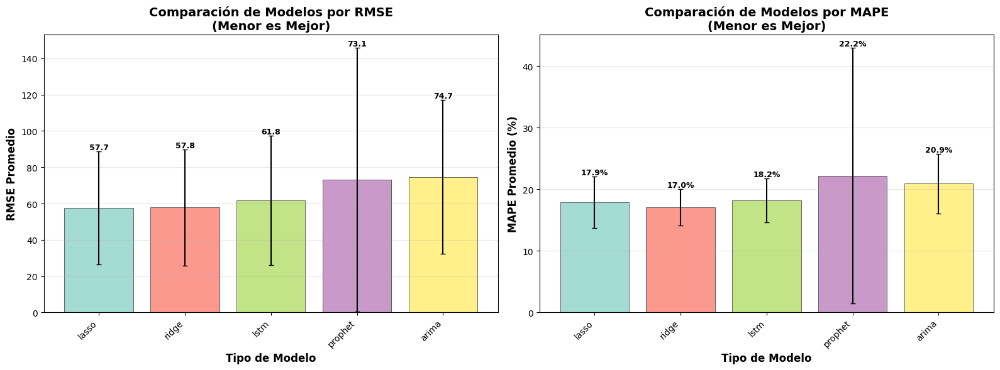


4️⃣ Encontrando mejor modelo por producto...
🏆 Producto 100: Mejor modelo = ridge (RMSE=32.31)
🏆 Producto 101: Mejor modelo = lasso (RMSE=97.82)
🏆 Producto 102: Mejor modelo = prophet (RMSE=59.94)
🏆 Producto 103: Mejor modelo = prophet (RMSE=33.65)
🏆 Producto 104: Mejor modelo = ridge (RMSE=20.63)
🏆 Producto 105: Mejor modelo = prophet (RMSE=33.73)
🏆 Producto 106: Mejor modelo = prophet (RMSE=82.45)
🏆 Producto 107: Mejor modelo = lasso (RMSE=55.21)
🏆 Producto 108: Mejor modelo = prophet (RMSE=50.90)
🏆 Producto 109: Mejor modelo = ridge (RMSE=29.35)
🏆 Producto 10: Mejor modelo = prophet (RMSE=43.99)
🏆 Producto 110: Mejor modelo = prophet (RMSE=53.60)
🏆 Producto 111: Mejor modelo = lstm (RMSE=85.55)
🏆 Producto 112: Mejor modelo = prophet (RMSE=44.48)
🏆 Producto 113: Mejor modelo = ridge (RMSE=11.52)
🏆 Producto 114: Mejor modelo = ridge (RMSE=42.40)
🏆 Producto 115: Mejor modelo = lasso (RMSE=71.32)
🏆 Producto 116: Mejor modelo = prophet (RMSE=27.54)
🏆 Producto 117: Mejor modelo = lasso (

,Tipo_Modelo,RMSE_Promedio,RMSE_Std,MAPE_Promedio,MAPE_Std,Num_Productos,RMSE_Min,RMSE_Max,Ranking
1,lasso,57.662717,31.095376,17.913967,4.185266,135,7.822868,168.558999,1
4,ridge,57.819407,32.064897,17.031338,2.974449,135,6.718955,165.612691,2
2,lstm,61.837768,35.616076,18.180320,3.535698,127,7.019279,183.528870,3
3,prophet,73.112106,72.636669,22.172709,20.748265,135,7.543675,677.563917,4
0,arima,74.717155,42.573546,20.899265,4.858642,134,7.586938,191.097113,5



📋 MAPPING DE PRODUCTOS A MEJORES MODELOS:


,id_producto,mejor_modelo,tipo_modelo,rmse,mape
46,1,best_model_producto_1_ridge.pkl,ridge,13.222342,20.985203
57,2,best_model_producto_2_lstm.pkl,lstm,69.794350,16.028735
68,3,prophet_model_producto_3.json,prophet,80.876745,14.435407
79,4,best_model_producto_4_lasso.pkl,lasso,26.731922,11.744898
90,5,best_model_producto_5_ridge.pkl,ridge,15.530554,16.803874
...,...,...,...,...,...
34,131,best_model_producto_131_ridge.pkl,ridge,18.544173,17.227685
35,132,prophet_model_producto_132.json,prophet,36.777994,12.078271
36,133,prophet_model_producto_133.json,prophet,16.930328,15.505022
37,134,prophet_model_producto_134.json,prophet,81.536516,13.574440


In [1]:


# Importar y ejecutar el análisis de selección de mejores modelos
import sys
sys.path.append('.')

from Best_model_selection import ejecutar_analisis_completo

# Ejecutar análisis completo
df_resumen, df_mapping, mejores_modelos, codigo_mapping = ejecutar_analisis_completo(
    output_dir='output', 
    modelos_dir='Modelos registrados'
)

# Mostrar resultados principales
print("\n🏆 TABLA RESUMEN POR TIPO DE MODELO:")
print("="*60)
display(df_resumen)

print("\n📋 MAPPING DE PRODUCTOS A MEJORES MODELOS:")
print("="*60)
display(df_mapping)

In [2]:
mapping_actualizado= df_mapping[["id_producto", "mejor_modelo"]]

### 9. Predicción de los datos fuera de la muestra


In [3]:
import importlib
import src.predict_tools
importlib.reload(src.predict_tools)
from src.predict_tools import hacer_predicciones_todos_productos

Importing plotly failed. Interactive plots will not work.


In [6]:
# Crear modelo_mapping actualizado para incluir modelos Prophet
import pandas as pd

# Hacer predicciones con todos los modelos (incluyendo Prophet)
hacer_predicciones_todos_productos(df_test_completo, mapping_actualizado)

Iniciando predicciones para todos los productos...
------------------------------------------------------------
Procesando producto 1 con modelo: best_model_producto_1_ridge.pkl
  🔍 Analizando archivo: best_model_producto_1_ridge.pkl
      - Termina en .json: False
      - Contiene 'prophet': False
  ✅ Detectado como: ridge
  📦 Cargando modelo pickle para tipo: ridge
  🔧 Procesando modelo lineal (RIDGE)
  ✅ Predicciones ridge completadas: 90 registros
Procesando producto 2 con modelo: best_model_producto_2_lstm.pkl
  🔍 Analizando archivo: best_model_producto_2_lstm.pkl
      - Termina en .json: False
      - Contiene 'prophet': False
  ✅ Detectado como: lstm
  📦 Cargando modelo pickle para tipo: lstm
  🧠 Procesando modelo LSTM
  ✅ Predicciones LSTM completadas: 75 registros
Procesando producto 3 con modelo: prophet_model_producto_3.json
  🔍 Analizando archivo: prophet_model_producto_3.json
      - Termina en .json: True
      - Contiene 'prophet': True
  ✅ Detectado como: prophet
  📈 M

c:\Users\dr10a\Desktop\Developer\Sumz\Prueba\env\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


  ✅ Predicciones Prophet completadas: 90 registros
Procesando producto 20 con modelo: best_model_producto_20_lasso.pkl
  🔍 Analizando archivo: best_model_producto_20_lasso.pkl
      - Termina en .json: False
      - Contiene 'prophet': False
  ✅ Detectado como: lasso
  📦 Cargando modelo pickle para tipo: lasso
  🔧 Procesando modelo lineal (LASSO)
  ✅ Predicciones lasso completadas: 90 registros
Procesando producto 21 con modelo: prophet_model_producto_21.json
  🔍 Analizando archivo: prophet_model_producto_21.json
      - Termina en .json: True
      - Contiene 'prophet': True
  ✅ Detectado como: prophet
  📈 Modelo Prophet identificado, se cargará directamente desde JSON
  📈 Procesando modelo Prophet
  ✅ Predicciones Prophet completadas: 90 registros
Procesando producto 22 con modelo: prophet_model_producto_22.json
  🔍 Analizando archivo: prophet_model_producto_22.json
      - Termina en .json: True
      - Contiene 'prophet': True
  ✅ Detectado como: prophet
  📈 Modelo Prophet identifi

,date,id_producto,demanda
0,2022-12-01,1,51.297831
1,2022-12-02,1,53.106936
2,2022-12-03,1,55.621940
3,2022-12-04,1,57.431046
4,2022-12-05,1,45.870514
...,...,...,...
11601,2023-02-24,135,425.814394
11602,2023-02-25,135,479.057042
11603,2023-02-26,135,487.092683
11604,2023-02-27,135,404.121173
